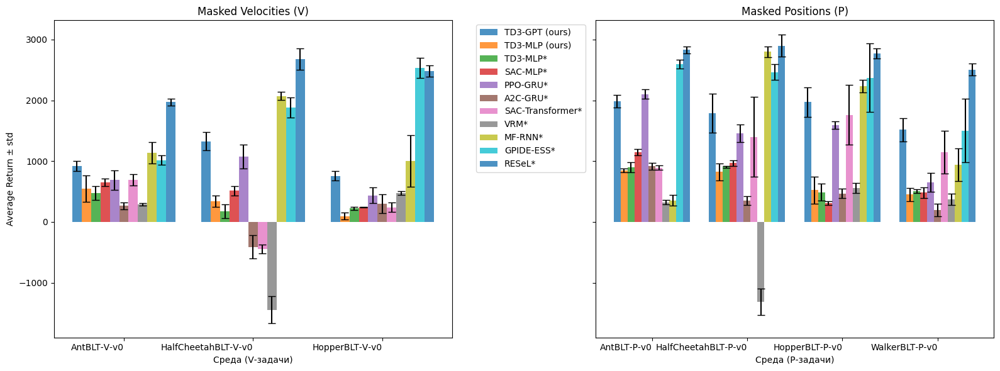

In [3]:
import numpy as np
import matplotlib.pyplot as plt

# 1) Задаём данные

# Имена алгоритмов в том же порядке, что и колонки в таблице
methods = [
    "TD3‑GPT (ours)", "TD3‑MLP (ours)", "TD3‑MLP*", "SAC‑MLP*",
    "PPO‑GRU*", "A2C‑GRU*", "SAC‑Transformer*", "VRM*",
    "MF‑RNN*", "GPIDE‑ESS*", "RESeL*"
]

# Задачи с маскированными скоростями (V)
tasks_V = ["AntBLT‑V‑v0", "HalfCheetahBLT‑V‑v0", "HopperBLT‑V‑v0"]
means_V = np.array([
    [ 922, 549, 476, 651, 690, 264, 692, 291, 1137, 1017, 1971 ],   # Ant
    [1324, 343, 177, 513,1072, -412, -449, -1443,2073,1886,2678],   # HalfCheetah
    [ 759,  98, 223, 243, 438, 301, 240, 476, 1003,2537,2480]       # Hopper
])
stds_V = np.array([
    [ 82, 221, 114,  65, 158,  60,  89,  23, 178,  80,  60 ],
    [150,  96, 115,  77, 195, 191,  72, 220,  69, 165, 176],
    [ 80,  58,  28,   4, 126, 155,  79,  28, 426, 167,  91]
])

# Задачи с маскированными позициями (P)
tasks_P = ["AntBLT‑P‑v0", "HalfCheetahBLT‑P‑v0", "HopperBLT‑P‑v0", "WalkerBLT‑P‑v0"]
means_P = np.array([
    [1984,  846,  897, 1147,2103, 916, 894, 323, 352,2597,2829],  # Ant
    [1788,  824,  906,  970,1460, 353,1400,-1317,2802,2466,2900],  # HalfCheetah
    [1971,  525,  490,  310,1592, 467,1763, 557,2234,2373,2769],  # Hopper
    [1516,  451,  505,  483, 651, 200,1150, 372, 940,1502,2505]   # Walker
])
stds_P = np.array([
    [105,  34,  83,  49,  80,  60,  36,  37,  88,  76,  56],
    [319, 137,  19,  47, 143,  74, 655, 217,  88, 129, 179],
    [243, 224, 140,  35,  60,  78, 493,  85, 102, 568,  85],
    [190, 109,  32,  86, 156, 104, 352,  96, 272, 521,  96]
])

# 2) Параметры отображения
n_methods = len(methods)
bar_width = 0.8 / n_methods  # чтобы все столбцы умещались
opacity = 0.8

# 3) Строим фигуру с двумя подграфиками
fig, (axV, axP) = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

# 3a) Групповой bar plot для V‑задач
xV = np.arange(len(tasks_V))
for i in range(n_methods):
    axV.bar(xV + i*bar_width,
            means_V[:, i],
            bar_width,
            alpha=opacity,
            yerr=stds_V[:, i],
            capsize=4,
            label=methods[i])

axV.set_xlabel("Среда (V‑задачи)")
axV.set_ylabel("Average Return ± std")
axV.set_title("Masked Velocities (V)")
axV.set_xticks(xV + bar_width*(n_methods-1)/2)
axV.set_xticklabels(tasks_V, rotation=0, ha="right")
axV.legend(loc="upper left", bbox_to_anchor=(1.05, 1))

# 3b) Групповой bar plot для P‑задач
xP = np.arange(len(tasks_P))
for i in range(n_methods):
    axP.bar(xP + i*bar_width,
            means_P[:, i],
            bar_width,
            alpha=opacity,
            yerr=stds_P[:, i],
            capsize=4)

axP.set_xlabel("Среда (P‑задачи)")
axP.set_title("Masked Positions (P)")
axP.set_xticks(xP + bar_width*(n_methods-1)/2)
axP.set_xticklabels(tasks_P, rotation=0, ha="right")

plt.tight_layout()
plt.show()


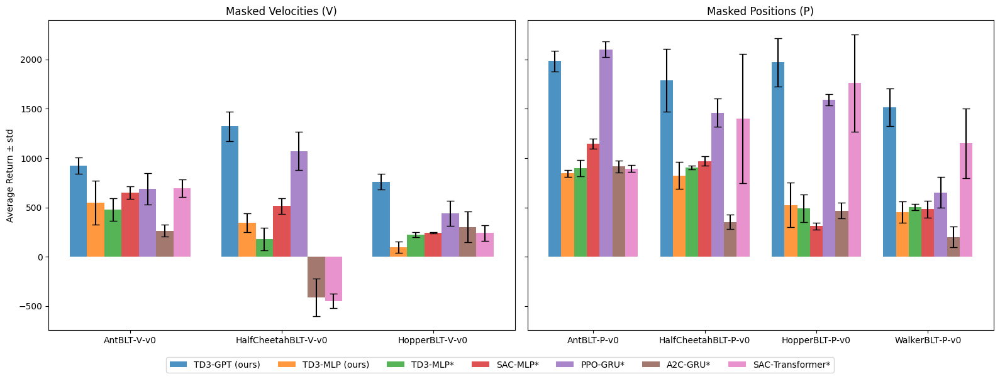

In [11]:
import numpy as np
import matplotlib.pyplot as plt

# 1) Исходные данные
methods = [
    "TD3‑GPT (ours)", "TD3‑MLP (ours)", "TD3‑MLP*", "SAC‑MLP*",
    "PPO‑GRU*", "A2C‑GRU*", "SAC‑Transformer*", "VRM*",
    "MF‑RNN*", "GPIDE‑ESS*", "RESeL*"
]

means_V = np.array([
    [ 922, 549, 476, 651,  690,  264,  692,  291, 1137, 1017, 1971 ],
    [1324, 343, 177, 513, 1072, -412, -449, -1443,2073,1886,2678],
    [ 759,  98, 223, 243,  438,  301,  240,   476,1003,2537,2480]
])
stds_V = np.array([
    [ 82, 221, 114,  65, 158,  60,  89,  23, 178,  80,  60 ],
    [150,  96, 115,  77, 195, 191,  72, 220,  69, 165, 176],
    [ 80,  58,  28,   4, 126, 155,  79,  28, 426, 167,  91]
])

means_P = np.array([
    [1984,  846,  897, 1147,2103, 916,  894,  323,  352,2597,2829],
    [1788,  824,  906,  970,1460, 353, 1400,-1317,2802,2466,2900],
    [1971,  525,  490,  310,1592, 467, 1763,  557,2234,2373,2769],
    [1516,  451,  505,  483, 651, 200, 1150,  372, 940,1502,2505]
])
stds_P = np.array([
    [105,  34,  83, 49,  80,  60,  36,  37,  88,  76,  56],
    [319, 137,  19, 47, 143,  74, 655, 217,  88, 129, 179],
    [243, 224, 140, 35,  60,  78, 493,  85, 102, 568,  85],
    [190, 109,  32, 86, 156, 104, 352,  96, 272, 521,  96]
])

# 2) Фильтрация ненужных методов
unwanted = {"VRM*", "MF‑RNN*", "GPIDE‑ESS*", "ReSeL*".upper()}  # учтём возможные варианты регистра
keep_idx = [i for i, m in enumerate(methods) if m.upper() not in unwanted]

methods_f = [methods[i] for i in keep_idx]
means_V_f = means_V[:, keep_idx]
stds_V_f = stds_V[:, keep_idx]
means_P_f = means_P[:, keep_idx]
stds_P_f = stds_P[:, keep_idx]

# 3) Построение графиков
n_methods = len(methods_f)
bar_width = 0.8 / n_methods
opacity = 0.8

fig, (axV, axP) = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

# 3a) V‑задачи
xV = np.arange(means_V_f.shape[0])
for i in range(n_methods):
    axV.bar(xV + i*bar_width,
            means_V_f[:, i],
            bar_width,
            alpha=opacity,
            yerr=stds_V_f[:, i],
            capsize=4)

# axV.set_xlabel("Среда (V‑задачи)")
axV.set_ylabel("Average Return ± std")
axV.set_title("Masked Velocities (V)")
axV.set_xticks(xV + bar_width*(n_methods-1)/2)
axV.set_xticklabels(["AntBLT‑V‑v0", "HalfCheetahBLT‑V‑v0", "HopperBLT‑V‑v0"],
                    rotation=0, ha="center")

# 3b) P‑задачи
xP = np.arange(means_P_f.shape[0])
for i in range(n_methods):
    axP.bar(xP + i*bar_width,
            means_P_f[:, i],
            bar_width,
            alpha=opacity,
            yerr=stds_P_f[:, i],
            capsize=4)

# axP.set_xlabel("Среда (P‑задачи)")
axP.set_title("Masked Positions (P)")
axP.set_xticks(xP + bar_width*(n_methods-1)/2)
axP.set_xticklabels(["AntBLT‑P‑v0", "HalfCheetahBLT‑P‑v0", "HopperBLT‑P‑v0", "WalkerBLT‑P‑v0"],
                    rotation=0, ha="center")

# 4) Легенда в одну строку снизу
fig.legend(methods_f, loc='lower center', ncol=n_methods, bbox_to_anchor=(0.5, -0.01))
plt.tight_layout(rect=[0, 0.05, 1, 1])
plt.show()


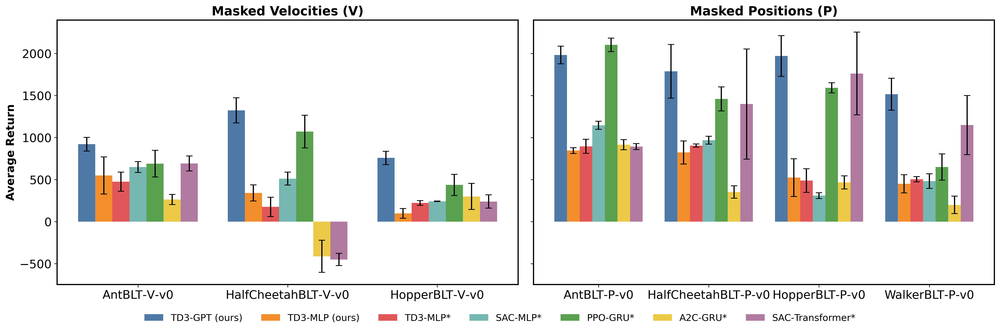

In [36]:
import numpy as np
import matplotlib.pyplot as plt

# -----------------------
# Параметры стилевых настроек
# -----------------------
linewidth = 1.5
fill_alpha = 0.2

plt.rcParams.update({
    'axes.linewidth':    linewidth,
    'axes.grid':         False,
    'grid.alpha':        0.0,
    'grid.linestyle':    '--',
    'font.size':         15,
    'xtick.labelsize':   15,
    'ytick.labelsize':   15,
})

# цветовая палитра для оставшихся методов
# colors = [
#     '#22577A',  # TD3‑GPT
#     '#EE6D84',  # TD3‑MLP (ours)
#     '#0097A6',  # TD3‑MLP*
#     '#7209B7',  # SAC‑MLP*
#     '#FFD23F',  # PPO‑GRU*
#     '#8AC926',  # A2C‑GRU*
#     '#FF595E',  # SAC‑Transformer*
# ]

colors = [
    "#4E79A7",  # синий
    "#F28E2B",  # оранжевый
    "#E15759",  # красный
    "#76B7B2",  # бирюзовый
    "#59A14F",  # зелёный
    "#EDC948",  # жёлтый
    "#B07AA1",  # фиолетовый
]


# -----------------------
# Исходные данные
# -----------------------
methods = [
    "TD3‑GPT (ours)", "TD3‑MLP (ours)", "TD3‑MLP*", "SAC‑MLP*",
    "PPO‑GRU*", "A2C‑GRU*", "SAC‑Transformer*",
    # мы убрали VRM*, MF‑RNN*, GPIDE‑ESS*, RESeL*
]

# V‑задачи
tasks_V = ["AntBLT‑V‑v0", "HalfCheetahBLT‑V‑v0", "HopperBLT‑V‑v0"]
means_V = np.array([
    [ 922,  549,  476,  651,  690,  264,  692],
    [1324,  343,  177,  513, 1072, -412, -449],
    [ 759,   98,  223,  243,  438,  301,  240],
])
stds_V = np.array([
    [ 82, 221, 114,  65, 158,  60,  89 ],
    [150,  96, 115,  77, 195, 191,  72 ],
    [ 80,  58,  28,   4, 126, 155,  79 ],
])

# P‑задачи
tasks_P = ["AntBLT‑P‑v0", "HalfCheetahBLT‑P‑v0", "HopperBLT‑P‑v0", "WalkerBLT‑P‑v0"]
means_P = np.array([
    [1984,  846,  897, 1147,2103, 916,  894],
    [1788,  824,  906,  970,1460, 353, 1400],
    [1971,  525,  490,  310,1592, 467, 1763],
    [1516,  451,  505,  483,  651, 200, 1150],
])
stds_P = np.array([
    [105,  34,  83,  49,  80,  60,  36 ],
    [319, 137,  19,  47, 143,  74, 655 ],
    [243, 224, 140,  35,  60,  78, 493 ],
    [190, 109,  32,  86, 156, 104, 352 ],
])

# -----------------------
# Построение графиков
# -----------------------
n_methods = len(methods)
bar_width = 0.8 / n_methods
fig, (axV, axP) = plt.subplots(1, 2, figsize=(18, 6), sharey=True, dpi=300)

# V‑задачи
xV = np.arange(len(tasks_V))
for i in range(n_methods):
    axV.bar(
        xV + i*bar_width,
        means_V[:, i],
        bar_width,
        yerr=stds_V[:, i],
        capsize=4,
        # linewidth=linewidth,
        # edgecolor='black',
        color=colors[i],
        # alpha=0.9,
        label=methods[i]
    )
axV.set_xticks(xV + bar_width*(n_methods-1)/2)
axV.set_xticklabels(tasks_V, rotation=0, ha="center")
# axV.set_xlabel("Среда (V‑задачи)", fontweight='bold', fontsize=14)
axV.set_ylabel("Average Return", fontweight='bold', fontsize=14)
axV.set_title("Masked Velocities (V)", fontweight='bold', fontsize=16)

# P‑задачи
xP = np.arange(len(tasks_P))
for i in range(n_methods):
    axP.bar(
        xP + i*bar_width,
        means_P[:, i],
        bar_width,
        yerr=stds_P[:, i],
        capsize=4,
        # linewidth=linewidth,
        # edgecolor='black',
        color=colors[i],
        # alpha=0.9,
    )
axP.set_xticks(xP + bar_width*(n_methods-1)/2)
axP.set_xticklabels(tasks_P, rotation=0, ha="center")
# axP.set_xlabel("Среда (P‑задачи)", fontweight='bold', fontsize=14)
axP.set_title("Masked Positions (P)", fontweight='bold', fontsize=16)

# Легенда в одну строку снизу
fig.legend(
    methods,
    loc='lower center',
    ncol=n_methods,
    fontsize=12,
    frameon=False,
    bbox_to_anchor=(0.5, -0.001)
)

plt.tight_layout(rect=[0, 0.05, 1, 1])
output_filename = f"./POMDP_bars.png"
plt.savefig(output_filename, format='png', dpi=300)
plt.show()




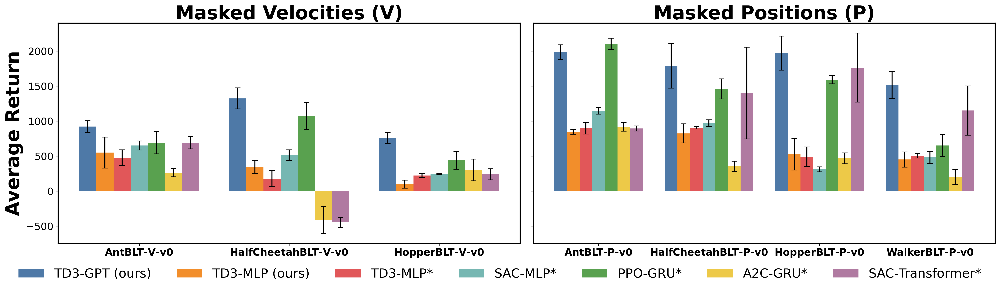

In [34]:
import numpy as np
import matplotlib.pyplot as plt

# -----------------------
# Параметры стилевых настроек
# -----------------------
linewidth = 1.5
fill_alpha = 0.2

plt.rcParams.update({
    'axes.linewidth':    linewidth,
    'axes.grid':         False,
    'grid.alpha':        0.0,
    'grid.linestyle':    '--',
    'font.size':         15,
    'xtick.labelsize':   15,
    'ytick.labelsize':   15,
})

# цветовая палитра для оставшихся методов
# colors = [
#     '#22577A',  # TD3‑GPT
#     '#EE6D84',  # TD3‑MLP (ours)
#     '#0097A6',  # TD3‑MLP*
#     '#7209B7',  # SAC‑MLP*
#     '#FFD23F',  # PPO‑GRU*
#     '#8AC926',  # A2C‑GRU*
#     '#FF595E',  # SAC‑Transformer*
# ]

colors = [
    "#4E79A7",  # синий
    "#F28E2B",  # оранжевый
    "#E15759",  # красный
    "#76B7B2",  # бирюзовый
    "#59A14F",  # зелёный
    "#EDC948",  # жёлтый
    "#B07AA1",  # фиолетовый
]


# -----------------------
# Исходные данные
# -----------------------
methods = [
    "TD3‑GPT (ours)", "TD3‑MLP (ours)", "TD3‑MLP*", "SAC‑MLP*",
    "PPO‑GRU*", "A2C‑GRU*", "SAC‑Transformer*",
    # мы убрали VRM*, MF‑RNN*, GPIDE‑ESS*, RESeL*
]

# V‑задачи
tasks_V = ["AntBLT‑V‑v0", "HalfCheetahBLT‑V‑v0", "HopperBLT‑V‑v0"]
means_V = np.array([
    [ 922,  549,  476,  651,  690,  264,  692],
    [1324,  343,  177,  513, 1072, -412, -449],
    [ 759,   98,  223,  243,  438,  301,  240],
])
stds_V = np.array([
    [ 82, 221, 114,  65, 158,  60,  89 ],
    [150,  96, 115,  77, 195, 191,  72 ],
    [ 80,  58,  28,   4, 126, 155,  79 ],
])

# P‑задачи
tasks_P = ["AntBLT‑P‑v0", "HalfCheetahBLT‑P‑v0", "HopperBLT‑P‑v0", "WalkerBLT‑P‑v0"]
means_P = np.array([
    [1984,  846,  897, 1147,2103, 916,  894],
    [1788,  824,  906,  970,1460, 353, 1400],
    [1971,  525,  490,  310,1592, 467, 1763],
    [1516,  451,  505,  483,  651, 200, 1150],
])
stds_P = np.array([
    [105,  34,  83,  49,  80,  60,  36 ],
    [319, 137,  19,  47, 143,  74, 655 ],
    [243, 224, 140,  35,  60,  78, 493 ],
    [190, 109,  32,  86, 156, 104, 352 ],
])

# -----------------------
# Построение графиков
# -----------------------
n_methods = len(methods)
bar_width = 0.8 / n_methods
fig, (axV, axP) = plt.subplots(1, 2, figsize=(21, 6), sharey=True, dpi=300)

# V‑задачи
xV = np.arange(len(tasks_V))
for i in range(n_methods):
    axV.bar(
        xV + i*bar_width,
        means_V[:, i],
        bar_width,
        yerr=stds_V[:, i],
        capsize=4,
        # linewidth=linewidth,
        # edgecolor='black',
        color=colors[i],
        # alpha=0.9,
        label=methods[i]
    )
axV.set_xticks(xV + bar_width*(n_methods-1)/2)
axV.set_xticklabels(tasks_V, rotation=0, fontweight='bold', ha="center")
# axV.set_xlabel("Среда (V‑задачи)", fontweight='bold', fontsize=14)
axV.set_ylabel("Average Return", fontweight='bold', fontsize=28)
axV.set_title("Masked Velocities (V)", fontweight='bold', fontsize=28)

# P‑задачи
xP = np.arange(len(tasks_P))
for i in range(n_methods):
    axP.bar(
        xP + i*bar_width,
        means_P[:, i],
        bar_width,
        yerr=stds_P[:, i],
        capsize=4,
        # linewidth=linewidth,
        # edgecolor='black',
        color=colors[i],
        # alpha=0.9,
    )
axP.set_xticks(xP + bar_width*(n_methods-1)/2)
axP.set_xticklabels(tasks_P, rotation=0, fontweight='bold', ha="center")
# axP.set_xlabel("Среда (P‑задачи)", fontweight='bold', fontsize=14)
axP.set_title("Masked Positions (P)", fontweight='bold', fontsize=28)

# Легенда в одну строку снизу
fig.legend(
    methods,
    loc='lower center',
    ncol=n_methods,
    fontsize=19,
    frameon=False,
    bbox_to_anchor=(0.5, -0.03)
)

plt.tight_layout(rect=[0, 0.05, 1, 1])
output_filename = f"./POMDP_bars.png"
plt.savefig(output_filename, format='png', dpi=600)
plt.show()




Daniil test


./test/test
event file processing! ./test/test/events.out.tfevents.1737631332.64c82f61f974.20530.1
event file processing! ./test/test/events.out.tfevents.1737570925.64c82f61f974.20530.0
metric_extracted!
df processing!
df processing!


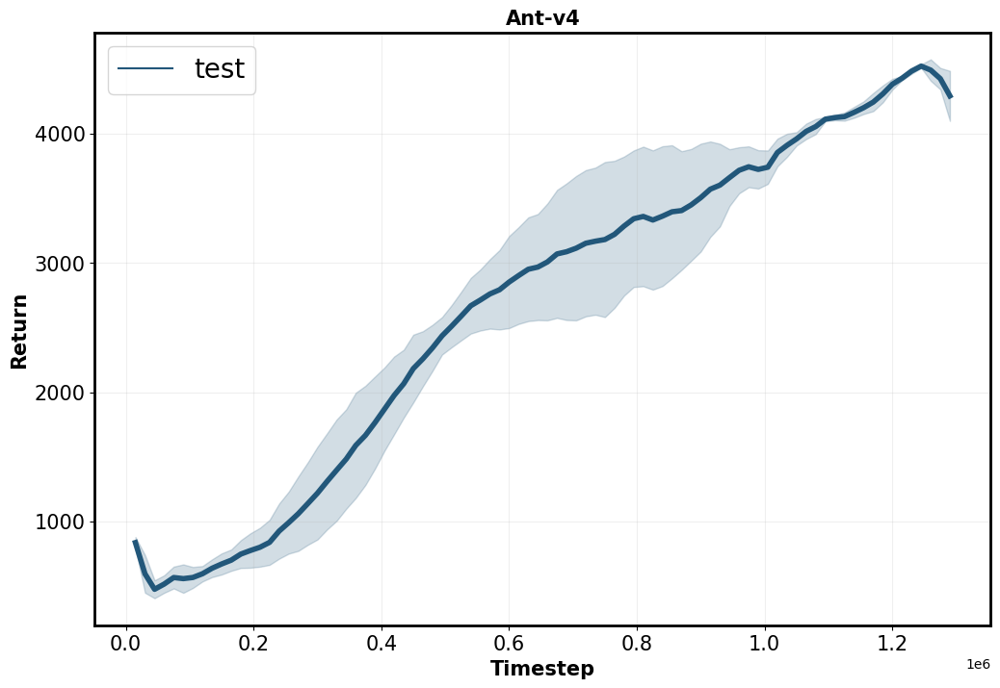

In [50]:
import os
import tensorflow as tf
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Цвета для графиков в формате HEX
palette = ['#22577A', '#38A3A5', '#57CC99', '#6930c3']

# Функция для нормализации шагов, чтобы шаги с разными интервалами не мешали сглаживанию
def normalize_steps(df, step_interval=1000):
    df['NormalizedStep'] = (df['Step'] // step_interval) * step_interval
    return df

# Функция для сглаживания данных с помощью скользящего среднего
def smooth_data(df, window_size=10):
    df = df.sort_values('Step')  # Убедимся, что данные отсортированы по шагам
    df['SmoothedValue'] = df['Value'].rolling(window=window_size, min_periods=1).mean()
    return df

# Функция для чтения значений метрики из логов TensorBoard
def extract_metric_from_events(logdir, metric_name):
    # Получаем список файлов с логами
    event_files = [os.path.join(logdir, f) for f in os.listdir(logdir) if 'events.out.tfevents' in f]
    
    all_data = []
    # Читаем каждый лог-файл
    for event_file in event_files:
        print(f'event file processing! {event_file}')
        steps = []
        values = []
        for e in tf.compat.v1.train.summary_iterator(event_file):
            for v in e.summary.value:
                # print(v.tag)
                if v.tag == metric_name:
                    steps.append(e.step)
                    values.append(v.simple_value)
        
        df = pd.DataFrame({'Step': steps, 'Value': values})
        all_data.append(df)
    
    return all_data

# Функция для улучшенного оформления графиков
def customize_plot(ax, grid_alpha=0.5, line_width=2, font_size=12, font_weight='bold', tick_params_size=10, border_width=2):
    # Настройка толщины линий
    for line in ax.lines:
        line.set_linewidth(line_width)
    
    # Настройка сетки
    ax.grid(True, alpha=grid_alpha)
    
    # Настройка шрифта для заголовков, осей и легенды
    ax.set_title(ax.get_title(), fontsize=font_size, fontweight=font_weight)
    ax.set_xlabel(ax.get_xlabel(), fontsize=font_size, fontweight=font_weight)
    ax.set_ylabel(ax.get_ylabel(), fontsize=font_size, fontweight=font_weight)
    
    # Настройка размера делений осей
    ax.tick_params(axis='both', which='major', labelsize=tick_params_size)
    
    # Настройка толщины рамки графика
    for spine in ax.spines.values():
        spine.set_linewidth(border_width)

# Функция для обработки всех подпапок и рисования графиков
def plot_metrics_from_subfolders(main_logdir, metric_name, palette, window_size=10, step_interval=1000):
    subfolders = [os.path.join(main_logdir, f) for f in os.listdir(main_logdir) if os.path.isdir(os.path.join(main_logdir, f))]
    
    plt.figure(figsize=(12, 8))
    
    for idx, subfolder in enumerate(subfolders):
        print(subfolder)
        color = palette[idx % len(palette)]  # Берем цвет из палитры циклично
        
        all_data = extract_metric_from_events(subfolder, metric_name)
        print('metric_extracted!')
        if all_data[0].empty:
            all_data = extract_metric_from_events(subfolder, 'return')

        smoothed_data = []
        for df in all_data:
            print('df processing!')
            df = normalize_steps(df, step_interval)
            df_smoothed = smooth_data(df, window_size)
            smoothed_data.append(df_smoothed[['NormalizedStep', 'SmoothedValue']])

        combined_data = pd.concat(smoothed_data).groupby('NormalizedStep').agg(
            mean_value=('SmoothedValue', 'mean'),
            std_value=('SmoothedValue', 'std')
        ).reset_index()

        combined_data['mean_value'] = combined_data['mean_value'] #.clip(upper=1)
        combined_data['std_upper'] = combined_data['mean_value'] + combined_data['std_value'] #np.minimum(combined_data['mean_value'] + combined_data['std_value'], 1.005)
        combined_data['std_lower'] = combined_data['mean_value'] - combined_data['std_value']
        
        sns.lineplot(x='NormalizedStep', y='mean_value', data=combined_data, label=f'{os.path.basename(subfolder)}', color=color)
        
        plt.fill_between(
            combined_data['NormalizedStep'],
            combined_data['std_lower'],
            combined_data['std_upper'],
            alpha=0.2, color=color
        )
    
    ax = plt.gca()
    
    plt.title("Ant-v4", fontsize=22, fontweight='bold')
    plt.xlabel('Timestep', fontsize=12, fontweight='bold')
    plt.ylabel('Return', fontsize=12, fontweight='bold')
    # plt.xlabel('Step', fontsize=12, fontweight='bold')
    # plt.ylabel(metric_name, fontsize=12, fontweight='bold')
    
    plt.legend(loc='upper left', fontsize=20)
    # plt.ylim(bottom=None, top=1.2)
    # plt.xlim(0, 1600001)
    
    # Применяем настройки оформления
    customize_plot(ax, grid_alpha=0.2, line_width=4, font_size=15, font_weight='bold', tick_params_size=15, border_width=2)
    output_filename = f"{main_logdir}/graph.png"
    plt.savefig(output_filename, format='png', dpi=300, bbox_inches='tight')
    plt.show()

# Путь к папке с подпапками логов
main_logdir = './test'  # Укажите путь к папке, где находятся подпапки с логами
metric_name = 'Eval_reward'  # Укажите название метрики


# Рисуем графики для всех подпапок с указанным окном сглаживания
plot_metrics_from_subfolders(main_logdir, metric_name, palette, window_size=100, step_interval=15000)




In [39]:
ls ./test

events.out.tfevents.1737570925.64c82f61f974.20530.0
test/


# Experiment 1

./DONE_Experiment_1_JUST_WORKS_ppo_nano_gpt_vs_mlp/Ant/PPO_MLP
event file processing! ./DONE_Experiment_1_JUST_WORKS_ppo_nano_gpt_vs_mlp/Ant/PPO_MLP/events.out.tfevents.1737450224.nsi-3-kachaev-0.1001726.0
event file processing! ./DONE_Experiment_1_JUST_WORKS_ppo_nano_gpt_vs_mlp/Ant/PPO_MLP/events.out.tfevents.1737423438.nsi-3-kachaev-0.998472.0
event file processing! ./DONE_Experiment_1_JUST_WORKS_ppo_nano_gpt_vs_mlp/Ant/PPO_MLP/events.out.tfevents.1737479174.nsi-3-kachaev-0.1054501.0
metric_extracted!
df processing!
df processing!
df processing!
./DONE_Experiment_1_JUST_WORKS_ppo_nano_gpt_vs_mlp/Ant/PPO_GPT
event file processing! ./DONE_Experiment_1_JUST_WORKS_ppo_nano_gpt_vs_mlp/Ant/PPO_GPT/events.out.tfevents.1737424969.nsi-3-kachaev-0.999162.0
event file processing! ./DONE_Experiment_1_JUST_WORKS_ppo_nano_gpt_vs_mlp/Ant/PPO_GPT/events.out.tfevents.1737450224.nsi-3-kachaev-0.1001726.0
event file processing! ./DONE_Experiment_1_JUST_WORKS_ppo_nano_gpt_vs_mlp/Ant/PPO_GPT/events.out.t

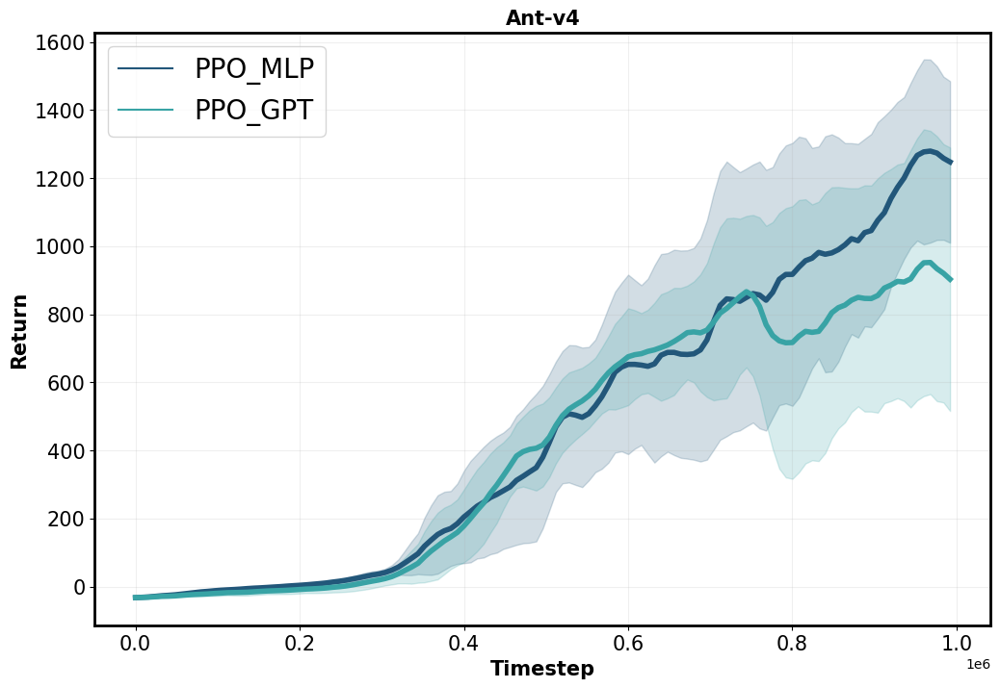

In [32]:
import os
import tensorflow as tf
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Цвета для графиков в формате HEX
palette = ['#22577A', '#38A3A5', '#57CC99', '#6930c3']

# Функция для нормализации шагов, чтобы шаги с разными интервалами не мешали сглаживанию
def normalize_steps(df, step_interval=1000):
    df['NormalizedStep'] = (df['Step'] // step_interval) * step_interval
    return df

# Функция для сглаживания данных с помощью скользящего среднего
def smooth_data(df, window_size=10):
    df = df.sort_values('Step')  # Убедимся, что данные отсортированы по шагам
    df['SmoothedValue'] = df['Value'].rolling(window=window_size, min_periods=1).mean()
    return df

# Функция для чтения значений метрики из логов TensorBoard
def extract_metric_from_events(logdir, metric_name):
    # Получаем список файлов с логами
    event_files = [os.path.join(logdir, f) for f in os.listdir(logdir) if 'events.out.tfevents' in f]
    
    all_data = []
    # Читаем каждый лог-файл
    for event_file in event_files:
        print(f'event file processing! {event_file}')
        steps = []
        values = []
        for e in tf.compat.v1.train.summary_iterator(event_file):
            for v in e.summary.value:
                if v.tag == metric_name:
                    steps.append(e.step)
                    values.append(v.simple_value)
        
        df = pd.DataFrame({'Step': steps, 'Value': values})
        all_data.append(df)
    
    return all_data

# Функция для улучшенного оформления графиков
def customize_plot(ax, grid_alpha=0.5, line_width=2, font_size=12, font_weight='bold', tick_params_size=10, border_width=2):
    # Настройка толщины линий
    for line in ax.lines:
        line.set_linewidth(line_width)
    
    # Настройка сетки
    ax.grid(True, alpha=grid_alpha)
    
    # Настройка шрифта для заголовков, осей и легенды
    ax.set_title(ax.get_title(), fontsize=font_size, fontweight=font_weight)
    ax.set_xlabel(ax.get_xlabel(), fontsize=font_size, fontweight=font_weight)
    ax.set_ylabel(ax.get_ylabel(), fontsize=font_size, fontweight=font_weight)
    
    # Настройка размера делений осей
    ax.tick_params(axis='both', which='major', labelsize=tick_params_size)
    
    # Настройка толщины рамки графика
    for spine in ax.spines.values():
        spine.set_linewidth(border_width)

# Функция для обработки всех подпапок и рисования графиков
def plot_metrics_from_subfolders(main_logdir, metric_name, palette, window_size=10, step_interval=1000):
    subfolders = [os.path.join(main_logdir, f) for f in os.listdir(main_logdir) if os.path.isdir(os.path.join(main_logdir, f))]
    
    plt.figure(figsize=(12, 8))
    
    for idx, subfolder in enumerate(subfolders):
        print(subfolder)
        color = palette[idx % len(palette)]  # Берем цвет из палитры циклично
        
        all_data = extract_metric_from_events(subfolder, metric_name)
        print('metric_extracted!')
        if all_data[0].empty:
            all_data = extract_metric_from_events(subfolder, 'return')

        smoothed_data = []
        for df in all_data:
            print('df processing!')
            df = normalize_steps(df, step_interval)
            df_smoothed = smooth_data(df, window_size)
            smoothed_data.append(df_smoothed[['NormalizedStep', 'SmoothedValue']])

        combined_data = pd.concat(smoothed_data).groupby('NormalizedStep').agg(
            mean_value=('SmoothedValue', 'mean'),
            std_value=('SmoothedValue', 'std')
        ).reset_index()

        combined_data['mean_value'] = combined_data['mean_value'] #.clip(upper=1)
        combined_data['std_upper'] = combined_data['mean_value'] + combined_data['std_value'] #np.minimum(combined_data['mean_value'] + combined_data['std_value'], 1.005)
        combined_data['std_lower'] = combined_data['mean_value'] - combined_data['std_value']
        
        sns.lineplot(x='NormalizedStep', y='mean_value', data=combined_data, label=f'{os.path.basename(subfolder)}', color=color)
        
        plt.fill_between(
            combined_data['NormalizedStep'],
            combined_data['std_lower'],
            combined_data['std_upper'],
            alpha=0.2, color=color
        )
    
    ax = plt.gca()
    
    plt.title("Ant-v4", fontsize=22, fontweight='bold')
    plt.xlabel('Timestep', fontsize=12, fontweight='bold')
    plt.ylabel('Return', fontsize=12, fontweight='bold')
    # plt.xlabel('Step', fontsize=12, fontweight='bold')
    # plt.ylabel(metric_name, fontsize=12, fontweight='bold')
    
    plt.legend(loc='upper left', fontsize=20)
    # plt.ylim(bottom=None, top=1.2)
    # plt.xlim(0, 1600001)
    
    # Применяем настройки оформления
    customize_plot(ax, grid_alpha=0.2, line_width=4, font_size=15, font_weight='bold', tick_params_size=15, border_width=2)
    output_filename = f"{main_logdir}/graph.png"
    plt.savefig(output_filename, format='png', dpi=300, bbox_inches='tight')
    plt.show()

# Путь к папке с подпапками логов
main_logdir = './DONE_Experiment_1_JUST_WORKS_ppo_nano_gpt_vs_mlp/Ant'  # Укажите путь к папке, где находятся подпапки с логами
metric_name = 'eval/episodic_return'  # Укажите название метрики


# Рисуем графики для всех подпапок с указанным окном сглаживания
plot_metrics_from_subfolders(main_logdir, metric_name, palette, window_size=10, step_interval=8000)




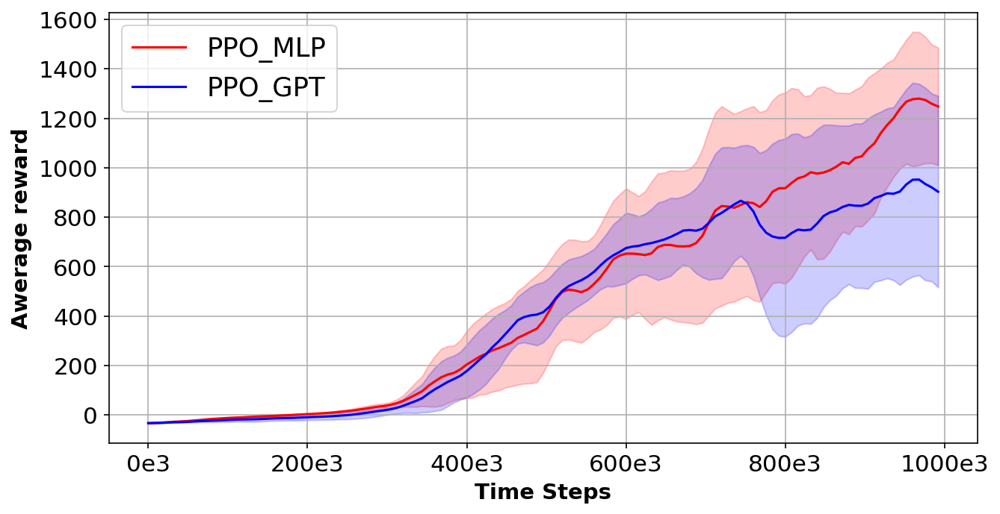

In [10]:
import os
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Функция для нормализации шагов

def normalize_steps(df, step_interval=1000):
    df['NormalizedStep'] = (df['Step'] // step_interval) * step_interval
    return df

# Функция для сглаживания данных

def smooth_data(df, window_size=10):
    df = df.sort_values('Step')
    df['SmoothedValue'] = df['Value'].rolling(window=window_size, min_periods=1).mean()
    return df

# Функция для чтения значений метрики из логов TensorBoard

def extract_metric_from_events(logdir, metric_name):
    event_files = [os.path.join(logdir, f) for f in os.listdir(logdir) if 'events.out.tfevents' in f]
    all_data = []
    
    for event_file in event_files:
        steps, values = [], []
        for e in tf.compat.v1.train.summary_iterator(event_file):
            for v in e.summary.value:
                if v.tag == metric_name:
                    steps.append(e.step)
                    values.append(v.simple_value)
        df = pd.DataFrame({'Step': steps, 'Value': values})
        all_data.append(df)
    
    return all_data

# Функция для форматирования делений оси X

def format_ticks(x, pos):
    return f"{int(x / 1000)}e3"

# Функция для рисования графиков

def plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000):
    subfolders = [os.path.join(main_logdir, f) for f in os.listdir(main_logdir) if os.path.isdir(os.path.join(main_logdir, f))]
    plt.figure(figsize=(10, 5), dpi=150)
    
    colors = ['red', 'blue', 'green', 'purple']
    
    for idx, subfolder in enumerate(subfolders):
        color = colors[idx % len(colors)]
        all_data = extract_metric_from_events(subfolder, metric_name)
        
        smoothed_data = []
        for df in all_data:
            df = normalize_steps(df, step_interval)
            df_smoothed = smooth_data(df, window_size)
            smoothed_data.append(df_smoothed[['NormalizedStep', 'SmoothedValue']])
        
        combined_data = pd.concat(smoothed_data).groupby('NormalizedStep').agg(
            mean_value=('SmoothedValue', 'mean'),
            std_value=('SmoothedValue', 'std')
        ).reset_index()
        
        plt.plot(combined_data['NormalizedStep'], combined_data['mean_value'], label=f'{os.path.basename(subfolder)}', color=color)
        plt.fill_between(
            combined_data['NormalizedStep'],
            combined_data['mean_value'] - combined_data['std_value'],
            combined_data['mean_value'] + combined_data['std_value'],
            alpha=0.2, color=color
        )
    
    ax = plt.gca()
    ax.xaxis.set_major_formatter(FuncFormatter(format_ticks))
    
    plt.xlabel('Time Steps', fontweight='bold', fontsize=14)
    plt.ylabel('Awerage reward', fontweight='bold', fontsize=14)
    ax.tick_params(axis='both', labelsize=15)
    plt.legend(fontsize=17)
    plt.grid(True)
    output_filename = f"{main_logdir}/graph.png"
    plt.savefig(output_filename, format='png', dpi=300, bbox_inches='tight')
    plt.show()
    
    plt.show()

# Путь к папке с логами
main_logdir = './DONE_Experiment_1_JUST_WORKS_ppo_nano_gpt_vs_mlp/Ant'
metric_name = 'eval/episodic_return'

# Рисуем графики
plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000)


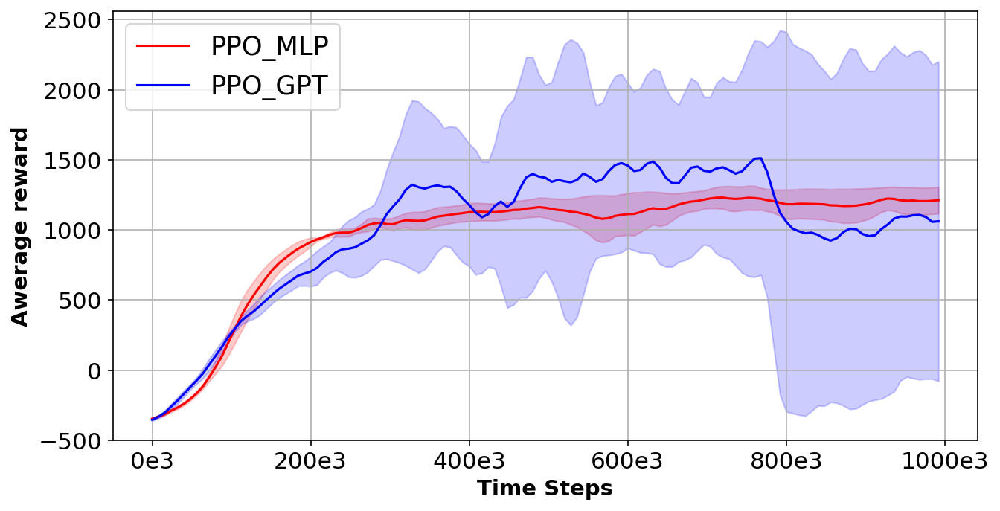

In [11]:
import os
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Функция для нормализации шагов

def normalize_steps(df, step_interval=1000):
    df['NormalizedStep'] = (df['Step'] // step_interval) * step_interval
    return df

# Функция для сглаживания данных

def smooth_data(df, window_size=10):
    df = df.sort_values('Step')
    df['SmoothedValue'] = df['Value'].rolling(window=window_size, min_periods=1).mean()
    return df

# Функция для чтения значений метрики из логов TensorBoard

def extract_metric_from_events(logdir, metric_name):
    event_files = [os.path.join(logdir, f) for f in os.listdir(logdir) if 'events.out.tfevents' in f]
    all_data = []
    
    for event_file in event_files:
        steps, values = [], []
        for e in tf.compat.v1.train.summary_iterator(event_file):
            for v in e.summary.value:
                if v.tag == metric_name:
                    steps.append(e.step)
                    values.append(v.simple_value)
        df = pd.DataFrame({'Step': steps, 'Value': values})
        all_data.append(df)
    
    return all_data

# Функция для форматирования делений оси X

def format_ticks(x, pos):
    return f"{int(x / 1000)}e3"

# Функция для рисования графиков

def plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000):
    subfolders = [os.path.join(main_logdir, f) for f in os.listdir(main_logdir) if os.path.isdir(os.path.join(main_logdir, f))]
    plt.figure(figsize=(10, 5), dpi=150)
    
    colors = ['red', 'blue', 'green', 'purple']
    
    for idx, subfolder in enumerate(subfolders):
        color = colors[idx % len(colors)]
        all_data = extract_metric_from_events(subfolder, metric_name)
        
        smoothed_data = []
        for df in all_data:
            df = normalize_steps(df, step_interval)
            df_smoothed = smooth_data(df, window_size)
            smoothed_data.append(df_smoothed[['NormalizedStep', 'SmoothedValue']])
        
        combined_data = pd.concat(smoothed_data).groupby('NormalizedStep').agg(
            mean_value=('SmoothedValue', 'mean'),
            std_value=('SmoothedValue', 'std')
        ).reset_index()
        
        plt.plot(combined_data['NormalizedStep'], combined_data['mean_value'], label=f'{os.path.basename(subfolder)}', color=color)
        plt.fill_between(
            combined_data['NormalizedStep'],
            combined_data['mean_value'] - combined_data['std_value'],
            combined_data['mean_value'] + combined_data['std_value'],
            alpha=0.2, color=color
        )
    
    ax = plt.gca()
    ax.xaxis.set_major_formatter(FuncFormatter(format_ticks))
    
    plt.xlabel('Time Steps', fontweight='bold', fontsize=14)
    plt.ylabel('Awerage reward', fontweight='bold', fontsize=14)
    ax.tick_params(axis='both', labelsize=15)
    plt.legend(fontsize=17)
    plt.grid(True)
    output_filename = f"{main_logdir}/graph.png"
    plt.savefig(output_filename, format='png', dpi=300, bbox_inches='tight')
    plt.show()
    
    plt.show()

# Путь к папке с логами
main_logdir = './DONE_Experiment_1_JUST_WORKS_ppo_nano_gpt_vs_mlp/HalfCheetah'  # Укажите путь к папке, где находятся подпапки с логами
metric_name = 'eval/episodic_return'  # Укажите название метрикиmetric_name = 'eval/episodic_return'

# Рисуем графики
plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000)


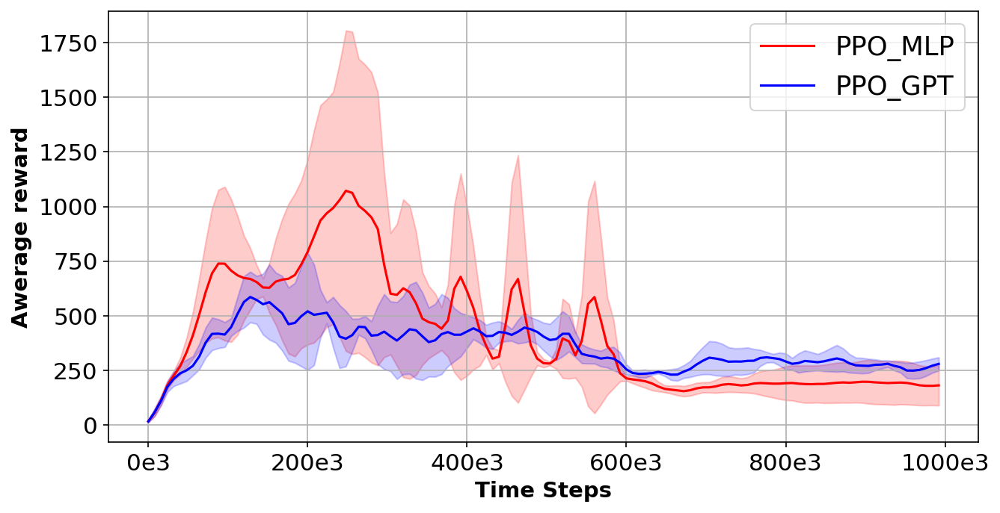

In [12]:
import os
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Функция для нормализации шагов

def normalize_steps(df, step_interval=1000):
    df['NormalizedStep'] = (df['Step'] // step_interval) * step_interval
    return df

# Функция для сглаживания данных

def smooth_data(df, window_size=10):
    df = df.sort_values('Step')
    df['SmoothedValue'] = df['Value'].rolling(window=window_size, min_periods=1).mean()
    return df

# Функция для чтения значений метрики из логов TensorBoard

def extract_metric_from_events(logdir, metric_name):
    event_files = [os.path.join(logdir, f) for f in os.listdir(logdir) if 'events.out.tfevents' in f]
    all_data = []
    
    for event_file in event_files:
        steps, values = [], []
        for e in tf.compat.v1.train.summary_iterator(event_file):
            for v in e.summary.value:
                if v.tag == metric_name:
                    steps.append(e.step)
                    values.append(v.simple_value)
        df = pd.DataFrame({'Step': steps, 'Value': values})
        all_data.append(df)
    
    return all_data

# Функция для форматирования делений оси X

def format_ticks(x, pos):
    return f"{int(x / 1000)}e3"

# Функция для рисования графиков

def plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000):
    subfolders = [os.path.join(main_logdir, f) for f in os.listdir(main_logdir) if os.path.isdir(os.path.join(main_logdir, f))]
    plt.figure(figsize=(10, 5), dpi=150)
    
    colors = ['red', 'blue', 'green', 'purple']
    
    for idx, subfolder in enumerate(subfolders):
        color = colors[idx % len(colors)]
        all_data = extract_metric_from_events(subfolder, metric_name)
        
        smoothed_data = []
        for df in all_data:
            df = normalize_steps(df, step_interval)
            df_smoothed = smooth_data(df, window_size)
            smoothed_data.append(df_smoothed[['NormalizedStep', 'SmoothedValue']])
        
        combined_data = pd.concat(smoothed_data).groupby('NormalizedStep').agg(
            mean_value=('SmoothedValue', 'mean'),
            std_value=('SmoothedValue', 'std')
        ).reset_index()
        
        plt.plot(combined_data['NormalizedStep'], combined_data['mean_value'], label=f'{os.path.basename(subfolder)}', color=color)
        plt.fill_between(
            combined_data['NormalizedStep'],
            combined_data['mean_value'] - combined_data['std_value'],
            combined_data['mean_value'] + combined_data['std_value'],
            alpha=0.2, color=color
        )
    
    ax = plt.gca()
    ax.xaxis.set_major_formatter(FuncFormatter(format_ticks))
    
    plt.xlabel('Time Steps', fontweight='bold', fontsize=14)
    plt.ylabel('Awerage reward', fontweight='bold', fontsize=14)
    ax.tick_params(axis='both', labelsize=15)
    plt.legend(fontsize=17)
    plt.grid(True)
    output_filename = f"{main_logdir}/graph.png"
    plt.savefig(output_filename, format='png', dpi=300, bbox_inches='tight')
    plt.show()
    
    plt.show()

# Путь к папке с логами
main_logdir = './DONE_Experiment_1_JUST_WORKS_ppo_nano_gpt_vs_mlp/Hopper'  # Укажите путь к папке, где находятся подпапки с логами
metric_name = 'eval/episodic_return'  # Укажите название метрикиmetric_name = 'eval/episodic_return'

# Рисуем графики
plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000)




# MANISKILL

# PickCube

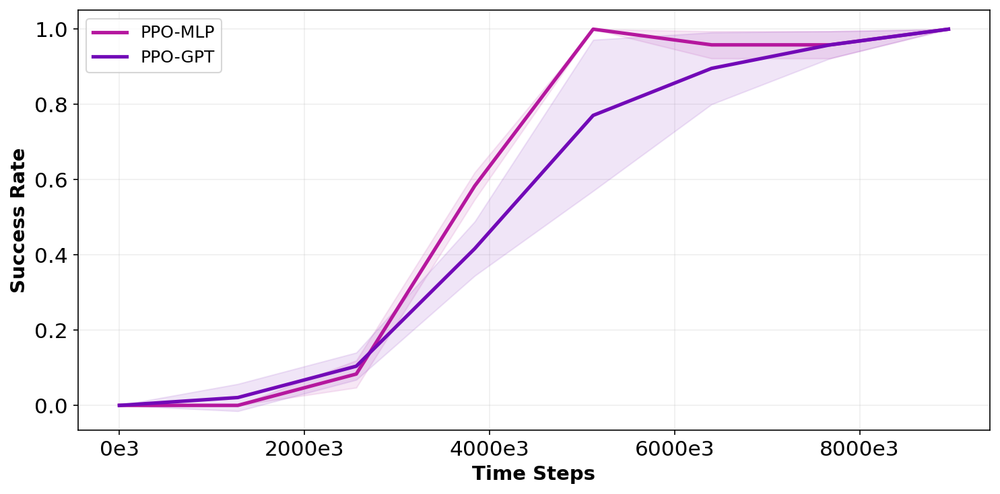

In [35]:
import os
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Устанавливаем цветовую палитру
colors = ['#b5179e','#7209b7',]  # '#22577A', '#0097A6', '#EE6D84', 
linewidth = 2.5
fill_alpha = 0.1

def normalize_steps(df, step_interval=1000):
    df['NormalizedStep'] = (df['Step'] // step_interval) * step_interval
    return df

def smooth_data(df, window_size=10):
    df = df.sort_values('Step')
    df['SmoothedValue'] = df['Value'].rolling(window=window_size, min_periods=1).mean()
    return df

def extract_metric_from_events(logdir, metric_name):
    event_files = [os.path.join(logdir, f) for f in os.listdir(logdir) if 'events.out.tfevents' in f]
    all_data = []
    
    for event_file in event_files:
        steps, values = [], []
        for e in tf.compat.v1.train.summary_iterator(event_file):
            for v in e.summary.value:
                if v.tag == metric_name:
                    steps.append(e.step)
                    values.append(v.simple_value)
        df = pd.DataFrame({'Step': steps, 'Value': values})
        all_data.append(df)
    
    return all_data

def format_ticks(x, pos):
    return f"{int(x / 1000)}e3"

def plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000):
    subfolders = [os.path.join(main_logdir, f) for f in os.listdir(main_logdir) if os.path.isdir(os.path.join(main_logdir, f))]
    plt.figure(figsize=(10, 5), dpi=150)
    
    for idx, subfolder in enumerate(subfolders):
        color = colors[idx % len(colors)]
        all_data = extract_metric_from_events(subfolder, metric_name)
        
        smoothed_data = []
        for df in all_data:
            df = normalize_steps(df, step_interval)
            df_smoothed = smooth_data(df, window_size)
            smoothed_data.append(df_smoothed[['NormalizedStep', 'SmoothedValue']])
        
        combined_data = pd.concat(smoothed_data).groupby('NormalizedStep').agg(
            mean_value=('SmoothedValue', 'mean'),
            std_value=('SmoothedValue', 'std')
        ).reset_index()
        
        plt.plot(combined_data['NormalizedStep'], combined_data['mean_value'], label=f'{os.path.basename(subfolder)}', color=color, linewidth=linewidth, zorder=5)
        plt.fill_between(
            combined_data['NormalizedStep'],
            combined_data['mean_value'] - combined_data['std_value'],
            combined_data['mean_value'] + combined_data['std_value'],
            alpha=fill_alpha, color=color, zorder=3
        )
    
    ax = plt.gca()
    ax.xaxis.set_major_formatter(FuncFormatter(format_ticks))
    ax.tick_params(axis='both', labelsize=15)
    ax.grid(True, alpha=0.2)
    
    plt.xlabel('Time Steps', fontweight='bold', fontsize=14)
    plt.ylabel('Success Rate', fontweight='bold', fontsize=14)
    plt.legend(fontsize=12, loc='best')
    plt.tight_layout()
    
    output_filename = f"{main_logdir}/graph_styled.png"
    plt.savefig(output_filename, format='png', dpi=300, bbox_inches='tight')
    plt.show()

# Путь к папке с подпапками логов
main_logdir = './DONE_Experiment_1_Maniskill/PickCube'  
metric_name = 'eval/success_once'  

# Рисуем графики с новым стилем
plot_metrics_from_subfolders(main_logdir, metric_name, window_size=2, step_interval=1000)


# off pick cube

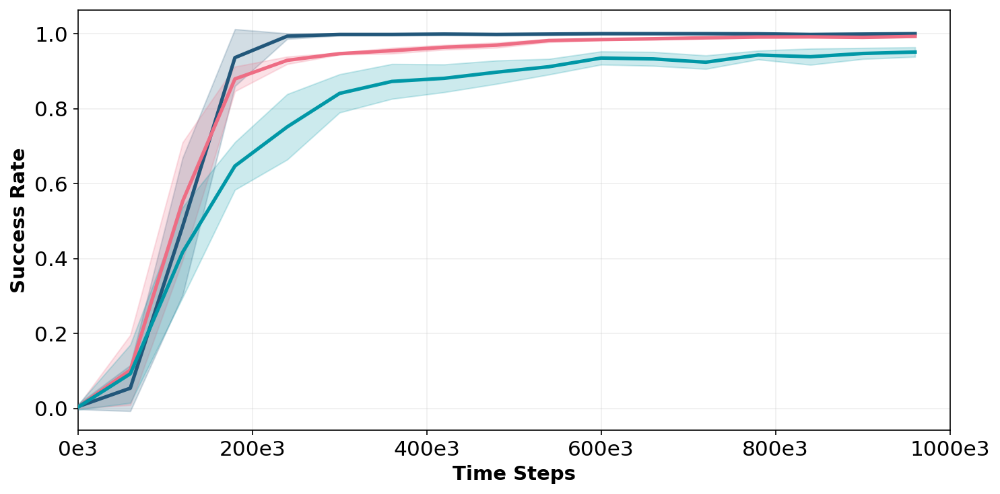

In [43]:
import os
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Устанавливаем цветовую палитру
colors = ['#22577A', '#EE6D84', '#0097A6',] #['#b5179e', '#22577A', '#EE6D84', '#7209b7', '#0097A6',] # '#22577A', '#0097A6', '#EE6D84', 
linewidth = 2.5
fill_alpha = 0.2

def normalize_steps(df, step_interval=1000):
    df['NormalizedStep'] = (df['Step'] // step_interval) * step_interval
    return df

def smooth_data(df, window_size=10):
    df = df.sort_values('Step')
    df['SmoothedValue'] = df['Value'].rolling(window=window_size, min_periods=1).mean()
    return df

def extract_metric_from_events(logdir, metric_name):
    event_files = [os.path.join(logdir, f) for f in os.listdir(logdir) if 'events.out.tfevents' in f]
    all_data = []
    
    for event_file in event_files:
        steps, values = [], []
        for e in tf.compat.v1.train.summary_iterator(event_file):
            for v in e.summary.value:
                if v.tag == metric_name:
                    steps.append(e.step)
                    values.append(v.simple_value)
        df = pd.DataFrame({'Step': steps, 'Value': values})
        all_data.append(df)
    
    return all_data

def format_ticks(x, pos):
    return f"{int(x / 1000)}e3"

def plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000):
    subfolders = [os.path.join(main_logdir, f) for f in os.listdir(main_logdir) if os.path.isdir(os.path.join(main_logdir, f))]
    plt.figure(figsize=(10, 5), dpi=150)
    
    for idx, subfolder in enumerate(subfolders):
        color = colors[idx % len(colors)]
        all_data = extract_metric_from_events(subfolder, metric_name)
        
        smoothed_data = []
        for df in all_data:
            df = normalize_steps(df, step_interval)
            df_smoothed = smooth_data(df, window_size)
            smoothed_data.append(df_smoothed[['NormalizedStep', 'SmoothedValue']])
        
        combined_data = pd.concat(smoothed_data).groupby('NormalizedStep').agg(
            mean_value=('SmoothedValue', 'mean'),
            std_value=('SmoothedValue', 'std')
        ).reset_index()
        
        plt.plot(combined_data['NormalizedStep'], combined_data['mean_value'], label=f'{os.path.basename(subfolder)}', color=color, linewidth=linewidth, zorder=5)
        plt.fill_between(
            combined_data['NormalizedStep'],
            combined_data['mean_value'] - combined_data['std_value'],
            combined_data['mean_value'] + combined_data['std_value'],
            alpha=fill_alpha, color=color, zorder=3
        )
    
    ax = plt.gca()
    ax.xaxis.set_major_formatter(FuncFormatter(format_ticks))
    ax.tick_params(axis='both', labelsize=15)
    ax.grid(True, alpha=0.2)
    
    plt.xlim(0, 1_000_000)
    plt.xlabel('Time Steps', fontweight='bold', fontsize=14)
    plt.ylabel('Success Rate', fontweight='bold', fontsize=14)
    # plt.legend(fontsize=12, loc='best')
    plt.tight_layout()
    
    output_filename = f"{main_logdir}/graph_styled.png"
    plt.savefig(output_filename, format='png', dpi=300, bbox_inches='tight')
    plt.show()

# Путь к папке с подпапками логов
main_logdir = './DONE_Experiment_1_Maniskill/off_PickCube'  
metric_name = 'eval/success_once'  

# Рисуем графики с новым стилем
plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=60000)


# TriFinger

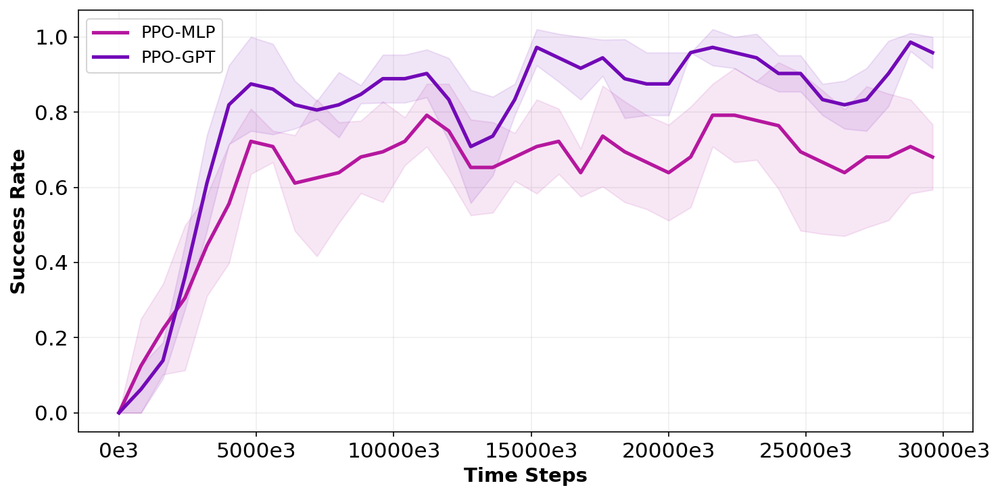

In [33]:
import os
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Устанавливаем цветовую палитру
colors = ['#b5179e','#7209b7',] #['#7209b7', '#0097A6',] # '#22577A', '#0097A6', '#EE6D84', 
linewidth = 2.5
fill_alpha = 0.1

def normalize_steps(df, step_interval=1000):
    df['NormalizedStep'] = (df['Step'] // step_interval) * step_interval
    return df

def smooth_data(df, window_size=10):
    df = df.sort_values('Step')
    df['SmoothedValue'] = df['Value'].rolling(window=window_size, min_periods=1).mean()
    return df

def extract_metric_from_events(logdir, metric_name):
    event_files = [os.path.join(logdir, f) for f in os.listdir(logdir) if 'events.out.tfevents' in f]
    all_data = []
    
    for event_file in event_files:
        steps, values = [], []
        for e in tf.compat.v1.train.summary_iterator(event_file):
            for v in e.summary.value:
                if v.tag == metric_name:
                    steps.append(e.step)
                    values.append(v.simple_value)
        df = pd.DataFrame({'Step': steps, 'Value': values})
        all_data.append(df)
    
    return all_data

def format_ticks(x, pos):
    return f"{int(x / 1000)}e3"

def plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000):
    subfolders = [os.path.join(main_logdir, f) for f in os.listdir(main_logdir) if os.path.isdir(os.path.join(main_logdir, f))]
    plt.figure(figsize=(10, 5), dpi=150)
    
    for idx, subfolder in enumerate(subfolders):
        color = colors[idx % len(colors)]
        all_data = extract_metric_from_events(subfolder, metric_name)
        
        smoothed_data = []
        for df in all_data:
            df = normalize_steps(df, step_interval)
            df_smoothed = smooth_data(df, window_size)
            smoothed_data.append(df_smoothed[['NormalizedStep', 'SmoothedValue']])
        
        combined_data = pd.concat(smoothed_data).groupby('NormalizedStep').agg(
            mean_value=('SmoothedValue', 'mean'),
            std_value=('SmoothedValue', 'std')
        ).reset_index()
        
        plt.plot(combined_data['NormalizedStep'], combined_data['mean_value'], label=f'{os.path.basename(subfolder)}', color=color, linewidth=linewidth, zorder=5)
        plt.fill_between(
            combined_data['NormalizedStep'],
            combined_data['mean_value'] - combined_data['std_value'],
            combined_data['mean_value'] + combined_data['std_value'],
            alpha=fill_alpha, color=color, zorder=3
        )
    
    ax = plt.gca()
    ax.xaxis.set_major_formatter(FuncFormatter(format_ticks))
    ax.tick_params(axis='both', labelsize=15)
    ax.grid(True, alpha=0.2)
    
    plt.xlabel('Time Steps', fontweight='bold', fontsize=14)
    plt.ylabel('Success Rate', fontweight='bold', fontsize=14)
    plt.legend(fontsize=12, loc='best')
    plt.tight_layout()
    
    output_filename = f"{main_logdir}/graph_styled.png"
    plt.savefig(output_filename, format='png', dpi=300, bbox_inches='tight')
    plt.show()

# Путь к папке с подпапками логов
main_logdir = './DONE_Experiment_1_Maniskill/TriFingerRotateCubeLevel0'  
metric_name = 'eval/success_once'  

# Рисуем графики с новым стилем
plot_metrics_from_subfolders(main_logdir, metric_name, window_size=3, step_interval=5000)


# tri finger off

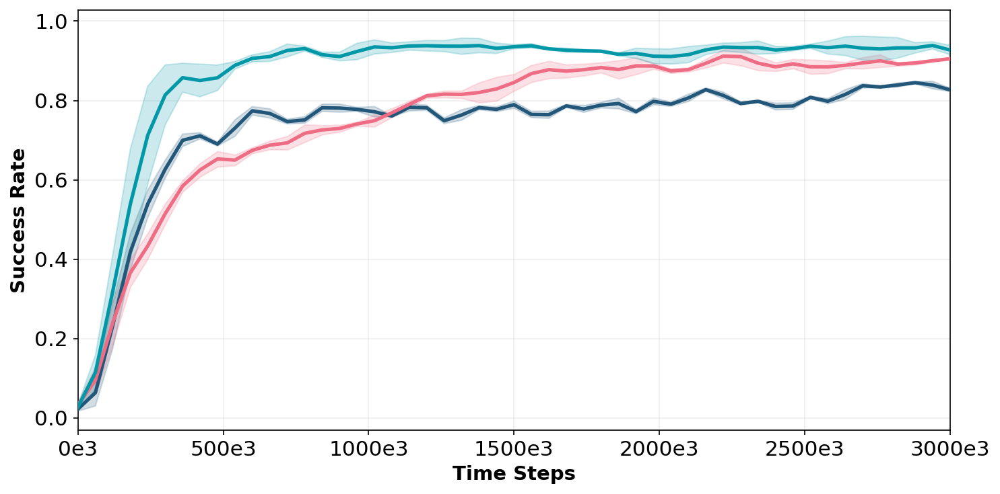

In [41]:
import os
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Устанавливаем цветовую палитру
colors = ['#22577A', '#EE6D84', '#0097A6',] #['#b5179e', '#22577A', '#EE6D84', '#7209b7', '#0097A6',] # '#22577A', '#0097A6', '#EE6D84', 
linewidth = 2.5
fill_alpha = 0.2

def normalize_steps(df, step_interval=1000):
    df['NormalizedStep'] = (df['Step'] // step_interval) * step_interval
    return df

def smooth_data(df, window_size=10):
    df = df.sort_values('Step')
    df['SmoothedValue'] = df['Value'].rolling(window=window_size, min_periods=1).mean()
    return df

def extract_metric_from_events(logdir, metric_name):
    event_files = [os.path.join(logdir, f) for f in os.listdir(logdir) if 'events.out.tfevents' in f]
    all_data = []
    
    for event_file in event_files:
        steps, values = [], []
        for e in tf.compat.v1.train.summary_iterator(event_file):
            for v in e.summary.value:
                if v.tag == metric_name:
                    steps.append(e.step)
                    values.append(v.simple_value)
        df = pd.DataFrame({'Step': steps, 'Value': values})
        all_data.append(df)
    
    return all_data

def format_ticks(x, pos):
    return f"{int(x / 1000)}e3"

def plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000):
    subfolders = [os.path.join(main_logdir, f) for f in os.listdir(main_logdir) if os.path.isdir(os.path.join(main_logdir, f))]
    plt.figure(figsize=(10, 5), dpi=150)
    
    for idx, subfolder in enumerate(subfolders):
        color = colors[idx % len(colors)]
        all_data = extract_metric_from_events(subfolder, metric_name)
        
        smoothed_data = []
        for df in all_data:
            df = normalize_steps(df, step_interval)
            df_smoothed = smooth_data(df, window_size)
            smoothed_data.append(df_smoothed[['NormalizedStep', 'SmoothedValue']])
        
        combined_data = pd.concat(smoothed_data).groupby('NormalizedStep').agg(
            mean_value=('SmoothedValue', 'mean'),
            std_value=('SmoothedValue', 'std')
        ).reset_index()
        
        plt.plot(combined_data['NormalizedStep'], combined_data['mean_value'], label=f'{os.path.basename(subfolder)}', color=color, linewidth=linewidth, zorder=5)
        plt.fill_between(
            combined_data['NormalizedStep'],
            combined_data['mean_value'] - combined_data['std_value'],
            combined_data['mean_value'] + combined_data['std_value'],
            alpha=fill_alpha, color=color, zorder=3
        )
    
    ax = plt.gca()
    ax.xaxis.set_major_formatter(FuncFormatter(format_ticks))
    ax.tick_params(axis='both', labelsize=15)
    ax.grid(True, alpha=0.2)
    
    plt.xlim(0, 3_000_000)
    plt.xlabel('Time Steps', fontweight='bold', fontsize=14)
    plt.ylabel('Success Rate', fontweight='bold', fontsize=14)
    # plt.legend(fontsize=12, loc='best')
    plt.tight_layout()
    
    output_filename = f"{main_logdir}/graph_styled.png"
    plt.savefig(output_filename, format='png', dpi=300, bbox_inches='tight')
    plt.show()

# Путь к папке с подпапками логов
main_logdir = './DONE_Experiment_1_Maniskill/off_TriFingerRotateCubeLevel0'  
metric_name = 'eval/success_once'  

# Рисуем графики с новым стилем
plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=60000)


# pusht off

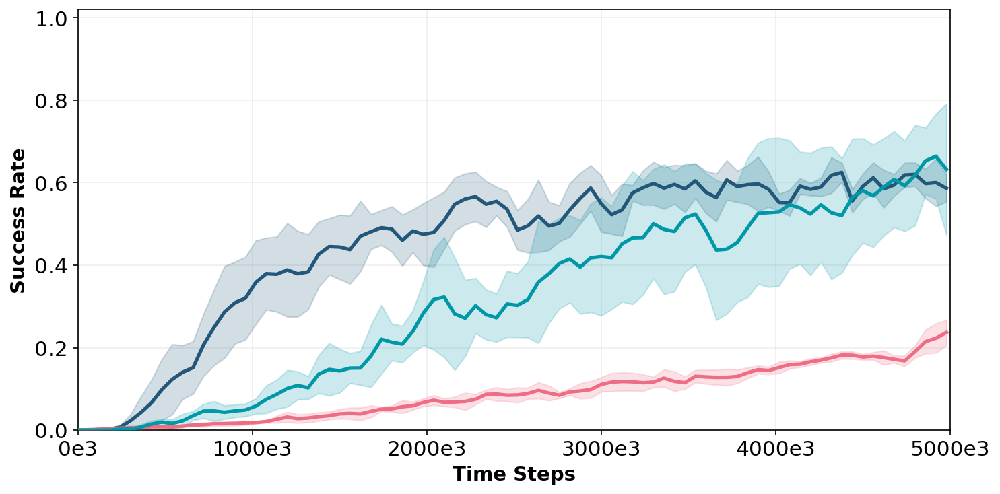

In [48]:
import os
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Устанавливаем цветовую палитру
colors = ['#22577A', '#EE6D84', '#0097A6',] #['#b5179e', '#22577A', '#EE6D84', '#7209b7', '#0097A6',] # '#22577A', '#0097A6', '#EE6D84', 
linewidth = 2.5
fill_alpha = 0.2

def normalize_steps(df, step_interval=1000):
    df['NormalizedStep'] = (df['Step'] // step_interval) * step_interval
    return df

def smooth_data(df, window_size=10):
    df = df.sort_values('Step')
    df['SmoothedValue'] = df['Value'].rolling(window=window_size, min_periods=1).mean()
    return df

def extract_metric_from_events(logdir, metric_name):
    event_files = [os.path.join(logdir, f) for f in os.listdir(logdir) if 'events.out.tfevents' in f]
    all_data = []
    
    for event_file in event_files:
        steps, values = [], []
        for e in tf.compat.v1.train.summary_iterator(event_file):
            for v in e.summary.value:
                if v.tag == metric_name:
                    steps.append(e.step)
                    values.append(v.simple_value)
        df = pd.DataFrame({'Step': steps, 'Value': values})
        all_data.append(df)
    
    return all_data

def format_ticks(x, pos):
    return f"{int(x / 1000)}e3"

def plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000):
    subfolders = [os.path.join(main_logdir, f) for f in os.listdir(main_logdir) if os.path.isdir(os.path.join(main_logdir, f))]
    plt.figure(figsize=(10, 5), dpi=150)
    
    for idx, subfolder in enumerate(subfolders):
        color = colors[idx % len(colors)]
        all_data = extract_metric_from_events(subfolder, metric_name)
        
        smoothed_data = []
        for df in all_data:
            df = normalize_steps(df, step_interval)
            df_smoothed = smooth_data(df, window_size)
            smoothed_data.append(df_smoothed[['NormalizedStep', 'SmoothedValue']])
        
        combined_data = pd.concat(smoothed_data).groupby('NormalizedStep').agg(
            mean_value=('SmoothedValue', 'mean'),
            std_value=('SmoothedValue', 'std')
        ).reset_index()
        
        plt.plot(combined_data['NormalizedStep'], combined_data['mean_value'], label=f'{os.path.basename(subfolder)}', color=color, linewidth=linewidth, zorder=5)
        plt.fill_between(
            combined_data['NormalizedStep'],
            combined_data['mean_value'] - combined_data['std_value'],
            combined_data['mean_value'] + combined_data['std_value'],
            alpha=fill_alpha, color=color, zorder=3
        )
    
    ax = plt.gca()
    ax.xaxis.set_major_formatter(FuncFormatter(format_ticks))
    ax.tick_params(axis='both', labelsize=15)
    ax.grid(True, alpha=0.2)
    
    plt.xlim(0, 5_000_000)
    plt.ylim(0, 1.02)
    plt.xlabel('Time Steps', fontweight='bold', fontsize=14)
    plt.ylabel('Success Rate', fontweight='bold', fontsize=14)
    # plt.legend(fontsize=12, loc='best')
    plt.tight_layout()
    
    output_filename = f"{main_logdir}/graph_styled.png"
    plt.savefig(output_filename, format='png', dpi=300, bbox_inches='tight')
    plt.show()

# Путь к папке с подпапками логов
main_logdir = './DONE_Experiment_1_Maniskill/off_PushT'  
metric_name = 'eval/success_once'  

# Рисуем графики с новым стилем
plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=60000)


# Experiment 2

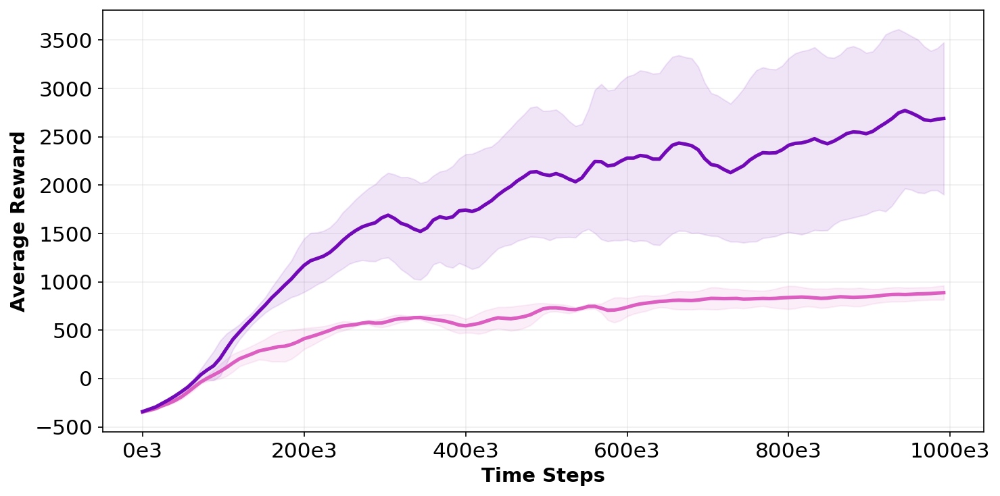

In [18]:
import os
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Устанавливаем цветовую палитру
colors = ['#DB5EC0', '#7209b7'] # '#22577A', '#0097A6', '#EE6D84', 
linewidth = 2.5
fill_alpha = 0.1

def normalize_steps(df, step_interval=1000):
    df['NormalizedStep'] = (df['Step'] // step_interval) * step_interval
    return df

def smooth_data(df, window_size=10):
    df = df.sort_values('Step')
    df['SmoothedValue'] = df['Value'].rolling(window=window_size, min_periods=1).mean()
    return df

def extract_metric_from_events(logdir, metric_name):
    event_files = [os.path.join(logdir, f) for f in os.listdir(logdir) if 'events.out.tfevents' in f]
    all_data = []
    
    for event_file in event_files:
        steps, values = [], []
        for e in tf.compat.v1.train.summary_iterator(event_file):
            for v in e.summary.value:
                if v.tag == metric_name:
                    steps.append(e.step)
                    values.append(v.simple_value)
        df = pd.DataFrame({'Step': steps, 'Value': values})
        all_data.append(df)
    
    return all_data

def format_ticks(x, pos):
    return f"{int(x / 1000)}e3"

def plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000):
    subfolders = [os.path.join(main_logdir, f) for f in os.listdir(main_logdir) if os.path.isdir(os.path.join(main_logdir, f))]
    plt.figure(figsize=(10, 5), dpi=150)
    
    for idx, subfolder in enumerate(subfolders):
        color = colors[idx % len(colors)]
        all_data = extract_metric_from_events(subfolder, metric_name)
        
        smoothed_data = []
        for df in all_data:
            df = normalize_steps(df, step_interval)
            df_smoothed = smooth_data(df, window_size)
            smoothed_data.append(df_smoothed[['NormalizedStep', 'SmoothedValue']])
        
        combined_data = pd.concat(smoothed_data).groupby('NormalizedStep').agg(
            mean_value=('SmoothedValue', 'mean'),
            std_value=('SmoothedValue', 'std')
        ).reset_index()
        
        plt.plot(combined_data['NormalizedStep'], combined_data['mean_value'], label=f'{os.path.basename(subfolder)}', color=color, linewidth=linewidth, zorder=5)
        plt.fill_between(
            combined_data['NormalizedStep'],
            combined_data['mean_value'] - combined_data['std_value'],
            combined_data['mean_value'] + combined_data['std_value'],
            alpha=fill_alpha, color=color, zorder=3
        )
    
    ax = plt.gca()
    ax.xaxis.set_major_formatter(FuncFormatter(format_ticks))
    ax.tick_params(axis='both', labelsize=15)
    ax.grid(True, alpha=0.2)
    
    plt.xlabel('Time Steps', fontweight='bold', fontsize=14)
    plt.ylabel('Average Reward', fontweight='bold', fontsize=14)
    # plt.legend(fontsize=12, loc='best')
    plt.tight_layout()
    
    output_filename = f"{main_logdir}/graph_styled.png"
    plt.savefig(output_filename, format='png', dpi=300, bbox_inches='tight')
    plt.show()

# Путь к папке с подпапками логов
main_logdir = './DONE_Experiment_2_SCALING_ppo_nano_gpt_vs_mlp/HalfCheetah'  
metric_name = 'eval/episodic_return'  

# Рисуем графики с новым стилем
plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000)


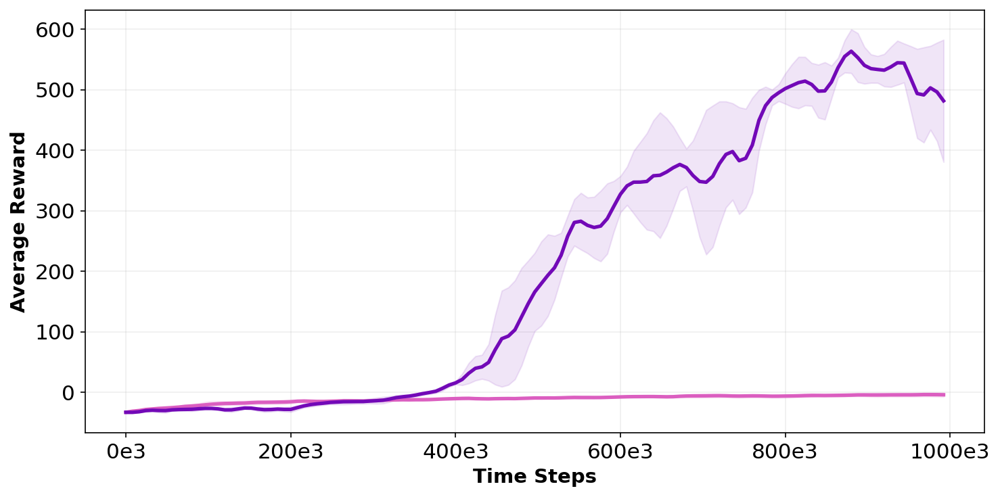

In [19]:
import os
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Устанавливаем цветовую палитру
colors = ['#DB5EC0', '#7209b7'] # '#22577A', '#0097A6', '#EE6D84', 
linewidth = 2.5
fill_alpha = 0.1

def normalize_steps(df, step_interval=1000):
    df['NormalizedStep'] = (df['Step'] // step_interval) * step_interval
    return df

def smooth_data(df, window_size=10):
    df = df.sort_values('Step')
    df['SmoothedValue'] = df['Value'].rolling(window=window_size, min_periods=1).mean()
    return df

def extract_metric_from_events(logdir, metric_name):
    event_files = [os.path.join(logdir, f) for f in os.listdir(logdir) if 'events.out.tfevents' in f]
    all_data = []
    
    for event_file in event_files:
        steps, values = [], []
        for e in tf.compat.v1.train.summary_iterator(event_file):
            for v in e.summary.value:
                if v.tag == metric_name:
                    steps.append(e.step)
                    values.append(v.simple_value)
        df = pd.DataFrame({'Step': steps, 'Value': values})
        all_data.append(df)
    
    return all_data

def format_ticks(x, pos):
    return f"{int(x / 1000)}e3"

def plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000):
    subfolders = [os.path.join(main_logdir, f) for f in os.listdir(main_logdir) if os.path.isdir(os.path.join(main_logdir, f))]
    plt.figure(figsize=(10, 5), dpi=150)
    
    for idx, subfolder in enumerate(subfolders):
        color = colors[idx % len(colors)]
        all_data = extract_metric_from_events(subfolder, metric_name)
        
        smoothed_data = []
        for df in all_data:
            df = normalize_steps(df, step_interval)
            df_smoothed = smooth_data(df, window_size)
            smoothed_data.append(df_smoothed[['NormalizedStep', 'SmoothedValue']])
        
        combined_data = pd.concat(smoothed_data).groupby('NormalizedStep').agg(
            mean_value=('SmoothedValue', 'mean'),
            std_value=('SmoothedValue', 'std')
        ).reset_index()
        
        plt.plot(combined_data['NormalizedStep'], combined_data['mean_value'], label=f'{os.path.basename(subfolder)}', color=color, linewidth=linewidth, zorder=5)
        plt.fill_between(
            combined_data['NormalizedStep'],
            combined_data['mean_value'] - combined_data['std_value'],
            combined_data['mean_value'] + combined_data['std_value'],
            alpha=fill_alpha, color=color, zorder=3
        )
    
    ax = plt.gca()
    ax.xaxis.set_major_formatter(FuncFormatter(format_ticks))
    ax.tick_params(axis='both', labelsize=15)
    ax.grid(True, alpha=0.2)
    
    plt.xlabel('Time Steps', fontweight='bold', fontsize=14)
    plt.ylabel('Average Reward', fontweight='bold', fontsize=14)
    # plt.legend(fontsize=12, loc='best')
    plt.tight_layout()
    
    output_filename = f"{main_logdir}/graph_styled.png"
    plt.savefig(output_filename, format='png', dpi=300, bbox_inches='tight')
    plt.show()

# Путь к папке с подпапками логов
main_logdir = './DONE_Experiment_2_SCALING_ppo_nano_gpt_vs_mlp/Ant'  
metric_name = 'eval/episodic_return'  

# Рисуем графики с новым стилем
plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000)


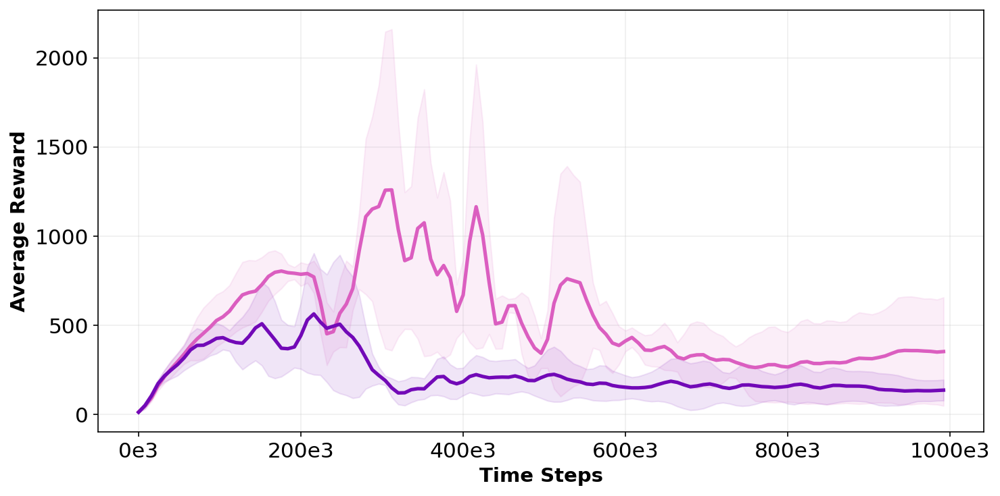

In [20]:
import os
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Устанавливаем цветовую палитру
colors = ['#DB5EC0', '#7209b7'] # '#22577A', '#0097A6', '#EE6D84', 
linewidth = 2.5
fill_alpha = 0.1

def normalize_steps(df, step_interval=1000):
    df['NormalizedStep'] = (df['Step'] // step_interval) * step_interval
    return df

def smooth_data(df, window_size=10):
    df = df.sort_values('Step')
    df['SmoothedValue'] = df['Value'].rolling(window=window_size, min_periods=1).mean()
    return df

def extract_metric_from_events(logdir, metric_name):
    event_files = [os.path.join(logdir, f) for f in os.listdir(logdir) if 'events.out.tfevents' in f]
    all_data = []
    
    for event_file in event_files:
        steps, values = [], []
        for e in tf.compat.v1.train.summary_iterator(event_file):
            for v in e.summary.value:
                if v.tag == metric_name:
                    steps.append(e.step)
                    values.append(v.simple_value)
        df = pd.DataFrame({'Step': steps, 'Value': values})
        all_data.append(df)
    
    return all_data

def format_ticks(x, pos):
    return f"{int(x / 1000)}e3"

def plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000):
    subfolders = [os.path.join(main_logdir, f) for f in os.listdir(main_logdir) if os.path.isdir(os.path.join(main_logdir, f))]
    plt.figure(figsize=(10, 5), dpi=150)
    
    for idx, subfolder in enumerate(subfolders):
        color = colors[idx % len(colors)]
        all_data = extract_metric_from_events(subfolder, metric_name)
        
        smoothed_data = []
        for df in all_data:
            df = normalize_steps(df, step_interval)
            df_smoothed = smooth_data(df, window_size)
            smoothed_data.append(df_smoothed[['NormalizedStep', 'SmoothedValue']])
        
        combined_data = pd.concat(smoothed_data).groupby('NormalizedStep').agg(
            mean_value=('SmoothedValue', 'mean'),
            std_value=('SmoothedValue', 'std')
        ).reset_index()
        
        plt.plot(combined_data['NormalizedStep'], combined_data['mean_value'], label=f'{os.path.basename(subfolder)}', color=color, linewidth=linewidth, zorder=5)
        plt.fill_between(
            combined_data['NormalizedStep'],
            combined_data['mean_value'] - combined_data['std_value'],
            combined_data['mean_value'] + combined_data['std_value'],
            alpha=fill_alpha, color=color, zorder=3
        )
    
    ax = plt.gca()
    ax.xaxis.set_major_formatter(FuncFormatter(format_ticks))
    ax.tick_params(axis='both', labelsize=15)
    ax.grid(True, alpha=0.2)
    
    plt.xlabel('Time Steps', fontweight='bold', fontsize=14)
    plt.ylabel('Average Reward', fontweight='bold', fontsize=14)
    # plt.legend(fontsize=12, loc='best')
    plt.tight_layout()
    
    output_filename = f"{main_logdir}/graph_styled.png"
    plt.savefig(output_filename, format='png', dpi=300, bbox_inches='tight')
    plt.show()

# Путь к папке с подпапками логов
main_logdir = './DONE_Experiment_2_SCALING_ppo_nano_gpt_vs_mlp/Hopper'  
metric_name = 'eval/episodic_return'  

# Рисуем графики с новым стилем
plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000)


# Experiment 3

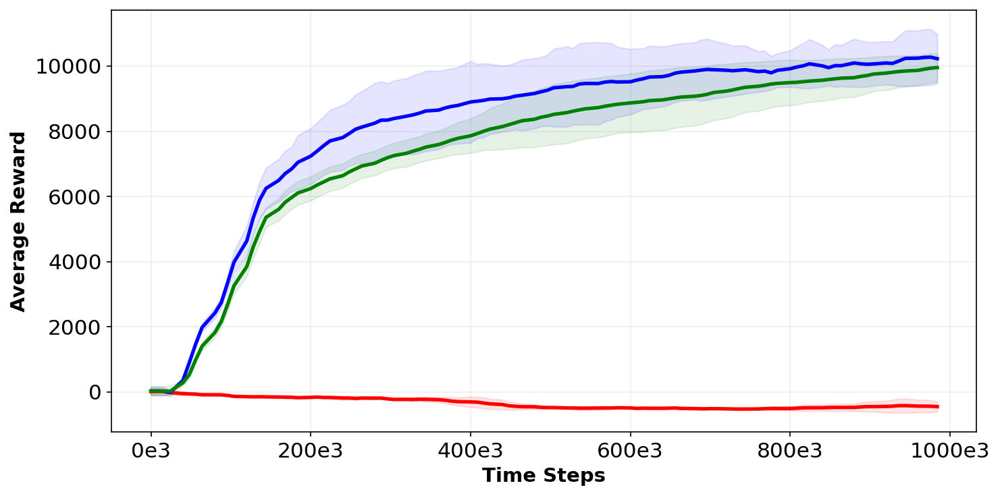

In [29]:
import os
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Устанавливаем цветовую палитру
colors = ['red', 'blue', 'green']
linewidth = 2.5
fill_alpha = 0.1

def normalize_steps(df, step_interval=1000):
    df['NormalizedStep'] = (df['Step'] // step_interval) * step_interval
    return df

def smooth_data(df, window_size=10):
    df = df.sort_values('Step')
    df['SmoothedValue'] = df['Value'].rolling(window=window_size, min_periods=1).mean()
    return df

def extract_metric_from_events(logdir, metric_name):
    event_files = [os.path.join(logdir, f) for f in os.listdir(logdir) if 'events.out.tfevents' in f]
    all_data = []
    
    for event_file in event_files:
        steps, values = [], []
        for e in tf.compat.v1.train.summary_iterator(event_file):
            for v in e.summary.value:
                if v.tag == metric_name:
                    steps.append(e.step)
                    values.append(v.simple_value)
        df = pd.DataFrame({'Step': steps, 'Value': values})
        all_data.append(df)
    
    return all_data

def format_ticks(x, pos):
    return f"{int(x / 1000)}e3"

def plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000):
    subfolders = [os.path.join(main_logdir, f) for f in os.listdir(main_logdir) if os.path.isdir(os.path.join(main_logdir, f))]
    plt.figure(figsize=(10, 5), dpi=150)
    
    for idx, subfolder in enumerate(subfolders):
        color = colors[idx % len(colors)]
        all_data = extract_metric_from_events(subfolder, metric_name)
        
        smoothed_data = []
        for df in all_data:
            df = normalize_steps(df, step_interval)
            df_smoothed = smooth_data(df, window_size)
            smoothed_data.append(df_smoothed[['NormalizedStep', 'SmoothedValue']])
        
        combined_data = pd.concat(smoothed_data).groupby('NormalizedStep').agg(
            mean_value=('SmoothedValue', 'mean'),
            std_value=('SmoothedValue', 'std')
        ).reset_index()
        
        plt.plot(combined_data['NormalizedStep'], combined_data['mean_value'], label=f'{os.path.basename(subfolder)}', color=color, linewidth=linewidth, zorder=5)
        plt.fill_between(
            combined_data['NormalizedStep'],
            combined_data['mean_value'] - combined_data['std_value'],
            combined_data['mean_value'] + combined_data['std_value'],
            alpha=fill_alpha, color=color, zorder=3
        )
    
    ax = plt.gca()
    ax.xaxis.set_major_formatter(FuncFormatter(format_ticks))
    ax.tick_params(axis='both', labelsize=15)
    ax.grid(True, alpha=0.2)
    
    plt.xlabel('Time Steps', fontweight='bold', fontsize=14)
    plt.ylabel('Average Reward', fontweight='bold', fontsize=14)
    # plt.legend(fontsize=12, loc='best')
    plt.tight_layout()
    
    output_filename = f"{main_logdir}/graph_styled.png"
    plt.savefig(output_filename, format='png', dpi=300, bbox_inches='tight')
    plt.show()

# Путь к папке с подпапками логов
main_logdir = './DONE_Experiment_3_SHARED_SEPARATE_ENCODER_TD3_NANO_GPT/HalfCheetah'  # Укажите путь к папке, где находятся подпапки с логами
metric_name = 'eval/episodic_return'  

# Рисуем графики с новым стилем
plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000)


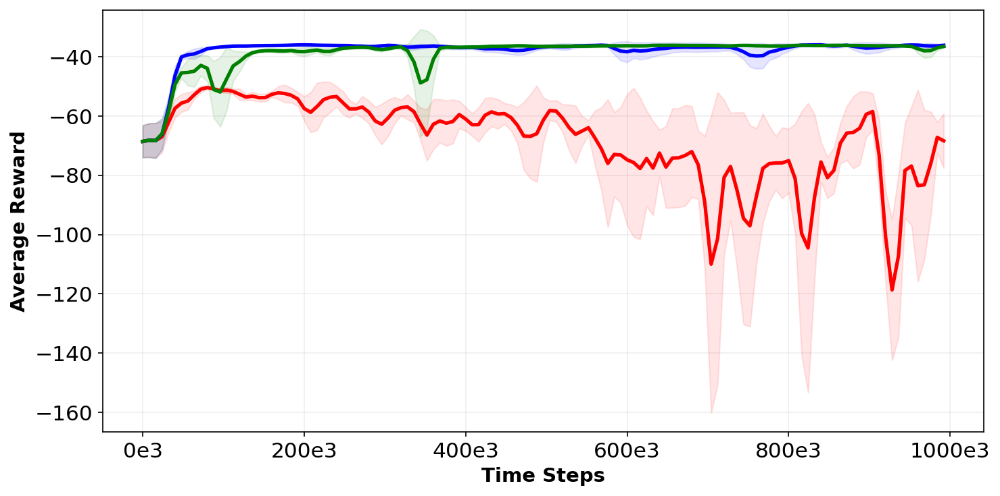

In [30]:
import os
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Устанавливаем цветовую палитру
colors = ['red', 'blue', 'green']
linewidth = 2.5
fill_alpha = 0.1

def normalize_steps(df, step_interval=1000):
    df['NormalizedStep'] = (df['Step'] // step_interval) * step_interval
    return df

def smooth_data(df, window_size=10):
    df = df.sort_values('Step')
    df['SmoothedValue'] = df['Value'].rolling(window=window_size, min_periods=1).mean()
    return df

def extract_metric_from_events(logdir, metric_name):
    event_files = [os.path.join(logdir, f) for f in os.listdir(logdir) if 'events.out.tfevents' in f]
    all_data = []
    
    for event_file in event_files:
        steps, values = [], []
        for e in tf.compat.v1.train.summary_iterator(event_file):
            for v in e.summary.value:
                if v.tag == metric_name:
                    steps.append(e.step)
                    values.append(v.simple_value)
        df = pd.DataFrame({'Step': steps, 'Value': values})
        all_data.append(df)
    
    return all_data

def format_ticks(x, pos):
    return f"{int(x / 1000)}e3"

def plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000):
    subfolders = [os.path.join(main_logdir, f) for f in os.listdir(main_logdir) if os.path.isdir(os.path.join(main_logdir, f))]
    plt.figure(figsize=(10, 5), dpi=150)
    
    for idx, subfolder in enumerate(subfolders):
        color = colors[idx % len(colors)]
        all_data = extract_metric_from_events(subfolder, metric_name)
        
        smoothed_data = []
        for df in all_data:
            df = normalize_steps(df, step_interval)
            df_smoothed = smooth_data(df, window_size)
            smoothed_data.append(df_smoothed[['NormalizedStep', 'SmoothedValue']])
        
        combined_data = pd.concat(smoothed_data).groupby('NormalizedStep').agg(
            mean_value=('SmoothedValue', 'mean'),
            std_value=('SmoothedValue', 'std')
        ).reset_index()
        
        plt.plot(combined_data['NormalizedStep'], combined_data['mean_value'], label=f'{os.path.basename(subfolder)}', color=color, linewidth=linewidth, zorder=5)
        plt.fill_between(
            combined_data['NormalizedStep'],
            combined_data['mean_value'] - combined_data['std_value'],
            combined_data['mean_value'] + combined_data['std_value'],
            alpha=fill_alpha, color=color, zorder=3
        )
    
    ax = plt.gca()
    ax.xaxis.set_major_formatter(FuncFormatter(format_ticks))
    ax.tick_params(axis='both', labelsize=15)
    ax.grid(True, alpha=0.2)
    
    plt.xlabel('Time Steps', fontweight='bold', fontsize=14)
    plt.ylabel('Average Reward', fontweight='bold', fontsize=14)
    # plt.legend(fontsize=12, loc='best')
    plt.tight_layout()
    
    output_filename = f"{main_logdir}/graph_styled.png"
    plt.savefig(output_filename, format='png', dpi=300, bbox_inches='tight')
    plt.show()

# Путь к папке с подпапками логов
main_logdir = './DONE_Experiment_3_SHARED_SEPARATE_ENCODER_TD3_NANO_GPT/Pusher'  # Укажите путь к папке, где находятся подпапки с логами
metric_name = 'eval/episodic_return'  

# Рисуем графики с новым стилем
plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000)


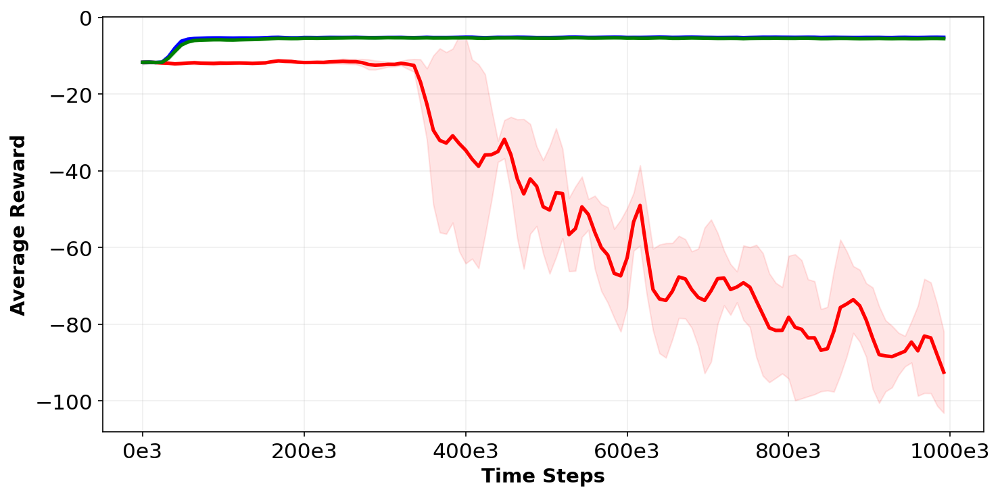

In [31]:
import os
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Устанавливаем цветовую палитру
colors = ['red', 'blue', 'green']
linewidth = 2.5
fill_alpha = 0.1

def normalize_steps(df, step_interval=1000):
    df['NormalizedStep'] = (df['Step'] // step_interval) * step_interval
    return df

def smooth_data(df, window_size=10):
    df = df.sort_values('Step')
    df['SmoothedValue'] = df['Value'].rolling(window=window_size, min_periods=1).mean()
    return df

def extract_metric_from_events(logdir, metric_name):
    event_files = [os.path.join(logdir, f) for f in os.listdir(logdir) if 'events.out.tfevents' in f]
    all_data = []
    
    for event_file in event_files:
        steps, values = [], []
        for e in tf.compat.v1.train.summary_iterator(event_file):
            for v in e.summary.value:
                if v.tag == metric_name:
                    steps.append(e.step)
                    values.append(v.simple_value)
        df = pd.DataFrame({'Step': steps, 'Value': values})
        all_data.append(df)
    
    return all_data

def format_ticks(x, pos):
    return f"{int(x / 1000)}e3"

def plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000):
    subfolders = [os.path.join(main_logdir, f) for f in os.listdir(main_logdir) if os.path.isdir(os.path.join(main_logdir, f))]
    plt.figure(figsize=(10, 5), dpi=150)
    
    for idx, subfolder in enumerate(subfolders):
        color = colors[idx % len(colors)]
        all_data = extract_metric_from_events(subfolder, metric_name)
        
        smoothed_data = []
        for df in all_data:
            df = normalize_steps(df, step_interval)
            df_smoothed = smooth_data(df, window_size)
            smoothed_data.append(df_smoothed[['NormalizedStep', 'SmoothedValue']])
        
        combined_data = pd.concat(smoothed_data).groupby('NormalizedStep').agg(
            mean_value=('SmoothedValue', 'mean'),
            std_value=('SmoothedValue', 'std')
        ).reset_index()
        
        plt.plot(combined_data['NormalizedStep'], combined_data['mean_value'], label=f'{os.path.basename(subfolder)}', color=color, linewidth=linewidth, zorder=5)
        plt.fill_between(
            combined_data['NormalizedStep'],
            combined_data['mean_value'] - combined_data['std_value'],
            combined_data['mean_value'] + combined_data['std_value'],
            alpha=fill_alpha, color=color, zorder=3
        )
    
    ax = plt.gca()
    ax.xaxis.set_major_formatter(FuncFormatter(format_ticks))
    ax.tick_params(axis='both', labelsize=15)
    ax.grid(True, alpha=0.2)
    
    plt.xlabel('Time Steps', fontweight='bold', fontsize=14)
    plt.ylabel('Average Reward', fontweight='bold', fontsize=14)
    # plt.legend(fontsize=12, loc='best')
    plt.tight_layout()
    
    output_filename = f"{main_logdir}/graph_styled.png"
    plt.savefig(output_filename, format='png', dpi=300, bbox_inches='tight')
    plt.show()

# Путь к папке с подпапками логов
main_logdir = './DONE_Experiment_3_SHARED_SEPARATE_ENCODER_TD3_NANO_GPT/Reacher'  # Укажите путь к папке, где находятся подпапки с логами
metric_name = 'eval/episodic_return'  

# Рисуем графики с новым стилем
plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000)


# Experiment 3.2

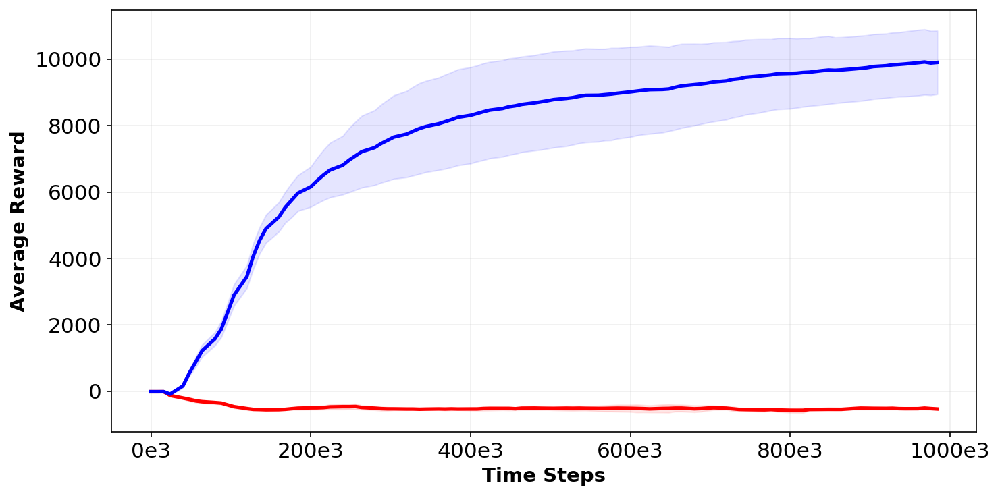

In [32]:
import os
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Устанавливаем цветовую палитру
colors = ['red', 'blue', 'green']
linewidth = 2.5
fill_alpha = 0.1

def normalize_steps(df, step_interval=1000):
    df['NormalizedStep'] = (df['Step'] // step_interval) * step_interval
    return df

def smooth_data(df, window_size=10):
    df = df.sort_values('Step')
    df['SmoothedValue'] = df['Value'].rolling(window=window_size, min_periods=1).mean()
    return df

def extract_metric_from_events(logdir, metric_name):
    event_files = [os.path.join(logdir, f) for f in os.listdir(logdir) if 'events.out.tfevents' in f]
    all_data = []
    
    for event_file in event_files:
        steps, values = [], []
        for e in tf.compat.v1.train.summary_iterator(event_file):
            for v in e.summary.value:
                if v.tag == metric_name:
                    steps.append(e.step)
                    values.append(v.simple_value)
        df = pd.DataFrame({'Step': steps, 'Value': values})
        all_data.append(df)
    
    return all_data

def format_ticks(x, pos):
    return f"{int(x / 1000)}e3"

def plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000):
    subfolders = [os.path.join(main_logdir, f) for f in os.listdir(main_logdir) if os.path.isdir(os.path.join(main_logdir, f))]
    plt.figure(figsize=(10, 5), dpi=150)
    
    for idx, subfolder in enumerate(subfolders):
        color = colors[idx % len(colors)]
        all_data = extract_metric_from_events(subfolder, metric_name)
        
        smoothed_data = []
        for df in all_data:
            df = normalize_steps(df, step_interval)
            df_smoothed = smooth_data(df, window_size)
            smoothed_data.append(df_smoothed[['NormalizedStep', 'SmoothedValue']])
        
        combined_data = pd.concat(smoothed_data).groupby('NormalizedStep').agg(
            mean_value=('SmoothedValue', 'mean'),
            std_value=('SmoothedValue', 'std')
        ).reset_index()
        
        plt.plot(combined_data['NormalizedStep'], combined_data['mean_value'], label=f'{os.path.basename(subfolder)}', color=color, linewidth=linewidth, zorder=5)
        plt.fill_between(
            combined_data['NormalizedStep'],
            combined_data['mean_value'] - combined_data['std_value'],
            combined_data['mean_value'] + combined_data['std_value'],
            alpha=fill_alpha, color=color, zorder=3
        )
    
    ax = plt.gca()
    ax.xaxis.set_major_formatter(FuncFormatter(format_ticks))
    ax.tick_params(axis='both', labelsize=15)
    ax.grid(True, alpha=0.2)
    
    plt.xlabel('Time Steps', fontweight='bold', fontsize=14)
    plt.ylabel('Average Reward', fontweight='bold', fontsize=14)
    # plt.legend(fontsize=12, loc='best')
    plt.tight_layout()
    
    output_filename = f"{main_logdir}/graph_styled.png"
    plt.savefig(output_filename, format='png', dpi=300, bbox_inches='tight')
    plt.show()

# Путь к папке с подпапками логов
main_logdir = './DONE_Experiment_3.1_SHARED_SEPARATE_ENCODER_TD3_MLP/HalfCheetah'  # Укажите путь к папке, где находятся подпапки с логами
metric_name = 'eval/episodic_return'  

# Рисуем графики с новым стилем
plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000)


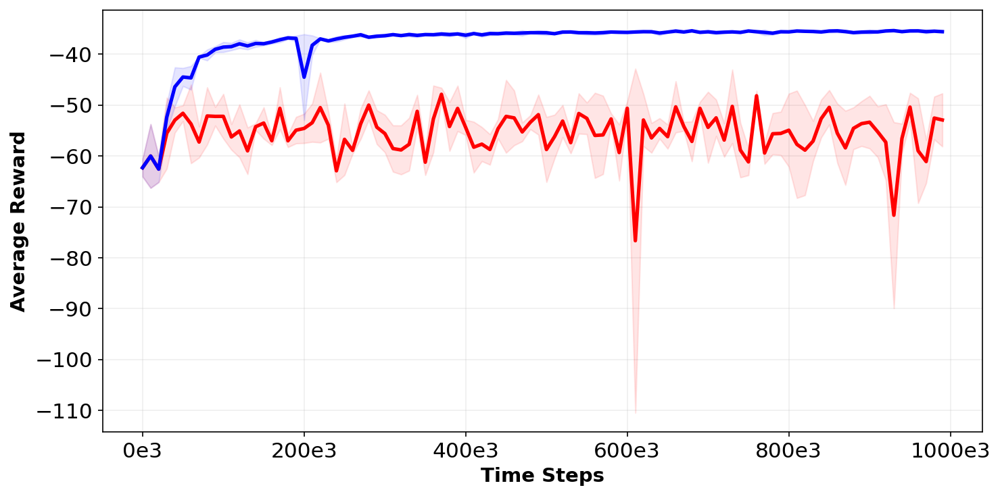

In [55]:
import os
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Устанавливаем цветовую палитру
colors = ['red', 'blue', 'green']
linewidth = 2.5
fill_alpha = 0.1

def normalize_steps(df, step_interval=1000):
    df['NormalizedStep'] = (df['Step'] // step_interval) * step_interval
    return df

def smooth_data(df, window_size=10):
    df = df.sort_values('Step')
    df['SmoothedValue'] = df['Value'].rolling(window=window_size, min_periods=1).mean()
    return df

def extract_metric_from_events(logdir, metric_name):
    event_files = [os.path.join(logdir, f) for f in os.listdir(logdir) if 'events.out.tfevents' in f]
    all_data = []
    
    for event_file in event_files:
        steps, values = [], []
        for e in tf.compat.v1.train.summary_iterator(event_file):
            for v in e.summary.value:
                if v.tag == metric_name:
                    steps.append(e.step)
                    values.append(v.simple_value)
        df = pd.DataFrame({'Step': steps, 'Value': values})
        all_data.append(df)
    
    return all_data

def format_ticks(x, pos):
    return f"{int(x / 1000)}e3"

def plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000):
    subfolders = [os.path.join(main_logdir, f) for f in os.listdir(main_logdir) if os.path.isdir(os.path.join(main_logdir, f))]
    plt.figure(figsize=(10, 5), dpi=150)
    
    for idx, subfolder in enumerate(subfolders):
        color = colors[idx % len(colors)]
        all_data = extract_metric_from_events(subfolder, metric_name)
        
        smoothed_data = []
        for df in all_data:
            df = normalize_steps(df, step_interval)
            df_smoothed = smooth_data(df, window_size)
            smoothed_data.append(df_smoothed[['NormalizedStep', 'SmoothedValue']])
        
        combined_data = pd.concat(smoothed_data).groupby('NormalizedStep').agg(
            mean_value=('SmoothedValue', 'mean'),
            std_value=('SmoothedValue', 'std')
        ).reset_index()
        
        plt.plot(combined_data['NormalizedStep'], combined_data['mean_value'], label=f'{os.path.basename(subfolder)}', color=color, linewidth=linewidth, zorder=5)
        plt.fill_between(
            combined_data['NormalizedStep'],
            combined_data['mean_value'] - combined_data['std_value'],
            combined_data['mean_value'] + combined_data['std_value'],
            alpha=fill_alpha, color=color, zorder=3
        )
    
    ax = plt.gca()
    ax.xaxis.set_major_formatter(FuncFormatter(format_ticks))
    ax.tick_params(axis='both', labelsize=15)
    ax.grid(True, alpha=0.2)
    
    plt.xlabel('Time Steps', fontweight='bold', fontsize=14)
    plt.ylabel('Average Reward', fontweight='bold', fontsize=14)
    # plt.legend(fontsize=12, loc='best')
    plt.tight_layout()
    
    output_filename = f"{main_logdir}/graph_styled.png"
    plt.savefig(output_filename, format='png', dpi=300, bbox_inches='tight')
    plt.show()

# Путь к папке с подпапками логов
main_logdir = './DONE_Experiment_3.1_SHARED_SEPARATE_ENCODER_TD3_MLP/Pusher'  # Укажите путь к папке, где находятся подпапки с логами
metric_name = 'eval/episodic_return'  

# Рисуем графики с новым стилем
plot_metrics_from_subfolders(main_logdir, metric_name, window_size=1, step_interval=1)


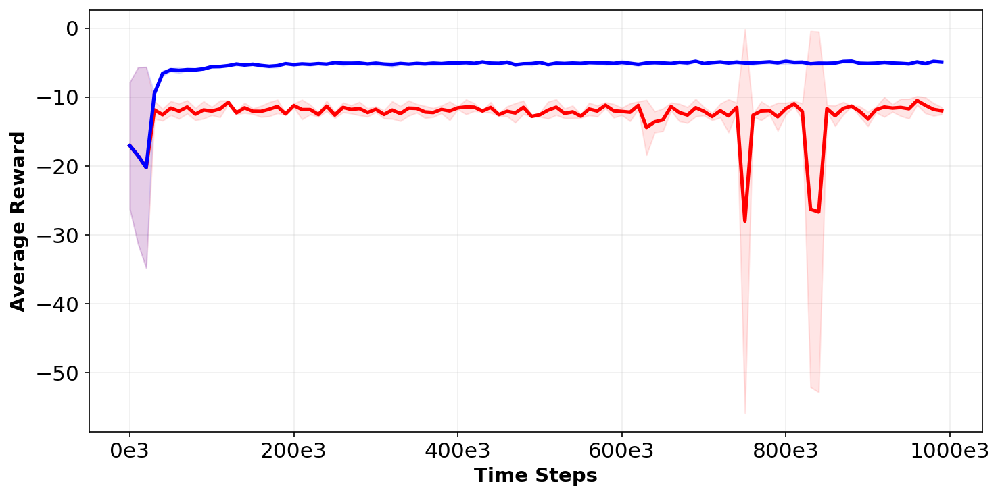

In [53]:
import os
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Устанавливаем цветовую палитру
colors = ['red', 'blue', 'green']
linewidth = 2.5
fill_alpha = 0.1

def normalize_steps(df, step_interval=1000):
    df['NormalizedStep'] = (df['Step'] // step_interval) * step_interval
    return df

def smooth_data(df, window_size=10):
    df = df.sort_values('Step')
    df['SmoothedValue'] = df['Value'].rolling(window=window_size, min_periods=1).mean()
    return df

def extract_metric_from_events(logdir, metric_name):
    event_files = [os.path.join(logdir, f) for f in os.listdir(logdir) if 'events.out.tfevents' in f]
    all_data = []
    
    for event_file in event_files:
        steps, values = [], []
        for e in tf.compat.v1.train.summary_iterator(event_file):
            for v in e.summary.value:
                if v.tag == metric_name:
                    steps.append(e.step)
                    values.append(v.simple_value)
        df = pd.DataFrame({'Step': steps, 'Value': values})
        all_data.append(df)
    
    return all_data

def format_ticks(x, pos):
    return f"{int(x / 1000)}e3"

def plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000):
    subfolders = [os.path.join(main_logdir, f) for f in os.listdir(main_logdir) if os.path.isdir(os.path.join(main_logdir, f))]
    plt.figure(figsize=(10, 5), dpi=150)
    
    for idx, subfolder in enumerate(subfolders):
        color = colors[idx % len(colors)]
        all_data = extract_metric_from_events(subfolder, metric_name)
        
        smoothed_data = []
        for df in all_data:
            df = normalize_steps(df, step_interval)
            df_smoothed = smooth_data(df, window_size)
            smoothed_data.append(df_smoothed[['NormalizedStep', 'SmoothedValue']])
        
        combined_data = pd.concat(smoothed_data).groupby('NormalizedStep').agg(
            mean_value=('SmoothedValue', 'mean'),
            std_value=('SmoothedValue', 'std')
        ).reset_index()
        
        plt.plot(combined_data['NormalizedStep'], combined_data['mean_value'], label=f'{os.path.basename(subfolder)}', color=color, linewidth=linewidth, zorder=5)
        plt.fill_between(
            combined_data['NormalizedStep'],
            combined_data['mean_value'] - combined_data['std_value'],
            combined_data['mean_value'] + combined_data['std_value'],
            alpha=fill_alpha, color=color, zorder=3
        )
    
    ax = plt.gca()
    ax.xaxis.set_major_formatter(FuncFormatter(format_ticks))
    ax.tick_params(axis='both', labelsize=15)
    ax.grid(True, alpha=0.2)
    
    plt.xlabel('Time Steps', fontweight='bold', fontsize=14)
    plt.ylabel('Average Reward', fontweight='bold', fontsize=14)
    # plt.legend(fontsize=12, loc='best')
    plt.tight_layout()
    
    output_filename = f"{main_logdir}/graph_styled.png"
    plt.savefig(output_filename, format='png', dpi=300, bbox_inches='tight')
    plt.show()

# Путь к папке с подпапками логов
main_logdir = './DONE_Experiment_3.1_SHARED_SEPARATE_ENCODER_TD3_MLP/Reacher'  # Укажите путь к папке, где находятся подпапки с логами
metric_name = 'eval/episodic_return'  

# Рисуем графики с новым стилем
plot_metrics_from_subfolders(main_logdir, metric_name, window_size=1, step_interval=1)


# Experiment 5

method_1 [     NormalizedStep  SmoothedValue
0                 0     161.805145
1                 0     155.389336
2                 0     151.748795
3                 0     155.749615
4                 0     159.572385
..              ...            ...
381          760000    5999.665234
382          760000    6011.215918
383          760000    5836.121289
384          760000    5907.290527
385          770000    5957.162988

[386 rows x 2 columns],      NormalizedStep  SmoothedValue
0                 0     142.008514
1                 0     144.494392
2                 0     146.180222
3                 0     145.386108
4                 0     146.587335
..              ...            ...
495          990000     427.844647
496          990000     446.336420
497          990000     458.820349
498          990000     444.870673
499          990000     417.286865

[500 rows x 2 columns],     NormalizedStep  SmoothedValue
0                0     142.008179
1            10000     144.49420

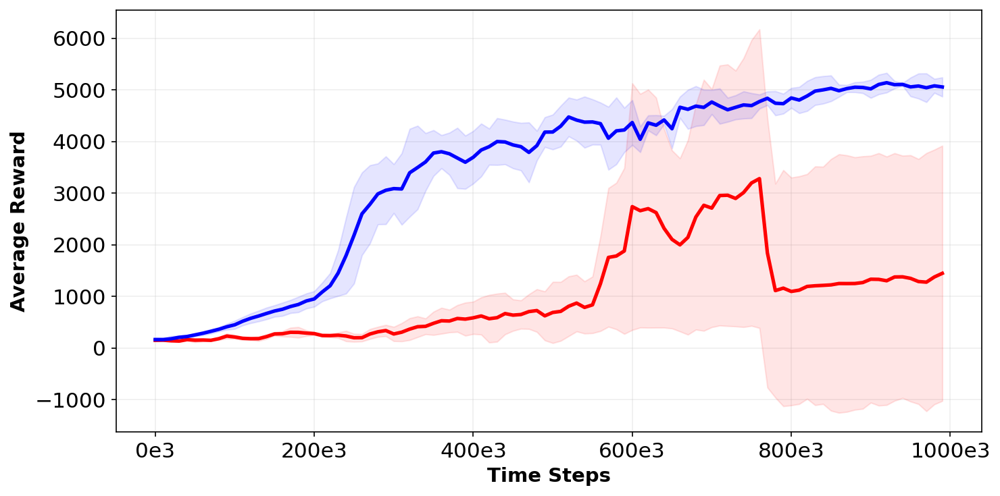

In [ ]:
import os
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Устанавливаем цветовую палитру
colors = ['red', 'blue', 'green']
linewidth = 2.5
fill_alpha = 0.1

def normalize_steps(df, step_interval=1000):
    df['NormalizedStep'] = (df['Step'] // step_interval) * step_interval
    return df

def smooth_data(df, window_size=10):
    df = df.sort_values('Step')
    df['SmoothedValue'] = df['Value'].rolling(window=window_size, min_periods=1).mean()
    return df

def extract_metric_from_events(logdir, metric_name):
    event_files = [os.path.join(logdir, f) for f in os.listdir(logdir) if 'events.out.tfevents' in f]
    all_data = []
    
    for event_file in event_files:
        steps, values = [], []
        for e in tf.compat.v1.train.summary_iterator(event_file):
            for v in e.summary.value:
                if v.tag == metric_name:
                    steps.append(e.step)
                    values.append(v.simple_value)
        df = pd.DataFrame({'Step': steps, 'Value': values})
        all_data.append(df)
    
    return all_data

def format_ticks(x, pos):
    return f"{int(x / 1000)}e3"

def plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000):
    subfolders = [os.path.join(main_logdir, f) for f in os.listdir(main_logdir) if os.path.isdir(os.path.join(main_logdir, f))]
    plt.figure(figsize=(10, 5), dpi=150)
    
    for idx, subfolder in enumerate(subfolders):
        color = colors[idx % len(colors)]
        all_data = extract_metric_from_events(subfolder, metric_name)
        
        smoothed_data = []
        for df in all_data:
            df = normalize_steps(df, step_interval)
            df_smoothed = smooth_data(df, window_size)
            smoothed_data.append(df_smoothed[['NormalizedStep', 'SmoothedValue']])
        
        combined_data = pd.concat(smoothed_data).groupby('NormalizedStep').agg(
            mean_value=('SmoothedValue', 'mean'),
            std_value=('SmoothedValue', 'std')
        ).reset_index()
        print(f'{os.path.basename(subfolder)}', smoothed_data)
        
        plt.plot(combined_data['NormalizedStep'], combined_data['mean_value'], label=f'{os.path.basename(subfolder)}', color=color, linewidth=linewidth, zorder=5)
        plt.fill_between(
            combined_data['NormalizedStep'],
            combined_data['mean_value'] - combined_data['std_value'],
            combined_data['mean_value'] + combined_data['std_value'],
            alpha=fill_alpha, color=color, zorder=3
        )
    
    ax = plt.gca()
    ax.xaxis.set_major_formatter(FuncFormatter(format_ticks))
    ax.tick_params(axis='both', labelsize=15)
    ax.grid(True, alpha=0.2)
    
    plt.xlabel('Time Steps', fontweight='bold', fontsize=14)
    plt.ylabel('Average Reward', fontweight='bold', fontsize=14)
    # plt.legend(fontsize=12, loc='best')
    plt.tight_layout()
    
    output_filename = f"{main_logdir}/graph_styled.png"
    plt.savefig(output_filename, format='png', dpi=300, bbox_inches='tight')
    plt.show()

# Путь к папке с подпапками логов
main_logdir = './RUNNING_Experiment_5_CORRECT_BATCH_MAKING_td3_nano_gpt/Humanoid'  # Укажите путь к папке, где находятся подпапки с логами
metric_name = 'eval/episodic_return'  

# Рисуем графики с новым стилем
plot_metrics_from_subfolders(main_logdir, metric_name, window_size=5, step_interval=10000)



method_1 [     NormalizedStep  SmoothedValue
0                 0      16.085957
1                 0      17.050922
2                 0      24.647879
3                 0      22.026311
4                 0      21.048036
..              ...            ...
495          990000     773.437952
496          990000     786.631409
497          990000     776.569055
498          990000     760.790186
499          990000     766.035156

[500 rows x 2 columns],     NormalizedStep  SmoothedValue
0                0      16.085957
1            10000      17.050922
2            20000      24.647879
3            30000      81.379891
4            40000      64.505928
..             ...            ...
95          950000     696.472588
96          960000      77.760966
97          970000      89.819545
98          980000     100.591772
99          990000      84.175614

[100 rows x 2 columns],      NormalizedStep  SmoothedValue
0                 0       8.454109
1                 0       8.087134
2      

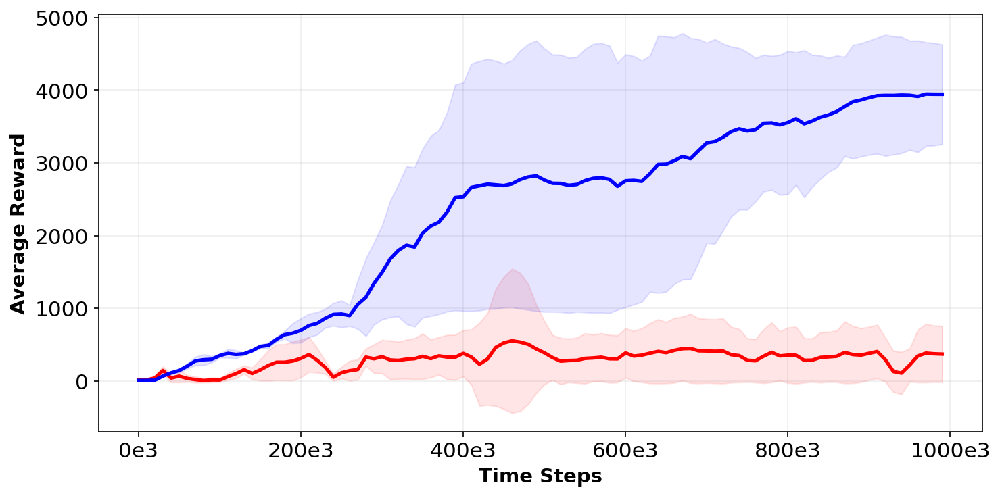

In [69]:
import os
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Устанавливаем цветовую палитру
colors = ['red', 'blue', 'green']
linewidth = 2.5
fill_alpha = 0.1

def normalize_steps(df, step_interval=1000):
    df['NormalizedStep'] = (df['Step'] // step_interval) * step_interval
    return df

def smooth_data(df, window_size=10):
    df = df.sort_values('Step')
    df['SmoothedValue'] = df['Value'].rolling(window=window_size, min_periods=1).mean()
    return df

def extract_metric_from_events(logdir, metric_name):
    event_files = [os.path.join(logdir, f) for f in os.listdir(logdir) if 'events.out.tfevents' in f]
    all_data = []
    
    for event_file in event_files:
        steps, values = [], []
        for e in tf.compat.v1.train.summary_iterator(event_file):
            for v in e.summary.value:
                if v.tag == metric_name:
                    steps.append(e.step)
                    values.append(v.simple_value)
        df = pd.DataFrame({'Step': steps, 'Value': values})
        all_data.append(df)
    
    return all_data

def format_ticks(x, pos):
    return f"{int(x / 1000)}e3"

def plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000):
    subfolders = [os.path.join(main_logdir, f) for f in os.listdir(main_logdir) if os.path.isdir(os.path.join(main_logdir, f))]
    plt.figure(figsize=(10, 5), dpi=150)
    
    for idx, subfolder in enumerate(subfolders):
        color = colors[idx % len(colors)]
        all_data = extract_metric_from_events(subfolder, metric_name)
        
        smoothed_data = []
        for df in all_data:
            df = normalize_steps(df, step_interval)
            df_smoothed = smooth_data(df, window_size)
            smoothed_data.append(df_smoothed[['NormalizedStep', 'SmoothedValue']])
        
        combined_data = pd.concat(smoothed_data).groupby('NormalizedStep').agg(
            mean_value=('SmoothedValue', 'mean'),
            std_value=('SmoothedValue', 'std')
        ).reset_index()
        print(f'{os.path.basename(subfolder)}', smoothed_data)

        plt.plot(combined_data['NormalizedStep'], combined_data['mean_value'], label=f'{os.path.basename(subfolder)}', color=color, linewidth=linewidth, zorder=5)
        plt.fill_between(
            combined_data['NormalizedStep'],
            combined_data['mean_value'] - combined_data['std_value'],
            combined_data['mean_value'] + combined_data['std_value'],
            alpha=fill_alpha, color=color, zorder=3
        )
    
    ax = plt.gca()
    ax.xaxis.set_major_formatter(FuncFormatter(format_ticks))
    ax.tick_params(axis='both', labelsize=15)
    ax.grid(True, alpha=0.2)
    
    plt.xlabel('Time Steps', fontweight='bold', fontsize=14)
    plt.ylabel('Average Reward', fontweight='bold', fontsize=14)
    # plt.legend(fontsize=12, loc='best')
    plt.tight_layout()
    
    output_filename = f"{main_logdir}/graph_styled.png"
    plt.savefig(output_filename, format='png', dpi=300, bbox_inches='tight')
    plt.show()

# Путь к папке с подпапками логов
main_logdir = './RUNNING_Experiment_5_CORRECT_BATCH_MAKING_td3_nano_gpt/Walker'  # Укажите путь к папке, где находятся подпапки с логами
metric_name = 'eval/episodic_return'  

# Рисуем графики с новым стилем
plot_metrics_from_subfolders(main_logdir, metric_name, window_size=5, step_interval=10000)



method_1 [    NormalizedStep  SmoothedValue
0                0       7.378596
1                0       7.230378
2                0       7.195512
3                0       7.366623
4                0       7.438760
5            10000       7.490890
6            10000       7.691109
7            10000       7.896950
8            10000       7.860903
9            10000       7.835402
10           20000       7.798517
11           20000       7.735022
12           20000       7.705713
13           20000      14.015955,     NormalizedStep  SmoothedValue
0                0       8.180701
1            10000       8.531550
2            20000       9.593862
3            30000      17.115772
4            40000      21.559523
..             ...            ...
95          950000      37.263113
96          960000      22.465228
97          970000      23.586038
98          980000      24.680711
99          990000      58.213998

[100 rows x 2 columns],      NormalizedStep  SmoothedValue
0          

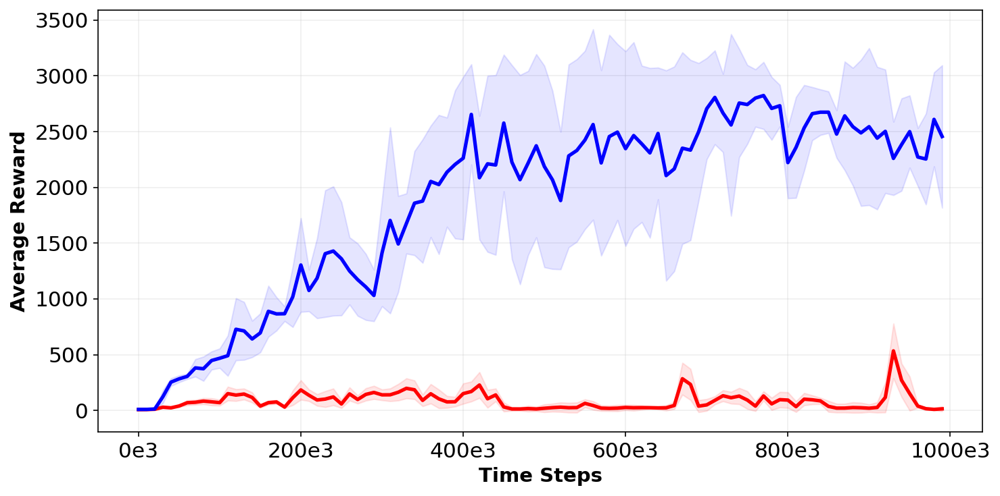

In [70]:
import os
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Устанавливаем цветовую палитру
colors = ['red', 'blue', 'green']
linewidth = 2.5
fill_alpha = 0.1

def normalize_steps(df, step_interval=1000):
    df['NormalizedStep'] = (df['Step'] // step_interval) * step_interval
    return df

def smooth_data(df, window_size=10):
    df = df.sort_values('Step')
    df['SmoothedValue'] = df['Value'].rolling(window=window_size, min_periods=1).mean()
    return df

def extract_metric_from_events(logdir, metric_name):
    event_files = [os.path.join(logdir, f) for f in os.listdir(logdir) if 'events.out.tfevents' in f]
    all_data = []
    
    for event_file in event_files:
        steps, values = [], []
        for e in tf.compat.v1.train.summary_iterator(event_file):
            for v in e.summary.value:
                if v.tag == metric_name:
                    steps.append(e.step)
                    values.append(v.simple_value)
        df = pd.DataFrame({'Step': steps, 'Value': values})
        all_data.append(df)
    
    return all_data

def format_ticks(x, pos):
    return f"{int(x / 1000)}e3"

def plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000):
    subfolders = [os.path.join(main_logdir, f) for f in os.listdir(main_logdir) if os.path.isdir(os.path.join(main_logdir, f))]
    plt.figure(figsize=(10, 5), dpi=150)
    
    for idx, subfolder in enumerate(subfolders):
        color = colors[idx % len(colors)]
        all_data = extract_metric_from_events(subfolder, metric_name)
        
        smoothed_data = []
        for df in all_data:
            df = normalize_steps(df, step_interval)
            df_smoothed = smooth_data(df, window_size)
            smoothed_data.append(df_smoothed[['NormalizedStep', 'SmoothedValue']])
        
        combined_data = pd.concat(smoothed_data).groupby('NormalizedStep').agg(
            mean_value=('SmoothedValue', 'mean'),
            std_value=('SmoothedValue', 'std')
        ).reset_index()
        
        print(f'{os.path.basename(subfolder)}', smoothed_data)

        plt.plot(combined_data['NormalizedStep'], combined_data['mean_value'], label=f'{os.path.basename(subfolder)}', color=color, linewidth=linewidth, zorder=5)
        plt.fill_between(
            combined_data['NormalizedStep'],
            combined_data['mean_value'] - combined_data['std_value'],
            combined_data['mean_value'] + combined_data['std_value'],
            alpha=fill_alpha, color=color, zorder=3
        )
    
    ax = plt.gca()
    ax.xaxis.set_major_formatter(FuncFormatter(format_ticks))
    ax.tick_params(axis='both', labelsize=15)
    ax.grid(True, alpha=0.2)
    
    plt.xlabel('Time Steps', fontweight='bold', fontsize=14)
    plt.ylabel('Average Reward', fontweight='bold', fontsize=14)
    # plt.legend(fontsize=12, loc='best')
    plt.tight_layout()
    
    output_filename = f"{main_logdir}/graph_styled.png"
    plt.savefig(output_filename, format='png', dpi=300, bbox_inches='tight')
    plt.show()

# Путь к папке с подпапками логов
main_logdir = './RUNNING_Experiment_5_CORRECT_BATCH_MAKING_td3_nano_gpt/Hopper'  # Укажите путь к папке, где находятся подпапки с логами
metric_name = 'eval/episodic_return'  

# Рисуем графики с новым стилем
plot_metrics_from_subfolders(main_logdir, metric_name, window_size=5, step_interval=10000)



## no terminations

method_1 [    NormalizedStep  SmoothedValue
0                0     123.240929
1            10000     124.553436
2            20000     119.175761
3            30000     139.289478
4            40000     338.284415
..             ...            ...
95          950000    9600.640234
96          960000    9595.773242
97          970000    9647.940430
98          980000    9687.398438
99          990000    9710.505273

[100 rows x 2 columns],     NormalizedStep  SmoothedValue
0                0     -65.590385
1            10000     -66.887554
2            20000     -69.425021
3            30000    -100.836123
4            40000     219.434422
..             ...            ...
95          950000   10245.119922
96          960000   10251.123047
97          970000   10266.467773
98          980000   10288.860937
99          990000   10284.481250

[100 rows x 2 columns]]
method_2 [    NormalizedStep  SmoothedValue
0                0     -77.883400
1            10000     -79.273357
2           

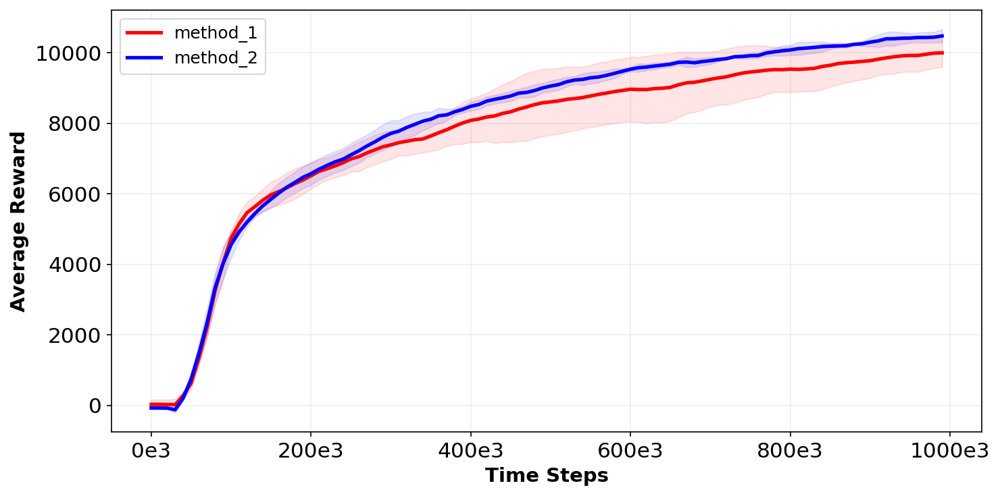

In [75]:
import os
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Устанавливаем цветовую палитру
colors = ['red', 'blue', 'green']
linewidth = 2.5
fill_alpha = 0.1

def normalize_steps(df, step_interval=1000):
    df['NormalizedStep'] = (df['Step'] // step_interval) * step_interval
    return df

def smooth_data(df, window_size=10):
    df = df.sort_values('Step')
    df['SmoothedValue'] = df['Value'].rolling(window=window_size, min_periods=1).mean()
    return df

def extract_metric_from_events(logdir, metric_name):
    event_files = [os.path.join(logdir, f) for f in os.listdir(logdir) if 'events.out.tfevents' in f]
    all_data = []
    
    for event_file in event_files:
        steps, values = [], []
        for e in tf.compat.v1.train.summary_iterator(event_file):
            for v in e.summary.value:
                if v.tag == metric_name:
                    steps.append(e.step)
                    values.append(v.simple_value)
        df = pd.DataFrame({'Step': steps, 'Value': values})
        all_data.append(df)
    
    return all_data

def format_ticks(x, pos):
    return f"{int(x / 1000)}e3"

def plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000):
    subfolders = [os.path.join(main_logdir, f) for f in os.listdir(main_logdir) if os.path.isdir(os.path.join(main_logdir, f))]
    plt.figure(figsize=(10, 5), dpi=150)
    
    for idx, subfolder in enumerate(subfolders):
        color = colors[idx % len(colors)]
        all_data = extract_metric_from_events(subfolder, metric_name)
        
        smoothed_data = []
        for df in all_data:
            df = normalize_steps(df, step_interval)
            df_smoothed = smooth_data(df, window_size)
            smoothed_data.append(df_smoothed[['NormalizedStep', 'SmoothedValue']])
        
        combined_data = pd.concat(smoothed_data).groupby('NormalizedStep').agg(
            mean_value=('SmoothedValue', 'mean'),
            std_value=('SmoothedValue', 'std')
        ).reset_index()
        print(f'{os.path.basename(subfolder)}', smoothed_data)
        
        plt.plot(combined_data['NormalizedStep'], combined_data['mean_value'], label=f'{os.path.basename(subfolder)}', color=color, linewidth=linewidth, zorder=5)
        plt.fill_between(
            combined_data['NormalizedStep'],
            combined_data['mean_value'] - combined_data['std_value'],
            combined_data['mean_value'] + combined_data['std_value'],
            alpha=fill_alpha, color=color, zorder=3
        )
    
    ax = plt.gca()
    ax.xaxis.set_major_formatter(FuncFormatter(format_ticks))
    ax.tick_params(axis='both', labelsize=15)
    ax.grid(True, alpha=0.2)
    
    plt.xlabel('Time Steps', fontweight='bold', fontsize=14)
    plt.ylabel('Average Reward', fontweight='bold', fontsize=14)
    plt.legend(fontsize=12, loc='best')
    plt.tight_layout()
    
    output_filename = f"{main_logdir}/graph_styled.png"
    plt.savefig(output_filename, format='png', dpi=300, bbox_inches='tight')
    plt.show()

# Путь к папке с подпапками логов
main_logdir = './NEW_Exp_5/NoTerm_envs/Halfcheetah'  # Укажите путь к папке, где находятся подпапки с логами
metric_name = 'eval/episodic_return'  

# Рисуем графики с новым стилем
plot_metrics_from_subfolders(main_logdir, metric_name, window_size=5, step_interval=10000)



In [122]:
method_1_hum = [5957.162988, 417.286865, 6494.710059]
method_2_hum = [5231.514746, 4862.793848, 5081.459277]

method_1_walk = [766.035156, 84.175614, 30.336124]
method_2_walk = [3706.534180, 3408.160742, 4715.589746]

method_1_hop = [58.213998, 5.835513]
method_2_hop = [1672.846582, 2266.612305, 3028.628882]

method_1_cheet = [9710.505273, 10284.481250,]
method_2_cheet = [10692.895117, 10347.494922, 10386.956055]

In [138]:
method_1_term_score = np.array(method_1_hum + method_1_walk + method_1_hop).sum()
method_1_term_std = np.array(method_1_hum + method_1_walk + method_1_hop).std()

method_2_term_score = np.array(method_2_hum + method_2_walk + method_2_hop).sum()
method_2_term_std = np.array(method_2_hum + method_2_walk + method_2_hop).std()

norm_factor = max(method_1_term_score, method_2_term_score)

print(method_1_term_score/norm_factor, method_1_term_std/norm_factor)
print(method_2_term_score/norm_factor, method_2_term_std/norm_factor)

0.40659619910226935 0.07688804805112068
1.0 0.035763653609725284


In [136]:
import numpy as np

def normalize_scores(method_scores):
    all_scores = np.concatenate(list(method_scores.values()))
    r_min = np.min(all_scores)
    r_max = np.max(all_scores)
    
    normalized_scores = {}
    for env, scores in method_scores.items():
        normalized_scores[env] = [(s - r_min) / (r_max - r_min) for s in scores]
    
    overall_score = np.mean(np.concatenate(list(normalized_scores.values())))
    return overall_score

method_1_scores = {
    "hum": [5957.162988, 417.286865, 6494.710059],
    "walk": [766.035156, 84.175614, 30.336124],
    "hop": [58.213998, 5.835513]
}

method_2_scores = {
    "hum": [5231.514746, 4862.793848, 5081.459277],
    "walk": [3706.534180, 3408.160742, 4715.589746],
    "hop": [1672.846582, 2266.612305, 3028.628882]
}

method_1_normalized = normalize_scores(method_1_scores)
method_2_normalized = normalize_scores(method_2_scores)

print("Normalized score for method_1:", method_1_normalized)
print("Normalized score for method_2:", method_2_normalized)


Normalized score for method_1: 0.2652053163342203
Normalized score for method_2: 0.5906866838362137


In [97]:
import numpy as np

# Данные
method_1_hum = np.array([5957.162988, 417.286865, 6494.710059])
method_2_hum = np.array([5231.514746, 4862.793848, 5081.459277])

method_1_walk = np.array([766.035156, 84.175614, 30.336124])
method_2_walk = np.array([3706.534180, 3408.160742, 4715.589746])

method_1_hop = np.array([58.213998, 5.835513])
method_2_hop = np.array([1672.846582, 2266.612305, 3028.628882])

# Объединение данных по средам
all_rewards = np.concatenate([method_1_hum, method_2_hum, method_1_walk, method_2_walk, method_1_hop, method_2_hop])

# Нормализация от 0 до 1
min_reward = np.min(all_rewards)
max_reward = np.max(all_rewards)

normalize = lambda x: (x - min_reward) / (max_reward - min_reward)

# Нормализованные значения
norm_method_1 = np.concatenate([normalize(method_1_hum), normalize(method_1_walk), normalize(method_1_hop)]).mean()
norm_method_2 = np.concatenate([normalize(method_2_hum), normalize(method_2_walk), normalize(method_2_hop)]).mean()

print(norm_method_1, norm_method_2)


# Функция для вычисления нормализованного среднего и стандартного отклонения
def normalized_stats(values):
    norm_values = normalize(values)
    return np.mean(norm_values), np.std(norm_values)

# Вычисление нормализованного среднего и стандартного отклонения для каждого метода
norm_method_1_mean, norm_method_1_std = normalized_stats(np.concatenate([method_1_hum, method_1_walk, method_1_hop]))
norm_method_2_mean, norm_method_2_std = normalized_stats(np.concatenate([method_2_hum, method_2_walk, method_2_hop]))

(norm_method_1_mean, norm_method_1_std), (norm_method_2_mean, norm_method_2_std)


0.2652053163342203 0.5808509532658588


((np.float64(0.2652053163342203), np.float64(0.4025667801063108)),
 (np.float64(0.5808509532658588), np.float64(0.1872496342855813)))

In [111]:
import numpy as np

def normalize_scores(method_scores):
    all_scores = np.concatenate(list(method_scores.values()))
    r_min = np.min(all_scores)
    r_max = np.max(all_scores)
    
    normalized_scores = {}
    for env, scores in method_scores.items():
        normalized_scores[env] = [(s - r_min) / (r_max - r_min) for s in scores]
    
    all_normalized = np.concatenate(list(normalized_scores.values()))
    overall_score = np.mean(all_normalized)
    overall_std = np.std(all_normalized)
    
    return overall_score, overall_std

method_1_scores = {
    "hum": [5957.162988, 417.286865, 6494.710059],
    "walk": [766.035156, 84.175614, 30.336124],
    "hop": [58.213998, 5.835513]
}

method_2_scores = {
    "hum": [5231.514746, 4862.793848, 5081.459277],
    "walk": [3706.534180, 3408.160742, 4715.589746],
    "hop": [1672.846582, 2266.612305, 3028.628882]
}

method_1_normalized, method_1_std = normalize_scores(method_1_scores)
method_2_normalized, method_2_std = normalize_scores(method_2_scores)

print("Normalized score for method_1:", method_1_normalized, "Std:", method_1_std)
print("Normalized score for method_2:", method_2_normalized, "Std:", method_2_std)

Normalized score for method_1: 0.2652053163342203 Std: 0.4025667801063108
Normalized score for method_2: 0.5906866838362137 Std: 0.34143093136781644


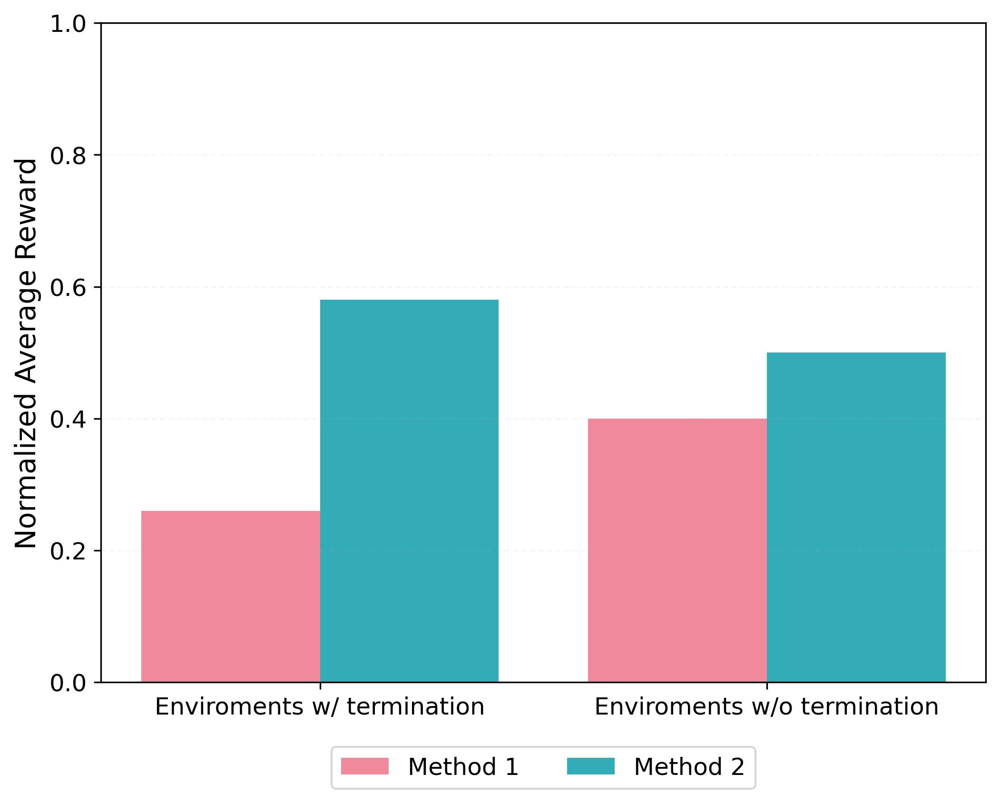

In [119]:
import numpy as np
import matplotlib.pyplot as plt

# Set the color palette
colors = ['#ee6c84ff', '#0097a658']

# Data for the bar chart
categories = ["Enviroments w/ termination", "Enviroments w/o termination"]
values = np.array([[0.26, 0.58],[0.40, 0.5]])
std_dev = np.array([[0.4, 0.18],[0.1, 0.1]])

# Create the figure
plt.figure(figsize=(8, 6), dpi=300)

# Bar width
bar_width = 0.4
x = np.arange(len(categories))

# Plot bars with error bars
bars = []
# for i in range(2):
#     bars.append(plt.bar(x + (i - 0.5) * bar_width, values[:, i], yerr=std_dev[:, i], 
#                         capsize=5, color=colors[i], alpha=0.8, width=bar_width))

for i in range(2):
    bars.append(plt.bar(x + (i - 0.5) * bar_width, values[:, i], 
                        capsize=5, color=colors[i], alpha=0.8, width=bar_width))

# Format the x-axis
plt.xticks(x, categories, fontsize=12)
plt.yticks(fontsize=12)
plt.ylim(0, 1)

# Add y-axis label
plt.ylabel("Normalized Average Reward", fontsize=14)

# Enable grid
plt.grid(axis='y', linestyle='--', alpha=0.1)

# Add legend below the plot
plt.legend(bars, ['Method 1', 'Method 2'], fontsize=12, loc='upper center', bbox_to_anchor=(0.5, -0.08), ncol=2)

# Show the plot
plt.show()


1260.8662414550781 125.92916843269285
343.84515380859375 96.99939163489142


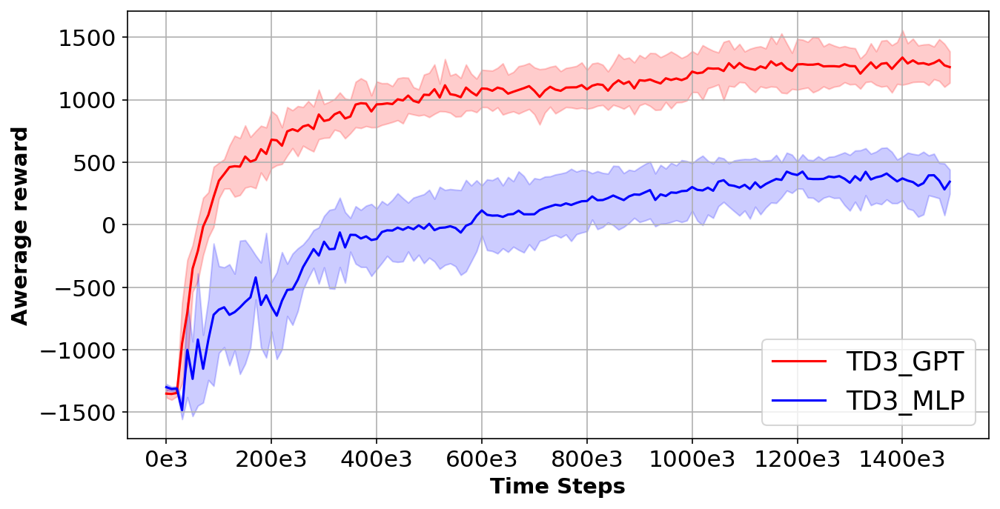

In [9]:

import os
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Функция для нормализации шагов

def normalize_steps(df, step_interval=1000):
    df['NormalizedStep'] = (df['Step'] // step_interval) * step_interval
    return df

# Функция для сглаживания данных

def smooth_data(df, window_size=10):
    df = df.sort_values('Step')
    df['SmoothedValue'] = df['Value'].rolling(window=window_size, min_periods=1).mean()
    return df

# Функция для чтения значений метрики из логов TensorBoard

def extract_metric_from_events(logdir, metric_name):
    event_files = [os.path.join(logdir, f) for f in os.listdir(logdir) if 'events.out.tfevents' in f]
    all_data = []
    
    for event_file in event_files:
        steps, values = [], []
        for e in tf.compat.v1.train.summary_iterator(event_file):
            for v in e.summary.value:
                if v.tag == metric_name:
                    steps.append(e.step)
                    values.append(v.simple_value)
        df = pd.DataFrame({'Step': steps, 'Value': values})
        all_data.append(df)
    
    return all_data

# Функция для форматирования делений оси X

def format_ticks(x, pos):
    return f"{int(x / 1000)}e3"

# Функция для рисования графиков

def plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000):
    subfolders = [os.path.join(main_logdir, f) for f in os.listdir(main_logdir) if os.path.isdir(os.path.join(main_logdir, f))]
    plt.figure(figsize=(10, 5), dpi=150)
    
    colors = ['red', 'blue', 'green', 'purple']
    
    for idx, subfolder in enumerate(subfolders):
        color = colors[idx % len(colors)]
        all_data = extract_metric_from_events(subfolder, metric_name)
        
        smoothed_data = []
        for df in all_data:
            df = normalize_steps(df, step_interval)
            df_smoothed = smooth_data(df, window_size)
            smoothed_data.append(df_smoothed[['NormalizedStep', 'SmoothedValue']])
        
        combined_data = pd.concat(smoothed_data).groupby('NormalizedStep').agg(
            mean_value=('SmoothedValue', 'mean'),
            std_value=('SmoothedValue', 'std')
        ).reset_index()
        
        plt.plot(combined_data['NormalizedStep'], combined_data['mean_value'], label=f'{os.path.basename(subfolder)}', color=color)
        print(combined_data['mean_value'].to_numpy()[-1], combined_data['std_value'].to_numpy()[-1])

        plt.fill_between(
            combined_data['NormalizedStep'],
            combined_data['mean_value'] - combined_data['std_value'],
            combined_data['mean_value'] + combined_data['std_value'],
            alpha=0.2, color=color
        )
    
    ax = plt.gca()
    ax.xaxis.set_major_formatter(FuncFormatter(format_ticks))
    
    plt.xlabel('Time Steps', fontweight='bold', fontsize=14)
    plt.ylabel('Awerage reward', fontweight='bold', fontsize=14)
    ax.tick_params(axis='both', labelsize=15)
    plt.legend(fontsize=17)
    plt.grid(True)
    output_filename = f"{main_logdir}/graph.png"
    plt.savefig(output_filename, format='png', dpi=300, bbox_inches='tight')
    plt.show()
    
    plt.show()

# # Путь к папке с логами
# main_logdir = './DONE_Experiment_1_JUST_WORKS_ppo_nano_gpt_vs_mlp/Hopper'  # Укажите путь к папке, где находятся подпапки с логами
# metric_name = 'eval/episodic_return'  # Укажите название метрикиmetric_name = 'eval/episodic_return'

# # Рисуем графики
# plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000)




# Путь к папке с подпапками логов
main_logdir = './NEW_Experiment_7_POMDP/HalfCheetah_V'  # Укажите путь к папке, где находятся подпапки с логами
metric_name = 'eval/episodic_return'  # Укажите название метрики

# Рисуем графики для всех подпапок с указанным окном сглаживания
plot_metrics_from_subfolders(main_logdir, metric_name, window_size=1, step_interval=1)



549.0363515218099 221.37798686983544
801.4250284830729 140.46685024303196


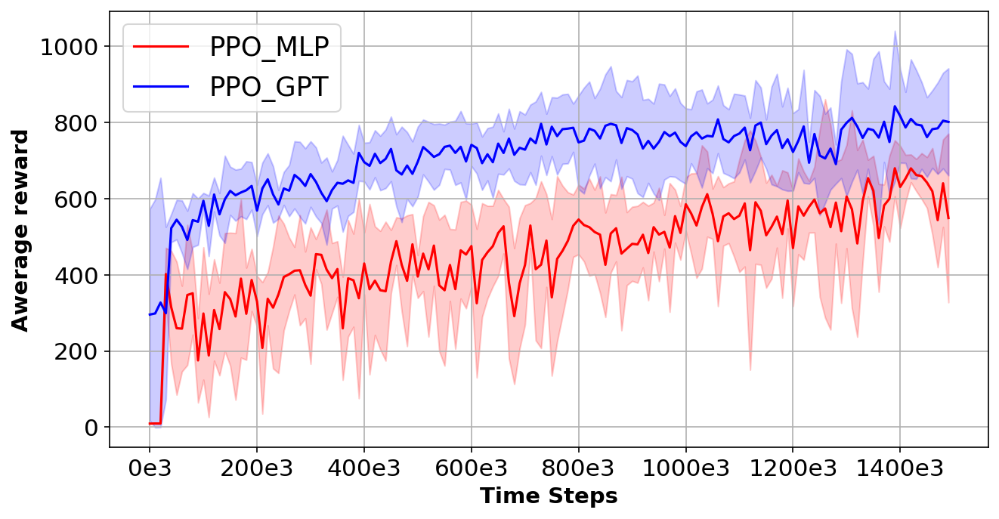

In [6]:

import os
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Функция для нормализации шагов

def normalize_steps(df, step_interval=1000):
    df['NormalizedStep'] = (df['Step'] // step_interval) * step_interval
    return df

# Функция для сглаживания данных

def smooth_data(df, window_size=10):
    df = df.sort_values('Step')
    df['SmoothedValue'] = df['Value'].rolling(window=window_size, min_periods=1).mean()
    return df

# Функция для чтения значений метрики из логов TensorBoard

def extract_metric_from_events(logdir, metric_name):
    event_files = [os.path.join(logdir, f) for f in os.listdir(logdir) if 'events.out.tfevents' in f]
    all_data = []
    
    for event_file in event_files:
        steps, values = [], []
        for e in tf.compat.v1.train.summary_iterator(event_file):
            for v in e.summary.value:
                if v.tag == metric_name:
                    steps.append(e.step)
                    values.append(v.simple_value)
        df = pd.DataFrame({'Step': steps, 'Value': values})
        all_data.append(df)
    
    return all_data

# Функция для форматирования делений оси X

def format_ticks(x, pos):
    return f"{int(x / 1000)}e3"

# Функция для рисования графиков

def plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000):
    subfolders = [os.path.join(main_logdir, f) for f in os.listdir(main_logdir) if os.path.isdir(os.path.join(main_logdir, f))]
    plt.figure(figsize=(10, 5), dpi=150)
    
    colors = ['red', 'blue', 'green', 'purple']
    
    for idx, subfolder in enumerate(subfolders):
        color = colors[idx % len(colors)]
        all_data = extract_metric_from_events(subfolder, metric_name)
        
        smoothed_data = []
        for df in all_data:
            df = normalize_steps(df, step_interval)
            df_smoothed = smooth_data(df, window_size)
            smoothed_data.append(df_smoothed[['NormalizedStep', 'SmoothedValue']])
        
        combined_data = pd.concat(smoothed_data).groupby('NormalizedStep').agg(
            mean_value=('SmoothedValue', 'mean'),
            std_value=('SmoothedValue', 'std')
        ).reset_index()
        
        plt.plot(combined_data['NormalizedStep'], combined_data['mean_value'], label=f'{os.path.basename(subfolder)}', color=color)
        print(combined_data['mean_value'].to_numpy()[-1], combined_data['std_value'].to_numpy()[-1])

        plt.fill_between(
            combined_data['NormalizedStep'],
            combined_data['mean_value'] - combined_data['std_value'],
            combined_data['mean_value'] + combined_data['std_value'],
            alpha=0.2, color=color
        )
    
    ax = plt.gca()
    ax.xaxis.set_major_formatter(FuncFormatter(format_ticks))
    
    plt.xlabel('Time Steps', fontweight='bold', fontsize=14)
    plt.ylabel('Awerage reward', fontweight='bold', fontsize=14)
    ax.tick_params(axis='both', labelsize=15)
    plt.legend(fontsize=17)
    plt.grid(True)
    output_filename = f"{main_logdir}/graph.png"
    plt.savefig(output_filename, format='png', dpi=300, bbox_inches='tight')
    plt.show()
    
    plt.show()

# # Путь к папке с логами
# main_logdir = './DONE_Experiment_1_JUST_WORKS_ppo_nano_gpt_vs_mlp/Hopper'  # Укажите путь к папке, где находятся подпапки с логами
# metric_name = 'eval/episodic_return'  # Укажите название метрикиmetric_name = 'eval/episodic_return'

# # Рисуем графики
# plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000)




# Путь к папке с подпапками логов
main_logdir = './NEW_Experiment_7_POMDP/Ant_V'  # Укажите путь к папке, где находятся подпапки с логами
metric_name = 'eval/episodic_return'  # Укажите название метрики

# Рисуем графики для всех подпапок с указанным окном сглаживания
plot_metrics_from_subfolders(main_logdir, metric_name, window_size=1, step_interval=1)



98.24618148803711 58.37729485085844
588.0065663655599 220.02118226004964


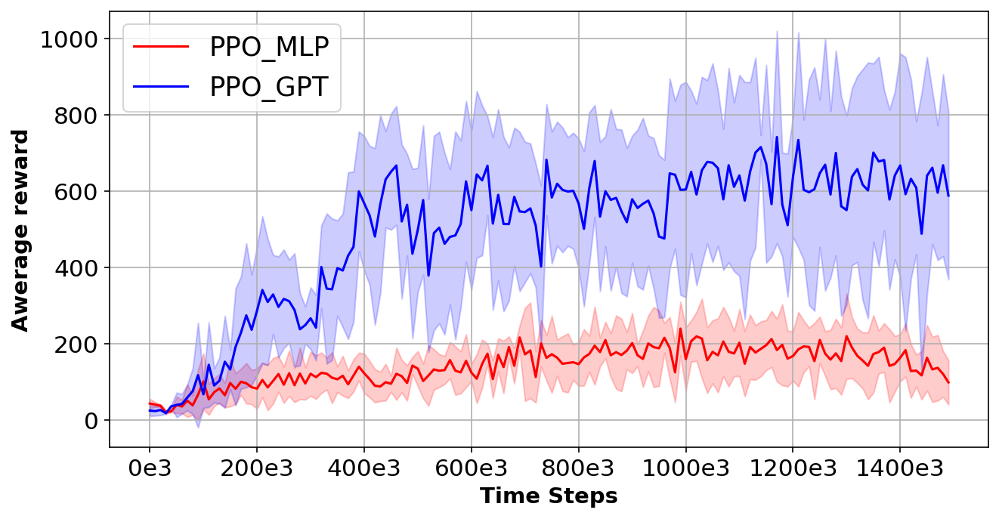

In [7]:

import os
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Функция для нормализации шагов

def normalize_steps(df, step_interval=1000):
    df['NormalizedStep'] = (df['Step'] // step_interval) * step_interval
    return df

# Функция для сглаживания данных

def smooth_data(df, window_size=10):
    df = df.sort_values('Step')
    df['SmoothedValue'] = df['Value'].rolling(window=window_size, min_periods=1).mean()
    return df

# Функция для чтения значений метрики из логов TensorBoard

def extract_metric_from_events(logdir, metric_name):
    event_files = [os.path.join(logdir, f) for f in os.listdir(logdir) if 'events.out.tfevents' in f]
    all_data = []
    
    for event_file in event_files:
        steps, values = [], []
        for e in tf.compat.v1.train.summary_iterator(event_file):
            for v in e.summary.value:
                if v.tag == metric_name:
                    steps.append(e.step)
                    values.append(v.simple_value)
        df = pd.DataFrame({'Step': steps, 'Value': values})
        all_data.append(df)
    
    return all_data

# Функция для форматирования делений оси X

def format_ticks(x, pos):
    return f"{int(x / 1000)}e3"

# Функция для рисования графиков

def plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000):
    subfolders = [os.path.join(main_logdir, f) for f in os.listdir(main_logdir) if os.path.isdir(os.path.join(main_logdir, f))]
    plt.figure(figsize=(10, 5), dpi=150)
    
    colors = ['red', 'blue', 'green', 'purple']
    
    for idx, subfolder in enumerate(subfolders):
        color = colors[idx % len(colors)]
        all_data = extract_metric_from_events(subfolder, metric_name)
        
        smoothed_data = []
        for df in all_data:
            df = normalize_steps(df, step_interval)
            df_smoothed = smooth_data(df, window_size)
            smoothed_data.append(df_smoothed[['NormalizedStep', 'SmoothedValue']])
        
        combined_data = pd.concat(smoothed_data).groupby('NormalizedStep').agg(
            mean_value=('SmoothedValue', 'mean'),
            std_value=('SmoothedValue', 'std')
        ).reset_index()
        
        plt.plot(combined_data['NormalizedStep'], combined_data['mean_value'], label=f'{os.path.basename(subfolder)}', color=color)
        print(combined_data['mean_value'].to_numpy()[-1], combined_data['std_value'].to_numpy()[-1])

        plt.fill_between(
            combined_data['NormalizedStep'],
            combined_data['mean_value'] - combined_data['std_value'],
            combined_data['mean_value'] + combined_data['std_value'],
            alpha=0.2, color=color
        )
    
    ax = plt.gca()
    ax.xaxis.set_major_formatter(FuncFormatter(format_ticks))
    
    plt.xlabel('Time Steps', fontweight='bold', fontsize=14)
    plt.ylabel('Awerage reward', fontweight='bold', fontsize=14)
    ax.tick_params(axis='both', labelsize=15)
    plt.legend(fontsize=17)
    plt.grid(True)
    output_filename = f"{main_logdir}/graph.png"
    plt.savefig(output_filename, format='png', dpi=300, bbox_inches='tight')
    plt.show()
    
    plt.show()

# # Путь к папке с логами
# main_logdir = './DONE_Experiment_1_JUST_WORKS_ppo_nano_gpt_vs_mlp/Hopper'  # Укажите путь к папке, где находятся подпапки с логами
# metric_name = 'eval/episodic_return'  # Укажите название метрикиmetric_name = 'eval/episodic_return'

# # Рисуем графики
# plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000)




# Путь к папке с подпапками логов
main_logdir = './NEW_Experiment_7_POMDP/Hopper_V'  # Укажите путь к папке, где находятся подпапки с логами
metric_name = 'eval/episodic_return'  # Укажите название метрики

# Рисуем графики для всех подпапок с указанным окном сглаживания
plot_metrics_from_subfolders(main_logdir, metric_name, window_size=1, step_interval=1)



92.589537302653 43.479280741506635
259.85386047363284 143.35582544588107


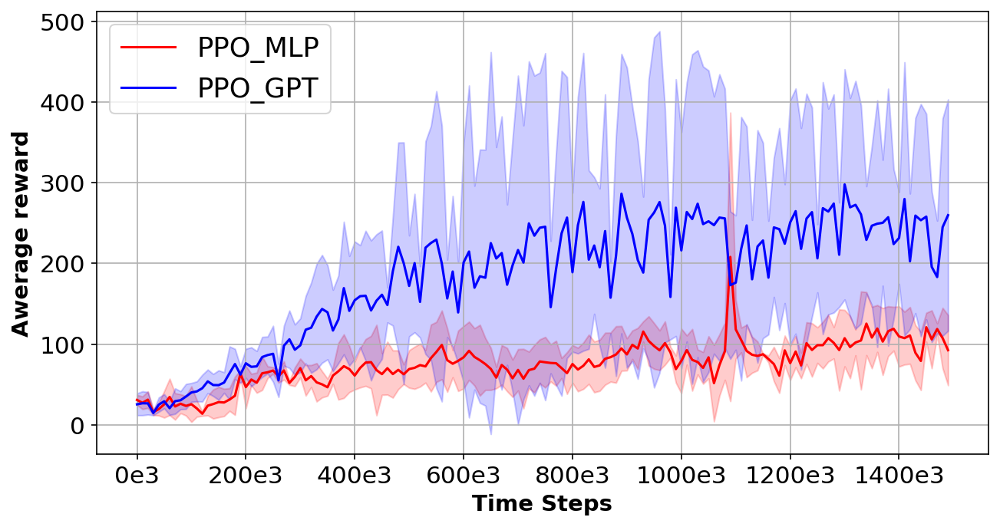

In [8]:

import os
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Функция для нормализации шагов

def normalize_steps(df, step_interval=1000):
    df['NormalizedStep'] = (df['Step'] // step_interval) * step_interval
    return df

# Функция для сглаживания данных

def smooth_data(df, window_size=10):
    df = df.sort_values('Step')
    df['SmoothedValue'] = df['Value'].rolling(window=window_size, min_periods=1).mean()
    return df

# Функция для чтения значений метрики из логов TensorBoard

def extract_metric_from_events(logdir, metric_name):
    event_files = [os.path.join(logdir, f) for f in os.listdir(logdir) if 'events.out.tfevents' in f]
    all_data = []
    
    for event_file in event_files:
        steps, values = [], []
        for e in tf.compat.v1.train.summary_iterator(event_file):
            for v in e.summary.value:
                if v.tag == metric_name:
                    steps.append(e.step)
                    values.append(v.simple_value)
        df = pd.DataFrame({'Step': steps, 'Value': values})
        all_data.append(df)
    
    return all_data

# Функция для форматирования делений оси X

def format_ticks(x, pos):
    return f"{int(x / 1000)}e3"

# Функция для рисования графиков

def plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000):
    subfolders = [os.path.join(main_logdir, f) for f in os.listdir(main_logdir) if os.path.isdir(os.path.join(main_logdir, f))]
    plt.figure(figsize=(10, 5), dpi=150)
    
    colors = ['red', 'blue', 'green', 'purple']
    
    for idx, subfolder in enumerate(subfolders):
        color = colors[idx % len(colors)]
        all_data = extract_metric_from_events(subfolder, metric_name)
        
        smoothed_data = []
        for df in all_data:
            df = normalize_steps(df, step_interval)
            df_smoothed = smooth_data(df, window_size)
            smoothed_data.append(df_smoothed[['NormalizedStep', 'SmoothedValue']])
        
        combined_data = pd.concat(smoothed_data).groupby('NormalizedStep').agg(
            mean_value=('SmoothedValue', 'mean'),
            std_value=('SmoothedValue', 'std')
        ).reset_index()
        
        plt.plot(combined_data['NormalizedStep'], combined_data['mean_value'], label=f'{os.path.basename(subfolder)}', color=color)
        print(combined_data['mean_value'].to_numpy()[-1], combined_data['std_value'].to_numpy()[-1])

        plt.fill_between(
            combined_data['NormalizedStep'],
            combined_data['mean_value'] - combined_data['std_value'],
            combined_data['mean_value'] + combined_data['std_value'],
            alpha=0.2, color=color
        )
    
    ax = plt.gca()
    ax.xaxis.set_major_formatter(FuncFormatter(format_ticks))
    
    plt.xlabel('Time Steps', fontweight='bold', fontsize=14)
    plt.ylabel('Awerage reward', fontweight='bold', fontsize=14)
    ax.tick_params(axis='both', labelsize=15)
    plt.legend(fontsize=17)
    plt.grid(True)
    output_filename = f"{main_logdir}/graph.png"
    plt.savefig(output_filename, format='png', dpi=300, bbox_inches='tight')
    plt.show()
    
    plt.show()

# # Путь к папке с логами
# main_logdir = './DONE_Experiment_1_JUST_WORKS_ppo_nano_gpt_vs_mlp/Hopper'  # Укажите путь к папке, где находятся подпапки с логами
# metric_name = 'eval/episodic_return'  # Укажите название метрикиmetric_name = 'eval/episodic_return'

# # Рисуем графики
# plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000)




# Путь к папке с подпапками логов
main_logdir = './NEW_Experiment_7_POMDP/Walker_V'  # Укажите путь к папке, где находятся подпапки с логами
metric_name = 'eval/episodic_return'  # Укажите название метрики

# Рисуем графики для всех подпапок с указанным окном сглаживания
plot_metrics_from_subfolders(main_logdir, metric_name, window_size=1, step_interval=1)



# Exp 5 diagram 

In [ ]:

import os
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Функция для нормализации шагов

def normalize_steps(df, step_interval=1000):
    df['NormalizedStep'] = (df['Step'] // step_interval) * step_interval
    return df

# Функция для сглаживания данных

def smooth_data(df, window_size=10):
    df = df.sort_values('Step')
    df['SmoothedValue'] = df['Value'].rolling(window=window_size, min_periods=1).mean()
    return df

# Функция для чтения значений метрики из логов TensorBoard

def extract_metric_from_events(logdir, metric_name):
    event_files = [os.path.join(logdir, f) for f in os.listdir(logdir) if 'events.out.tfevents' in f]
    all_data = []
    
    for event_file in event_files:
        steps, values = [], []
        for e in tf.compat.v1.train.summary_iterator(event_file):
            for v in e.summary.value:
                if v.tag == metric_name:
                    steps.append(e.step)
                    values.append(v.simple_value)
        df = pd.DataFrame({'Step': steps, 'Value': values})
        all_data.append(df)
    
    return all_data

# Функция для форматирования делений оси X

def format_ticks(x, pos):
    return f"{int(x / 1000)}e3"

# Функция для рисования графиков

def plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000):
    subfolders = [os.path.join(main_logdir, f) for f in os.listdir(main_logdir) if os.path.isdir(os.path.join(main_logdir, f))]
    plt.figure(figsize=(10, 5), dpi=150)
    
    colors = ['red', 'blue', 'green', 'purple']
    
    for idx, subfolder in enumerate(subfolders):
        color = colors[idx % len(colors)]
        all_data = extract_metric_from_events(subfolder, metric_name)
        
        smoothed_data = []
        for df in all_data:
            df = normalize_steps(df, step_interval)
            df_smoothed = smooth_data(df, window_size)
            smoothed_data.append(df_smoothed[['NormalizedStep', 'SmoothedValue']])
        
        combined_data = pd.concat(smoothed_data).groupby('NormalizedStep').agg(
            mean_value=('SmoothedValue', 'mean'),
            std_value=('SmoothedValue', 'std')
        ).reset_index()
        
        plt.plot(combined_data['NormalizedStep'], combined_data['mean_value'], label=f'{os.path.basename(subfolder)}', color=color)
        print(combined_data['mean_value'].to_numpy()[-1], combined_data['std_value'].to_numpy()[-1])

        plt.fill_between(
            combined_data['NormalizedStep'],
            combined_data['mean_value'] - combined_data['std_value'],
            combined_data['mean_value'] + combined_data['std_value'],
            alpha=0.2, color=color
        )
    
    ax = plt.gca()
    ax.xaxis.set_major_formatter(FuncFormatter(format_ticks))
    
    plt.xlabel('Time Steps', fontweight='bold', fontsize=14)
    plt.ylabel('Awerage reward', fontweight='bold', fontsize=14)
    ax.tick_params(axis='both', labelsize=15)
    plt.legend(fontsize=17)
    plt.grid(True)
    output_filename = f"{main_logdir}/graph.png"
    plt.savefig(output_filename, format='png', dpi=300, bbox_inches='tight')
    plt.show()
    
    plt.show()

# # Путь к папке с логами
# main_logdir = './DONE_Experiment_1_JUST_WORKS_ppo_nano_gpt_vs_mlp/Hopper'  # Укажите путь к папке, где находятся подпапки с логами
# metric_name = 'eval/episodic_return'  # Укажите название метрикиmetric_name = 'eval/episodic_return'

# # Рисуем графики
# plot_metrics_from_subfolders(main_logdir, metric_name, window_size=10, step_interval=8000)




# Путь к папке с подпапками логов
main_logdir = './NEW_Experiment_7_POMDP/Hopper_V'  # Укажите путь к папке, где находятся подпапки с логами
metric_name = 'eval/episodic_return'  # Укажите название метрики

# Рисуем графики для всех подпапок с указанным окном сглаживания
plot_metrics_from_subfolders(main_logdir, metric_name, window_size=1, step_interval=1)



# Exp_1 NEW GRAPHS

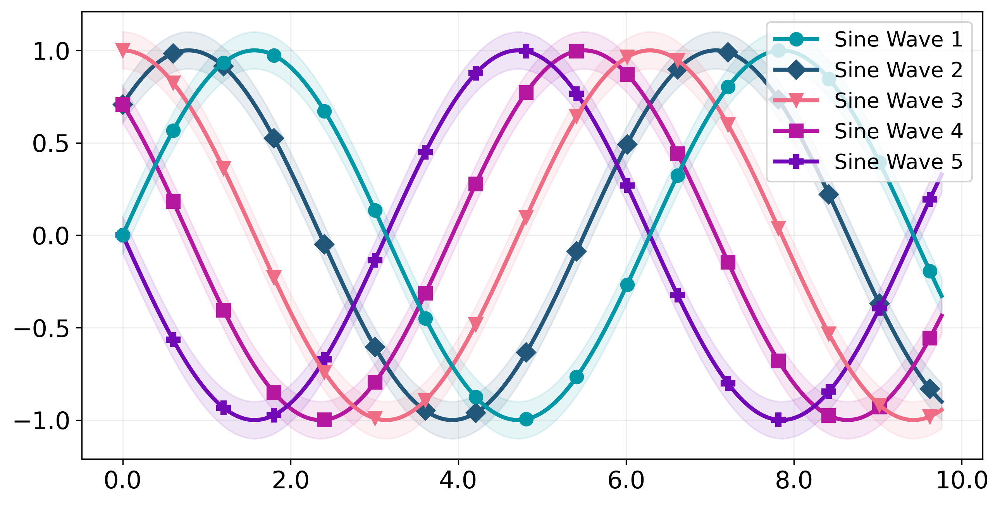

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Set the color palette
colors = ['#22577A', '#0097A6', '#EE6D84', '#b5179e', '#7209b7']

# Generate sine wave data
t = np.linspace(0, 10, 500)
sin1 = np.sin(t)
sin2 = np.sin(t + np.pi / 4)
sin3 = np.sin(t + np.pi / 2)
sin4 = np.sin(t + 3 * np.pi / 4)
sin5 = np.sin(t + np.pi)

std_dev = 0.1  # Standard deviation for fill_between

plt.figure(figsize=(10, 5), dpi=300)

cutout = 488

# Set a less frequent interval for markers
marker_interval = 30
fill_alpha = 0.1
linewidth = 2.5
markersize = 8

# Plot the data with markers and adjusted color palette
plt.plot(t[:cutout], sin1[:cutout], label='Sine Wave 1', color=colors[1], zorder=5, marker='o', markersize=markersize, markevery=marker_interval, linewidth=linewidth)
plt.fill_between(t[:cutout], sin1[:cutout] - std_dev, sin1[:cutout] + std_dev, color=colors[1], alpha=fill_alpha)

plt.plot(t[:cutout], sin2[:cutout], label='Sine Wave 2', color=colors[0], zorder=3, marker='D', markersize=markersize, markevery=marker_interval, linewidth=linewidth)
plt.fill_between(t[:cutout], sin2[:cutout] - std_dev, sin2[:cutout] + std_dev, color=colors[0], alpha=fill_alpha)

plt.plot(t[:cutout], sin3[:cutout], label='Sine Wave 3', color=colors[2], zorder=4, marker='v', markersize=markersize, markevery=marker_interval, linewidth=linewidth)
plt.fill_between(t[:cutout], sin3[:cutout] - std_dev, sin3[:cutout] + std_dev, color=colors[2], alpha=fill_alpha)

plt.plot(t[:cutout], sin4[:cutout], label='Sine Wave 4', color=colors[3], zorder=3, marker='s', markersize=markersize, markevery=marker_interval, linewidth=linewidth)
plt.fill_between(t[:cutout], sin4[:cutout] - std_dev, sin4[:cutout] + std_dev, color=colors[3], alpha=fill_alpha)

plt.plot(t[:cutout], sin5[:cutout], label='Sine Wave 5', color=colors[4], zorder=3, marker='P', markersize=markersize, markevery=marker_interval, linewidth=linewidth)
plt.fill_between(t[:cutout], sin5[:cutout] - std_dev, sin5[:cutout] + std_dev, color=colors[4], alpha=fill_alpha)

# Format the x-axis ticks
def format_ticks(x, pos):
    return f"{x:.1f}"  # Format ticks as 0.2, 0.6, 0.8, 1.0, etc.

ax = plt.gca()
ax.xaxis.set_major_formatter(FuncFormatter(format_ticks))

# Set tick parameters
ax.tick_params(axis='both', labelsize=15)

# Enable grid and display the plot
plt.grid(True, alpha=0.2)
plt.legend(fontsize=13)
plt.show()


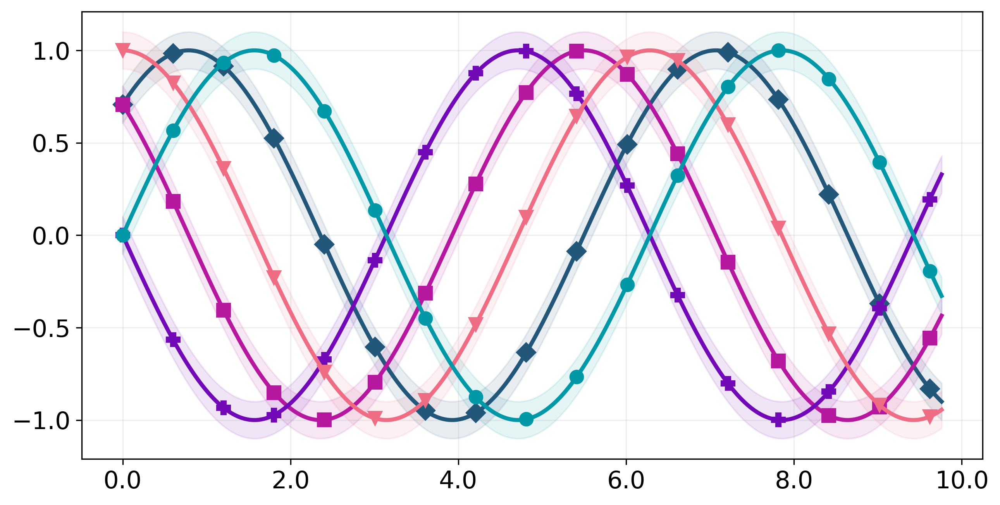

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Set the color palette
colors = ['#22577A', '#0097A6', '#EE6D84', '#b5179e', '#7209b7']

# Generate sine wave data
t = np.linspace(0, 10, 500)
sin1 = np.sin(t)
sin2 = np.sin(t + np.pi / 4)
sin3 = np.sin(t + np.pi / 2)
sin4 = np.sin(t + 3 * np.pi / 4)
sin5 = np.sin(t + np.pi)

std_dev = 0.1  # Standard deviation for fill_between

plt.figure(figsize=(10, 5), dpi=300)

cutout = 488

# Set a less frequent interval for markers
marker_interval = 30
fill_alpha = 0.1
linewidth = 2.5
markersize = 8

# Plot the data with markers and adjusted color palette
plt.plot(t[:cutout], sin1[:cutout], label='Sine Wave 1', color=colors[1], zorder=5, marker='o', markersize=markersize, markevery=marker_interval, linewidth=linewidth)
plt.fill_between(t[:cutout], sin1[:cutout] - std_dev, sin1[:cutout] + std_dev, color=colors[1], alpha=fill_alpha)

plt.plot(t[:cutout], sin2[:cutout], label='Sine Wave 2', color=colors[0], zorder=3, marker='D', markersize=markersize, markevery=marker_interval, linewidth=linewidth)
plt.fill_between(t[:cutout], sin2[:cutout] - std_dev, sin2[:cutout] + std_dev, color=colors[0], alpha=fill_alpha)

plt.plot(t[:cutout], sin3[:cutout], label='Sine Wave 3', color=colors[2], zorder=4, marker='v', markersize=markersize, markevery=marker_interval, linewidth=linewidth)
plt.fill_between(t[:cutout], sin3[:cutout] - std_dev, sin3[:cutout] + std_dev, color=colors[2], alpha=fill_alpha)

plt.plot(t[:cutout], sin4[:cutout], label='Sine Wave 4', color=colors[3], zorder=3, marker='s', markersize=markersize, markevery=marker_interval, linewidth=linewidth)
plt.fill_between(t[:cutout], sin4[:cutout] - std_dev, sin4[:cutout] + std_dev, color=colors[3], alpha=fill_alpha)

plt.plot(t[:cutout], sin5[:cutout], label='Sine Wave 5', color=colors[4], zorder=3, marker='P', markersize=markersize, markevery=marker_interval, linewidth=linewidth)
plt.fill_between(t[:cutout], sin5[:cutout] - std_dev, sin5[:cutout] + std_dev, color=colors[4], alpha=fill_alpha)

# Format the x-axis ticks
def format_ticks(x, pos):
    return f"{x:.1f}"  # Format ticks as 0.2, 0.6, 0.8, 1.0, etc.

ax = plt.gca()
ax.xaxis.set_major_formatter(FuncFormatter(format_ticks))

# Set tick parameters
ax.tick_params(axis='both', labelsize=15)

# Enable grid and display the plot
plt.grid(True, alpha=0.2)
plt.show()


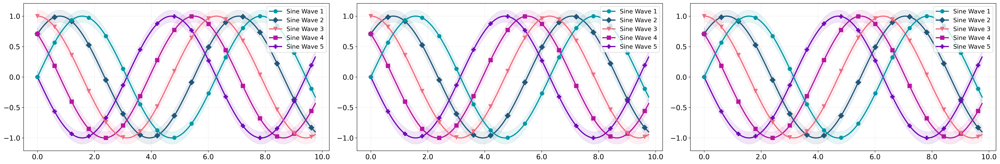

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Set the color palette
colors = ['#22577A', '#0097A6', '#EE6D84', '#b5179e', '#7209b7']

# Generate sine wave data
t = np.linspace(0, 10, 500)
sin1 = np.sin(t)
sin2 = np.sin(t + np.pi / 4)
sin3 = np.sin(t + np.pi / 2)
sin4 = np.sin(t + 3 * np.pi / 4)
sin5 = np.sin(t + np.pi)

std_dev = 0.1  # Standard deviation for fill_between

# Create a figure with three subplots in a row
fig, axes = plt.subplots(1, 3, figsize=(30, 5), dpi=300)

cutout = 488

# Set a less frequent interval for markers
marker_interval = 30
fill_alpha = 0.1
linewidth = 2.5
markersize = 8

# Function to plot the same graph in each subplot
def plot_sine_waves(ax):
    ax.plot(t[:cutout], sin1[:cutout], label='Sine Wave 1', color=colors[1], zorder=5,
            marker='o', markersize=markersize, markevery=marker_interval, linewidth=linewidth)
    ax.fill_between(t[:cutout], sin1[:cutout] - std_dev, sin1[:cutout] + std_dev, color=colors[1], alpha=fill_alpha)

    ax.plot(t[:cutout], sin2[:cutout], label='Sine Wave 2', color=colors[0], zorder=3,
            marker='D', markersize=markersize, markevery=marker_interval, linewidth=linewidth)
    ax.fill_between(t[:cutout], sin2[:cutout] - std_dev, sin2[:cutout] + std_dev, color=colors[0], alpha=fill_alpha)

    ax.plot(t[:cutout], sin3[:cutout], label='Sine Wave 3', color=colors[2], zorder=4,
            marker='v', markersize=markersize, markevery=marker_interval, linewidth=linewidth)
    ax.fill_between(t[:cutout], sin3[:cutout] - std_dev, sin3[:cutout] + std_dev, color=colors[2], alpha=fill_alpha)

    ax.plot(t[:cutout], sin4[:cutout], label='Sine Wave 4', color=colors[3], zorder=3,
            marker='s', markersize=markersize, markevery=marker_interval, linewidth=linewidth)
    ax.fill_between(t[:cutout], sin4[:cutout] - std_dev, sin4[:cutout] + std_dev, color=colors[3], alpha=fill_alpha)

    ax.plot(t[:cutout], sin5[:cutout], label='Sine Wave 5', color=colors[4], zorder=3,
            marker='P', markersize=markersize, markevery=marker_interval, linewidth=linewidth)
    ax.fill_between(t[:cutout], sin5[:cutout] - std_dev, sin5[:cutout] + std_dev, color=colors[4], alpha=fill_alpha)

    # Format the x-axis ticks
    ax.xaxis.set_major_formatter(FuncFormatter(lambda x, pos: f"{x:.1f}"))
    
    # Set tick parameters
    ax.tick_params(axis='both', labelsize=15)
    
    ax.grid(True, alpha=0.2)
    ax.legend(fontsize=13)

# Plot the same graph in each subplot
for ax in axes:
    plot_sine_waves(ax)

plt.tight_layout()
plt.show()


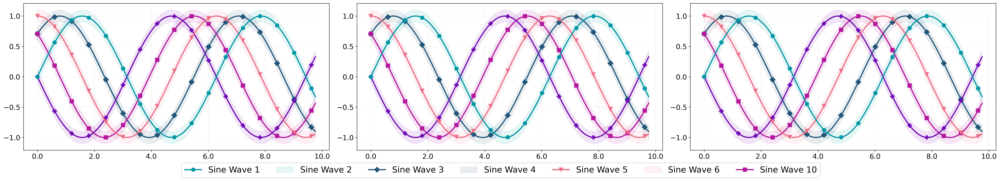

In [24]:
# Create a figure with three subplots in a row
fig, axes = plt.subplots(1, 3, figsize=(30, 5), dpi=300)

# Function to plot the same graph in each subplot without individual legends
def plot_sine_waves(ax):
    ax.plot(t[:cutout], sin1[:cutout], color=colors[1], zorder=5,
            marker='o', markersize=markersize, markevery=marker_interval, linewidth=linewidth)
    ax.fill_between(t[:cutout], sin1[:cutout] - std_dev, sin1[:cutout] + std_dev, color=colors[1], alpha=fill_alpha)

    ax.plot(t[:cutout], sin2[:cutout], color=colors[0], zorder=3,
            marker='D', markersize=markersize, markevery=marker_interval, linewidth=linewidth)
    ax.fill_between(t[:cutout], sin2[:cutout] - std_dev, sin2[:cutout] + std_dev, color=colors[0], alpha=fill_alpha)

    ax.plot(t[:cutout], sin3[:cutout], color=colors[2], zorder=4,
            marker='v', markersize=markersize, markevery=marker_interval, linewidth=linewidth)
    ax.fill_between(t[:cutout], sin3[:cutout] - std_dev, sin3[:cutout] + std_dev, color=colors[2], alpha=fill_alpha)

    ax.plot(t[:cutout], sin4[:cutout], color=colors[3], zorder=3,
            marker='s', markersize=markersize, markevery=marker_interval, linewidth=linewidth)
    ax.fill_between(t[:cutout], sin4[:cutout] - std_dev, sin4[:cutout] + std_dev, color=colors[3], alpha=fill_alpha)

    ax.plot(t[:cutout], sin5[:cutout], color=colors[4], zorder=3,
            marker='P', markersize=markersize, markevery=marker_interval, linewidth=linewidth)
    ax.fill_between(t[:cutout], sin5[:cutout] - std_dev, sin5[:cutout] + std_dev, color=colors[4], alpha=fill_alpha)

    # Format the x-axis ticks
    ax.xaxis.set_major_formatter(FuncFormatter(lambda x, pos: f"{x:.1f}"))
    
    # Set tick parameters
    ax.tick_params(axis='both', labelsize=15)
    
    ax.grid(True, alpha=0.2)

# Plot the same graph in each subplot
for ax in axes:
    plot_sine_waves(ax)

# Create a common legend below all subplots
fig.legend(['Sine Wave 1', 'Sine Wave 2', 'Sine Wave 3', 'Sine Wave 4', 'Sine Wave 5', 'Sine Wave 6', 'Sine Wave 10'],
           loc='lower center', fontsize=18, ncol=15, bbox_to_anchor=(0.5, -0.1))

plt.tight_layout()
plt.show()


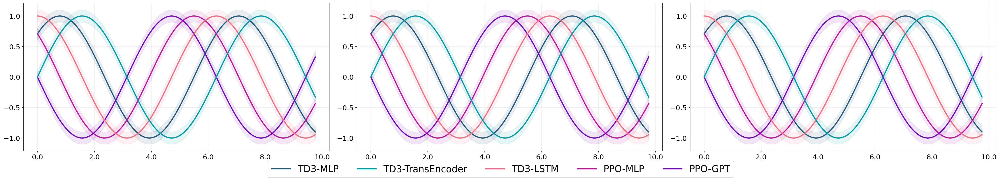

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Set the color palette
colors = ['#22577A', '#0097A6', '#EE6D84', '#b5179e', '#7209b7']

# Generate sine wave data
t = np.linspace(0, 10, 500)
sin1 = np.sin(t)
sin2 = np.sin(t + np.pi / 4)
sin3 = np.sin(t + np.pi / 2)
sin4 = np.sin(t + 3 * np.pi / 4)
sin5 = np.sin(t + np.pi)

std_dev = 0.1  # Standard deviation for fill_between

# Create a figure with three subplots in a row
fig, axes = plt.subplots(1, 3, figsize=(30, 5), dpi=150)
cutout = 488
linewidth = 2.5
fill_alpha = 0.1

# Function to plot the same graph in each subplot without markers
def plot_sine_waves(ax):
    ax.plot(t[:cutout], sin1[:cutout], color=colors[1], zorder=5, linewidth=linewidth, label='Sine Wave 1')
    ax.fill_between(t[:cutout], sin1[:cutout] - std_dev, sin1[:cutout] + std_dev, color=colors[1], alpha=fill_alpha)

    ax.plot(t[:cutout], sin2[:cutout], color=colors[0], zorder=3, linewidth=linewidth, label='Sine Wave 2')
    ax.fill_between(t[:cutout], sin2[:cutout] - std_dev, sin2[:cutout] + std_dev, color=colors[0], alpha=fill_alpha)

    ax.plot(t[:cutout], sin3[:cutout], color=colors[2], zorder=4, linewidth=linewidth, label='Sine Wave 3')
    ax.fill_between(t[:cutout], sin3[:cutout] - std_dev, sin3[:cutout] + std_dev, color=colors[2], alpha=fill_alpha)

    ax.plot(t[:cutout], sin4[:cutout], color=colors[3], zorder=3, linewidth=linewidth, label='Sine Wave 4')
    ax.fill_between(t[:cutout], sin4[:cutout] - std_dev, sin4[:cutout] + std_dev, color=colors[3], alpha=fill_alpha)

    ax.plot(t[:cutout], sin5[:cutout], color=colors[4], zorder=3, linewidth=linewidth, label='Sine Wave 5')
    ax.fill_between(t[:cutout], sin5[:cutout] - std_dev, sin5[:cutout] + std_dev, color=colors[4], alpha=fill_alpha)

    # Format the x-axis ticks
    ax.xaxis.set_major_formatter(FuncFormatter(lambda x, pos: f"{x:.1f}"))
    
    # Set tick parameters
    ax.tick_params(axis='both', labelsize=15)
    
    ax.grid(True, alpha=0.2)

# Plot the same graph in each subplot
for ax in axes:
    plot_sine_waves(ax)

# Create a common legend below all subplots with color lines
legend_handles = [plt.Line2D([0], [0], color=color, linewidth=2.5, label=label) 
                   for color, label in zip(colors, ['TD3-MLP', 'TD3-TransEncoder', 'TD3-LSTM', 'PPO-MLP', 'PPO-GPT'])]
fig.legend(handles=legend_handles, loc='lower center', fontsize=20, ncol=15, bbox_to_anchor=(0.5, -0.1))

plt.savefig('./exp_1_mujoco_all', dpi=150)
plt.tight_layout()
plt.show()


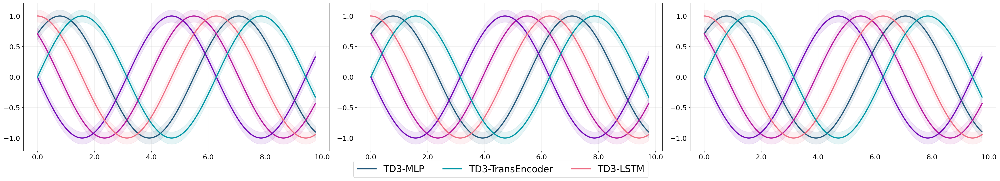

In [35]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Set the color palette
colors = ['#22577A', '#0097A6', '#EE6D84', '#b5179e', '#7209b7']

# Generate sine wave data
t = np.linspace(0, 10, 500)
sin1 = np.sin(t)
sin2 = np.sin(t + np.pi / 4)
sin3 = np.sin(t + np.pi / 2)
sin4 = np.sin(t + 3 * np.pi / 4)
sin5 = np.sin(t + np.pi)

std_dev = 0.1  # Standard deviation for fill_between

# Create a figure with three subplots in a row
fig, axes = plt.subplots(1, 3, figsize=(30, 5), dpi=150)
cutout = 488
linewidth = 2.5
fill_alpha = 0.1

# Function to plot the same graph in each subplot without markers
def plot_sine_waves(ax):
    ax.plot(t[:cutout], sin1[:cutout], color=colors[1], zorder=5, linewidth=linewidth, label='Sine Wave 1')
    ax.fill_between(t[:cutout], sin1[:cutout] - std_dev, sin1[:cutout] + std_dev, color=colors[1], alpha=fill_alpha)

    ax.plot(t[:cutout], sin2[:cutout], color=colors[0], zorder=3, linewidth=linewidth, label='Sine Wave 2')
    ax.fill_between(t[:cutout], sin2[:cutout] - std_dev, sin2[:cutout] + std_dev, color=colors[0], alpha=fill_alpha)

    ax.plot(t[:cutout], sin3[:cutout], color=colors[2], zorder=4, linewidth=linewidth, label='Sine Wave 3')
    ax.fill_between(t[:cutout], sin3[:cutout] - std_dev, sin3[:cutout] + std_dev, color=colors[2], alpha=fill_alpha)

    ax.plot(t[:cutout], sin4[:cutout], color=colors[3], zorder=3, linewidth=linewidth, label='Sine Wave 4')
    ax.fill_between(t[:cutout], sin4[:cutout] - std_dev, sin4[:cutout] + std_dev, color=colors[3], alpha=fill_alpha)

    ax.plot(t[:cutout], sin5[:cutout], color=colors[4], zorder=3, linewidth=linewidth, label='Sine Wave 5')
    ax.fill_between(t[:cutout], sin5[:cutout] - std_dev, sin5[:cutout] + std_dev, color=colors[4], alpha=fill_alpha)

    # Format the x-axis ticks
    ax.xaxis.set_major_formatter(FuncFormatter(lambda x, pos: f"{x:.1f}"))
    
    # Set tick parameters
    ax.tick_params(axis='both', labelsize=15)
    
    ax.grid(True, alpha=0.2)

# Plot the same graph in each subplot
for ax in axes:
    plot_sine_waves(ax)

# Create a common legend below all subplots with color lines
legend_handles = [plt.Line2D([0], [0], color=color, linewidth=2.5, label=label) 
                   for color, label in zip(colors[:-2], ['TD3-MLP', 'TD3-TransEncoder', 'TD3-LSTM'])]
fig.legend(handles=legend_handles, loc='lower center', fontsize=20, ncol=15, bbox_to_anchor=(0.5, -0.1))

plt.savefig('./exp_1_mujoco_all', dpi=150)
plt.tight_layout()
plt.show()


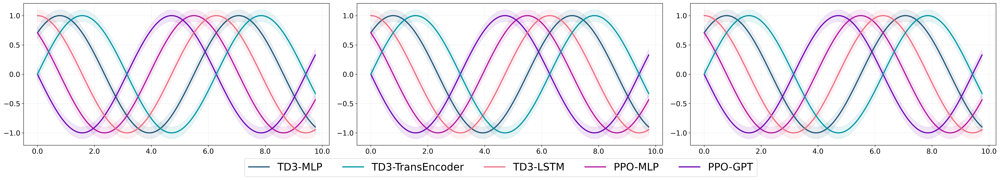

In [50]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Set the color palette
colors = ['#22577A', '#0097A6', '#EE6D84', '#b5179e', '#7209b7']

# Generate sine wave data
t = np.linspace(0, 10, 500)
sin1 = np.sin(t)
sin2 = np.sin(t + np.pi / 4)
sin3 = np.sin(t + np.pi / 2)
sin4 = np.sin(t + 3 * np.pi / 4)
sin5 = np.sin(t + np.pi)

std_dev = 0.1  # Standard deviation for fill_between

# Create a figure with three subplots in a row
fig, axes = plt.subplots(1, 3, figsize=(30, 5), dpi=300)
cutout = 488
linewidth = 2.5
fill_alpha = 0.1

# Function to plot the same graph in each subplot without markers
def plot_sine_waves(ax):
    ax.plot(t[:cutout], sin1[:cutout], color=colors[1], zorder=5, linewidth=linewidth, label='Sine Wave 1')
    ax.fill_between(t[:cutout], sin1[:cutout] - std_dev, sin1[:cutout] + std_dev, color=colors[1], alpha=fill_alpha)

    ax.plot(t[:cutout], sin2[:cutout], color=colors[0], zorder=3, linewidth=linewidth, label='Sine Wave 2')
    ax.fill_between(t[:cutout], sin2[:cutout] - std_dev, sin2[:cutout] + std_dev, color=colors[0], alpha=fill_alpha)

    ax.plot(t[:cutout], sin3[:cutout], color=colors[2], zorder=4, linewidth=linewidth, label='Sine Wave 3')
    ax.fill_between(t[:cutout], sin3[:cutout] - std_dev, sin3[:cutout] + std_dev, color=colors[2], alpha=fill_alpha)

    ax.plot(t[:cutout], sin4[:cutout], color=colors[3], zorder=3, linewidth=linewidth, label='Sine Wave 4')
    ax.fill_between(t[:cutout], sin4[:cutout] - std_dev, sin4[:cutout] + std_dev, color=colors[3], alpha=fill_alpha)

    ax.plot(t[:cutout], sin5[:cutout], color=colors[4], zorder=3, linewidth=linewidth, label='Sine Wave 5')
    ax.fill_between(t[:cutout], sin5[:cutout] - std_dev, sin5[:cutout] + std_dev, color=colors[4], alpha=fill_alpha)

    # Format the x-axis ticks
    ax.xaxis.set_major_formatter(FuncFormatter(lambda x, pos: f"{x:.1f}"))
    
    # Set tick parameters
    ax.tick_params(axis='both', labelsize=15)
    
    ax.grid(True, alpha=0.2)

# Plot the same graph in each subplot
for ax in axes:
    plot_sine_waves(ax)

# Create a common legend below all subplots with color lines
legend_handles = [plt.Line2D([0], [0], color=color, linewidth=2.5, label=label) 
                   for color, label in zip(colors, ['TD3-MLP', 'TD3-TransEncoder', 'TD3-LSTM', 'PPO-MLP', 'PPO-GPT'])]
legend = fig.legend(handles=legend_handles, loc='lower center', fontsize=22, ncol=6, bbox_to_anchor=(0.5, -0.1))

plt.tight_layout(rect=[0, 0.03, 1, 1])  # Ensure space for legend

# Save the figure with extra padding for the legend
plt.savefig("sine_waves_plot.png", bbox_inches='tight', dpi=300)

plt.show()


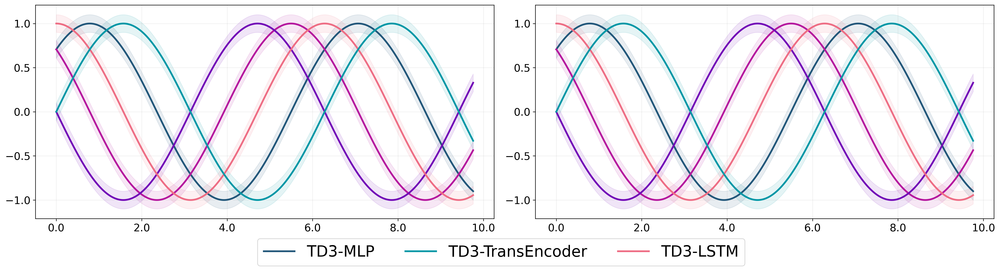

In [54]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Set the color palette
colors = ['#22577A', '#0097A6', '#EE6D84', '#b5179e', '#7209b7']

# Generate sine wave data
t = np.linspace(0, 10, 500)
sin1 = np.sin(t)
sin2 = np.sin(t + np.pi / 4)
sin3 = np.sin(t + np.pi / 2)
sin4 = np.sin(t + 3 * np.pi / 4)
sin5 = np.sin(t + np.pi)

std_dev = 0.1  # Standard deviation for fill_between

# Create a figure with three subplots in a row
fig, axes = plt.subplots(1, 2, figsize=(20, 5), dpi=300)
cutout = 488
linewidth = 2.5
fill_alpha = 0.1

# Function to plot the same graph in each subplot without markers
def plot_sine_waves(ax):
    ax.plot(t[:cutout], sin1[:cutout], color=colors[1], zorder=5, linewidth=linewidth, label='Sine Wave 1')
    ax.fill_between(t[:cutout], sin1[:cutout] - std_dev, sin1[:cutout] + std_dev, color=colors[1], alpha=fill_alpha)

    ax.plot(t[:cutout], sin2[:cutout], color=colors[0], zorder=3, linewidth=linewidth, label='Sine Wave 2')
    ax.fill_between(t[:cutout], sin2[:cutout] - std_dev, sin2[:cutout] + std_dev, color=colors[0], alpha=fill_alpha)

    ax.plot(t[:cutout], sin3[:cutout], color=colors[2], zorder=4, linewidth=linewidth, label='Sine Wave 3')
    ax.fill_between(t[:cutout], sin3[:cutout] - std_dev, sin3[:cutout] + std_dev, color=colors[2], alpha=fill_alpha)

    ax.plot(t[:cutout], sin4[:cutout], color=colors[3], zorder=3, linewidth=linewidth, label='Sine Wave 4')
    ax.fill_between(t[:cutout], sin4[:cutout] - std_dev, sin4[:cutout] + std_dev, color=colors[3], alpha=fill_alpha)

    ax.plot(t[:cutout], sin5[:cutout], color=colors[4], zorder=3, linewidth=linewidth, label='Sine Wave 5')
    ax.fill_between(t[:cutout], sin5[:cutout] - std_dev, sin5[:cutout] + std_dev, color=colors[4], alpha=fill_alpha)

    # Format the x-axis ticks
    ax.xaxis.set_major_formatter(FuncFormatter(lambda x, pos: f"{x:.1f}"))
    
    # Set tick parameters
    ax.tick_params(axis='both', labelsize=15)
    
    ax.grid(True, alpha=0.2)

# Plot the same graph in each subplot
for ax in axes:
    plot_sine_waves(ax)

# Create a common legend below all subplots with color lines
legend_handles = [plt.Line2D([0], [0], color=color, linewidth=2.5, label=label) 
                   for color, label in zip(colors, ['TD3-MLP', 'TD3-TransEncoder', 'TD3-LSTM'])]
legend = fig.legend(handles=legend_handles, loc='lower center', fontsize=22, ncol=6, bbox_to_anchor=(0.5, -0.1))

plt.tight_layout(rect=[0, 0.03, 1, 1])  # Ensure space for legend

# Save the figure with extra padding for the legend
plt.savefig("sine_waves_plot.png", bbox_inches='tight', dpi=250)

plt.show()


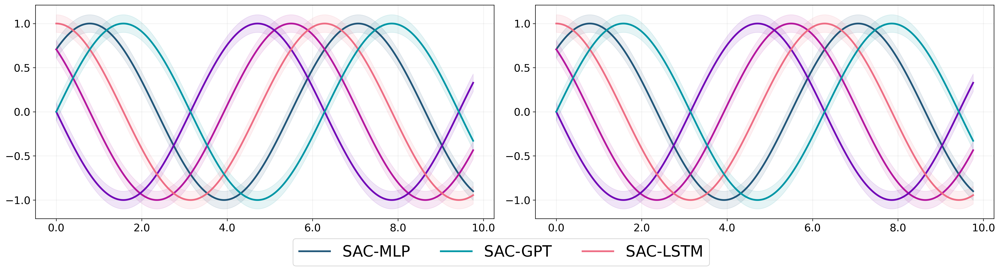

In [49]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Set the color palette
colors = ['#22577A', '#0097A6', '#EE6D84', '#b5179e', '#7209b7']

# Generate sine wave data
t = np.linspace(0, 10, 500)
sin1 = np.sin(t)
sin2 = np.sin(t + np.pi / 4)
sin3 = np.sin(t + np.pi / 2)
sin4 = np.sin(t + 3 * np.pi / 4)
sin5 = np.sin(t + np.pi)

std_dev = 0.1  # Standard deviation for fill_between

# Create a figure with three subplots in a row
fig, axes = plt.subplots(1, 2, figsize=(20, 5), dpi=300)
cutout = 488
linewidth = 2.5
fill_alpha = 0.1

# Function to plot the same graph in each subplot without markers
def plot_sine_waves(ax):
    ax.plot(t[:cutout], sin1[:cutout], color=colors[1], zorder=5, linewidth=linewidth, label='Sine Wave 1')
    ax.fill_between(t[:cutout], sin1[:cutout] - std_dev, sin1[:cutout] + std_dev, color=colors[1], alpha=fill_alpha)

    ax.plot(t[:cutout], sin2[:cutout], color=colors[0], zorder=3, linewidth=linewidth, label='Sine Wave 2')
    ax.fill_between(t[:cutout], sin2[:cutout] - std_dev, sin2[:cutout] + std_dev, color=colors[0], alpha=fill_alpha)

    ax.plot(t[:cutout], sin3[:cutout], color=colors[2], zorder=4, linewidth=linewidth, label='Sine Wave 3')
    ax.fill_between(t[:cutout], sin3[:cutout] - std_dev, sin3[:cutout] + std_dev, color=colors[2], alpha=fill_alpha)

    ax.plot(t[:cutout], sin4[:cutout], color=colors[3], zorder=3, linewidth=linewidth, label='Sine Wave 4')
    ax.fill_between(t[:cutout], sin4[:cutout] - std_dev, sin4[:cutout] + std_dev, color=colors[3], alpha=fill_alpha)

    ax.plot(t[:cutout], sin5[:cutout], color=colors[4], zorder=3, linewidth=linewidth, label='Sine Wave 5')
    ax.fill_between(t[:cutout], sin5[:cutout] - std_dev, sin5[:cutout] + std_dev, color=colors[4], alpha=fill_alpha)

    # Format the x-axis ticks
    ax.xaxis.set_major_formatter(FuncFormatter(lambda x, pos: f"{x:.1f}"))
    
    # Set tick parameters
    ax.tick_params(axis='both', labelsize=15)
    
    ax.grid(True, alpha=0.2)

# Plot the same graph in each subplot
for ax in axes:
    plot_sine_waves(ax)

# Create a common legend below all subplots with color lines
legend_handles = [plt.Line2D([0], [0], color=color, linewidth=2.5, label=label) 
                   for color, label in zip(colors, ['SAC-MLP', 'SAC-GPT', 'SAC-LSTM'])]
legend = fig.legend(handles=legend_handles, loc='lower center', fontsize=22, ncol=6, bbox_to_anchor=(0.5, -0.1))

plt.tight_layout(rect=[0, 0.03, 1, 1])  # Ensure space for legend

# Save the figure with extra padding for the legend
plt.savefig("sine_waves_plot.png", bbox_inches='tight', dpi=250)

plt.show()


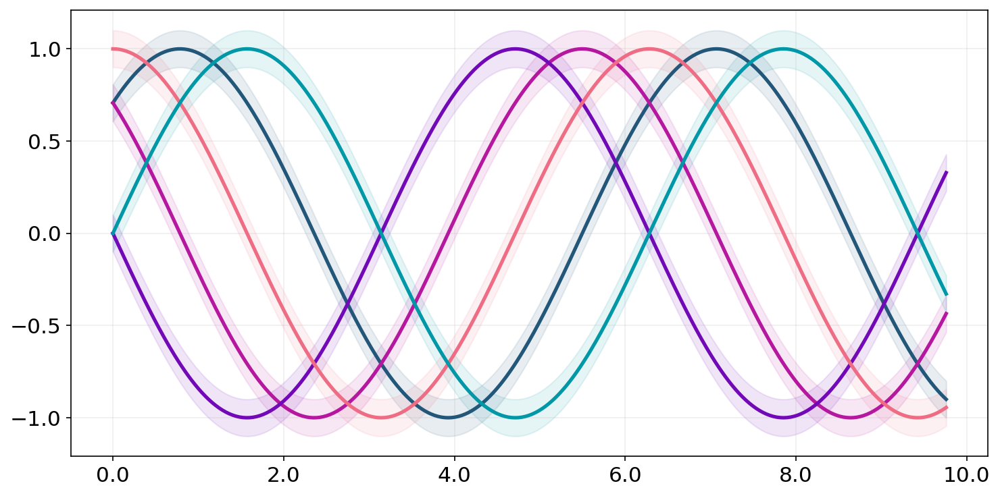

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Set the color palette
colors = ['#22577A', '#0097A6', '#EE6D84', '#b5179e', '#7209b7']

# Generate sine wave data
t = np.linspace(0, 10, 500)
sin1 = np.sin(t)
sin2 = np.sin(t + np.pi / 4)
sin3 = np.sin(t + np.pi / 2)
sin4 = np.sin(t + 3 * np.pi / 4)
sin5 = np.sin(t + np.pi)

std_dev = 0.1  # Standard deviation for fill_between

# Create a figure with three subplots in a row
fig, axes = plt.subplots(1, 1, figsize=(10, 5), dpi=150)
cutout = 488
linewidth = 2.5
fill_alpha = 0.1

def plot_sine_waves(ax):
    ax.plot(t[:cutout], sin1[:cutout], color=colors[1], zorder=5, linewidth=linewidth, label='Sine Wave 1')
    ax.fill_between(t[:cutout], sin1[:cutout] - std_dev, sin1[:cutout] + std_dev, color=colors[1], alpha=fill_alpha)

    ax.plot(t[:cutout], sin2[:cutout], color=colors[0], zorder=3, linewidth=linewidth, label='Sine Wave 2')
    ax.fill_between(t[:cutout], sin2[:cutout] - std_dev, sin2[:cutout] + std_dev, color=colors[0], alpha=fill_alpha)

    ax.plot(t[:cutout], sin3[:cutout], color=colors[2], zorder=4, linewidth=linewidth, label='Sine Wave 3')
    ax.fill_between(t[:cutout], sin3[:cutout] - std_dev, sin3[:cutout] + std_dev, color=colors[2], alpha=fill_alpha)

    ax.plot(t[:cutout], sin4[:cutout], color=colors[3], zorder=3, linewidth=linewidth, label='Sine Wave 4')
    ax.fill_between(t[:cutout], sin4[:cutout] - std_dev, sin4[:cutout] + std_dev, color=colors[3], alpha=fill_alpha)

    ax.plot(t[:cutout], sin5[:cutout], color=colors[4], zorder=3, linewidth=linewidth, label='Sine Wave 5')
    ax.fill_between(t[:cutout], sin5[:cutout] - std_dev, sin5[:cutout] + std_dev, color=colors[4], alpha=fill_alpha)

    # Format the x-axis ticks
    ax.xaxis.set_major_formatter(FuncFormatter(lambda x, pos: f"{x:.1f}"))
    
    # Set tick parameters
    ax.tick_params(axis='both', labelsize=15)
    
    ax.grid(True, alpha=0.2)

plot_sine_waves(axes)

plt.savefig('./exp_1_mujoco_all', dpi=150)
plt.tight_layout()
plt.show()


In [68]:
import numpy as np
lst = np.array([639, 229, 486])

In [69]:
lst.mean(), lst.std()

(np.float64(451.3333333333333), np.float64(169.16724137833413))